# CrabNet Bandgap Prediction for Chalcogenide Perovskites

This notebook implements the **composition-based bandgap prediction** described in
Section 3.3 of the manuscript. We use [CrabNet v2](https://doi.org/10.1038/s41524-021-00545-1)
(Compositionally-Restricted Attention-Based Network) with **Pettifor composition
fingerprints** as extended features.

**Training data** — three sources, merged and deduplicated:

| Source | Description | Approx. entries |
|--------|-------------|----------------:|
| Halide perovskites | NOMAD bandgap records (ABX₃, X = halide) | ~51 000 |
| Chalcogenide perovskites | Experimentally reported (ABX₃, X = S, Se) | 17 |
| Chalcogenide semiconductors | Literature with Chem Data Extractor (non-perovskite chalcogenides) | ~17 800 |

**Key analysis additions**:
- Leave-One-Out Cross-Validation (LOOCV) on the 11 unique chalcogenide perovskite
  formulas to obtain per-compound error estimates.
- Publication-quality parity plot with color coding by data source.
- Ablation studies for data-source contribution and Pettifor features.
- Null-model baselines (median / mean predictor).

---
## 0. Setup

In [30]:
from __future__ import annotations

import warnings
warnings.filterwarnings('ignore')

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# --- Patch SWA for PyTorch >= 2.x compatibility ---
# CrabNet v2.0.8 bundles its own SWA (crabnet.utils.optim.SWA) which lacks
# attributes expected by modern PyTorch optimizers.
from crabnet.utils.optim import SWA  # type: ignore
_original_swa_init = SWA.__init__
def _patched_swa_init(self, *args, **kwargs):
    _original_swa_init(self, *args, **kwargs)
    if not hasattr(self, '_optimizer_step_pre_hooks'):
        self._optimizer_step_pre_hooks = {}
    if not hasattr(self, '_optimizer_step_post_hooks'):
        self._optimizer_step_post_hooks = {}
SWA.__init__ = _patched_swa_init
# ------------------------------------------------

from crabnet.crabnet_ import CrabNet          # type: ignore
from crabnet.utils.data import groupby_formula # type: ignore

from tf_chpvk_pv.config import (
    RAW_DATA_DIR, PROCESSED_DATA_DIR, INTERIM_DATA_DIR,
    TRAINED_MODELS, FIGURES_DIR,
)
from tf_chpvk_pv.modeling.CrabNet.utils import (
    DEVICE,
    get_raw_data,
    save_processed_data,
    get_petiffor_features,
    load_model,
    test_r2_score,
    predict_bandgap,
    get_CrystaLLM_predictions,
    get_SISSO_predictions,
    get_experimental_predictions,
)

RANDOM_SEED = 42
print(f'Device: {DEVICE}')

# Matplotlib defaults for publication figures
mpl.rcParams.update({
    'font.size': 16,
    'axes.labelsize': 16,
    'axes.titlesize': 18,
    'figure.dpi': 150,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
})

Device: mps


---
## 1. Data Loading & Preprocessing

We load three CSV sources, tag each row with its origin, and apply the following
filters:
1. Drop rows with missing bandgap or formula.
2. Keep only entries with bandgap > 1.0 eV.
3. Remove outliers: entries whose bandgap deviates more than 0.3 eV from the
   median of their formula group.

> **Note:** Outlier removal is applied on the full dataset before splitting, which
> could introduce a minor information leak. This is a deliberate preprocessing
> choice — the medians used for filtering are per-formula statistics that barely
> change when a single entry is held out.

In [2]:
from tf_chpvk_pv.dataset import get_perovskite_data_NOMAD

# Ensure the NOMAD data file exists locally
get_perovskite_data_NOMAD(False)

# Load & clean
df = get_raw_data()
print(f'Cleaned dataset: {df.shape[0]} rows, {df["reduced_formulas"].nunique()} unique formulas')
df.head(3)

Importing existing data... with size: (51123, 3)
The data comes from the following sources:
74.16 % from halide perovskites,
0.0247 % from chalcogenides perovskites,
25.82 % from chalcogenide semiconductors
Cleaned dataset: 50661 rows, 3628 unique formulas


,reduced_formulas,descriptive_formulas,bandgap,source
0,CH6I3NPb,MAPbI3,1.6,pvk
2,CH6I3NPb,MAPbI3,1.5,pvk
3,CH6I3NPb,MAPbI3,1.6,pvk


---
## 2. Formula Grouping & Deduplication

Many formulas appear multiple times with different reported bandgap values.
We group by formula and take the **median** bandgap to obtain one target per
unique composition. The `source` column is preserved on the original DataFrame
for later use in stratified splitting and LOOCV.

In [3]:
# Rename to CrabNet convention
df.rename(columns={'bandgap': 'target', 'reduced_formulas': 'formula'}, inplace=True)

# Group repeated formulas — median target
df_grouped = groupby_formula(df, how='median')

# Attach source information to the grouped frame
for formula in df_grouped['formula']:
    df_grouped.loc[df_grouped['formula'] == formula, 'source'] = (
        df.loc[df['formula'] == formula, 'source'].values[0]
    )

# Source breakdown
src_pct = (df_grouped['source'].value_counts() / len(df_grouped) * 100)
print(f'Unique compositions: {len(df_grouped)}')
for src, pct in src_pct.items():
    print(f'  {src:20s}: {pct:6.2f}%')

save_processed_data(df_grouped)

Unique compositions: 3628
  chalc_semicon       :  56.17%
  pvk                 :  43.52%
  chalcogenides       :   0.30%
2026-02-17 15:20:10.200 | INFO     | tf_chpvk_pv.modeling.CrabNet.utils:save_processed_data:69 - Processed data saved to /Users/pepemarquez/git/Pepe-Marquez/TF-ChPVK-PV/data/interim/df_grouped_formula_complete_dataset.csv


---
## 3. Feature Engineering — Pettifor Composition Embedding

We compute a 98-dimensional Pettifor fingerprint for each formula using a
composition-weighted embedding matrix. The data is then split
**80 / 10 / 10** (train / validation / test) with **stratification by source**
to maintain the class balance across splits.

In [4]:
# Drop source before splitting (get_petiffor_features re-adds it internally for stratification)
df_grouped_no_src = df_grouped.drop(columns=['source'])

train_df, val_df, test_df, feature_names = get_petiffor_features(
    df_grouped_no_src, original_df=df, train=True
)

print(f'Train: {len(train_df):>5d}  |  Val: {len(val_df):>5d}  |  Test: {len(test_df):>5d}')
print(f'Pettifor feature columns: {len(feature_names)}')

Train:  2902  |  Val:   363  |  Test:   363
Pettifor feature columns: 98


### Element Prevalence

Visual check of elemental coverage in the training set using
[pymatviz](https://pymatviz.janosh.dev/).

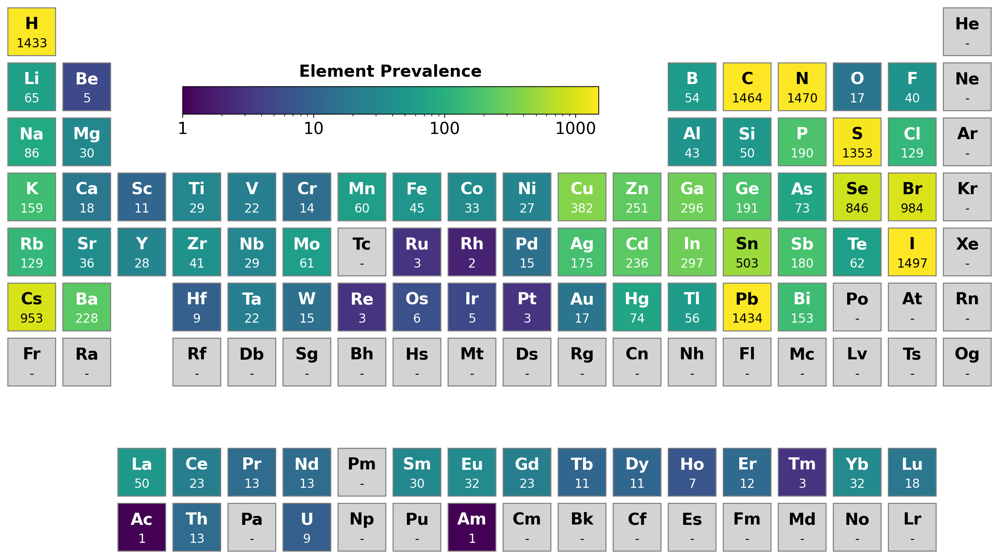

In [5]:
import re
from pymatviz import count_elements, ptable_heatmap  # type: ignore

element_counts = count_elements(
    [re.sub(r'\d+', '', x).replace('.', '') for x in df_grouped['formula']]
)
ptable_heatmap(element_counts, log=True, cbar_title='Element Prevalence')
plt.show()

---
## 4. Model Training

We train CrabNet with the **mat2vec** elemental embedding and the Pettifor
fingerprint columns as `extend_features`. CrabNet uses its default
hyperparameters (3 attention layers, 512 dim, 4 heads, SWA) with
`learningcurve=True` to track training dynamics.


Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2902/2902 [00:00<00:00, 302376.66formulae/s]


skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 300006.37formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.458 val mae: 0.459


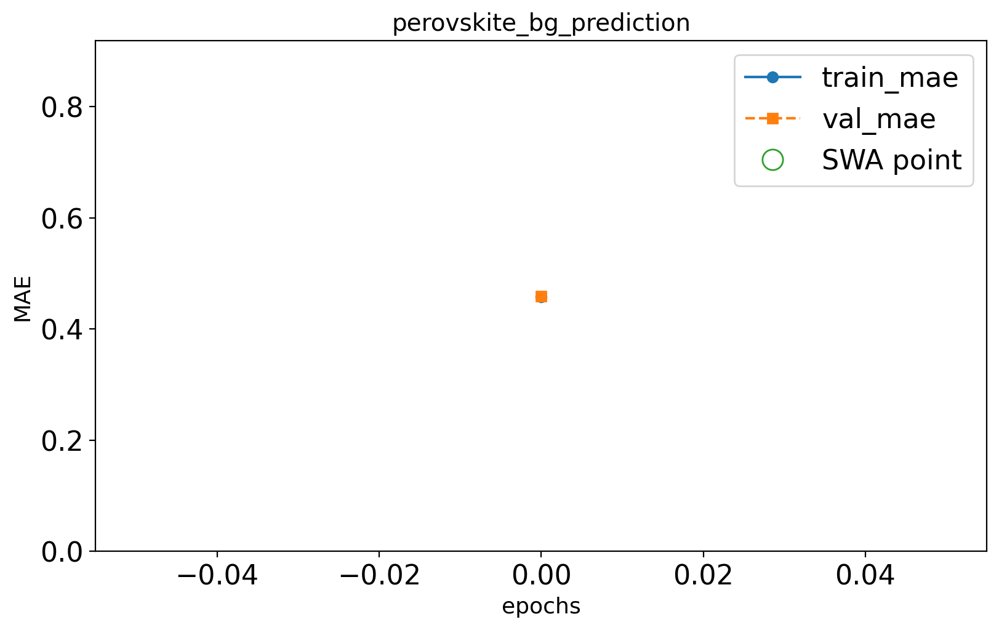

Epoch: 19/300 --- train mae: 0.251 val mae: 0.291


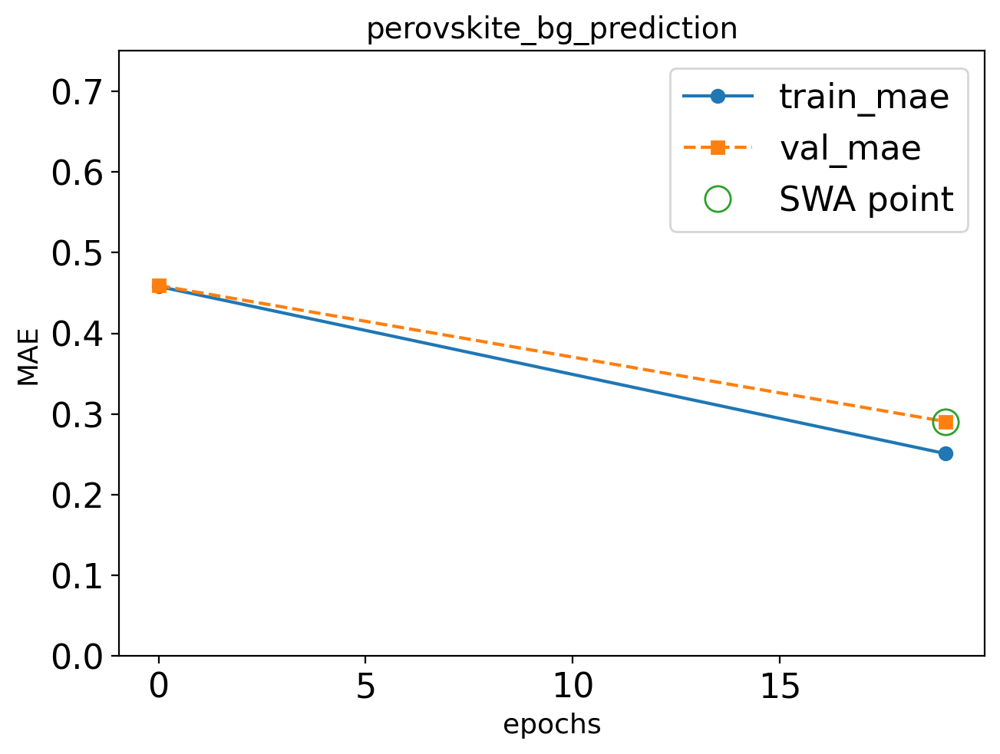

Epoch: 39/300 --- train mae: 0.163 val mae: 0.276


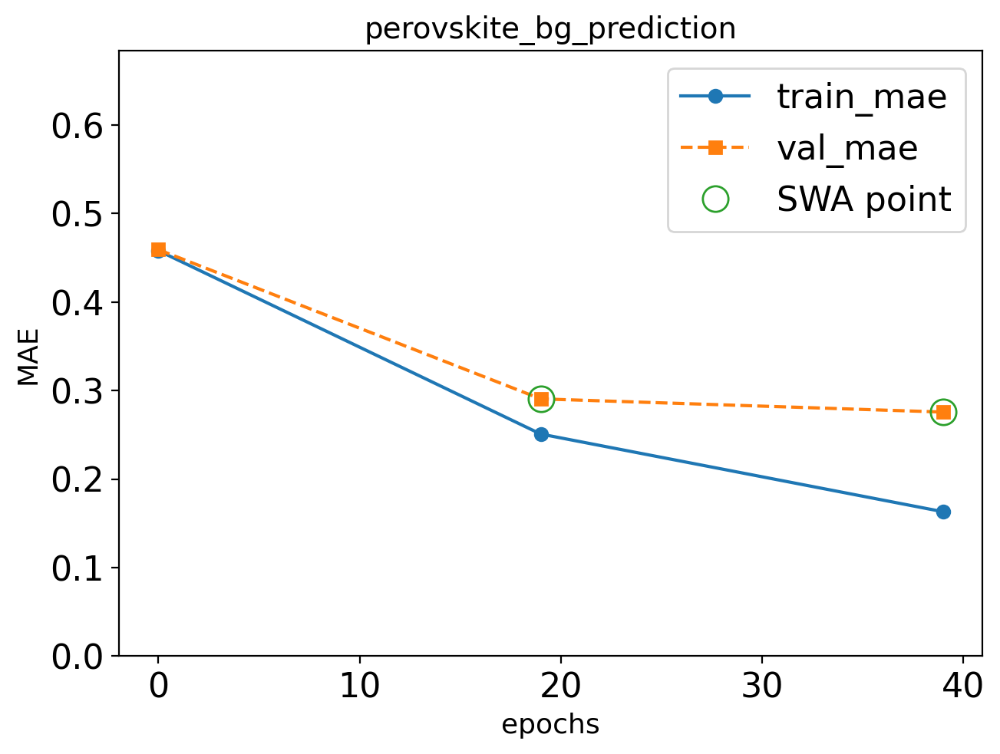

Epoch: 59/300 --- train mae: 0.117 val mae: 0.271


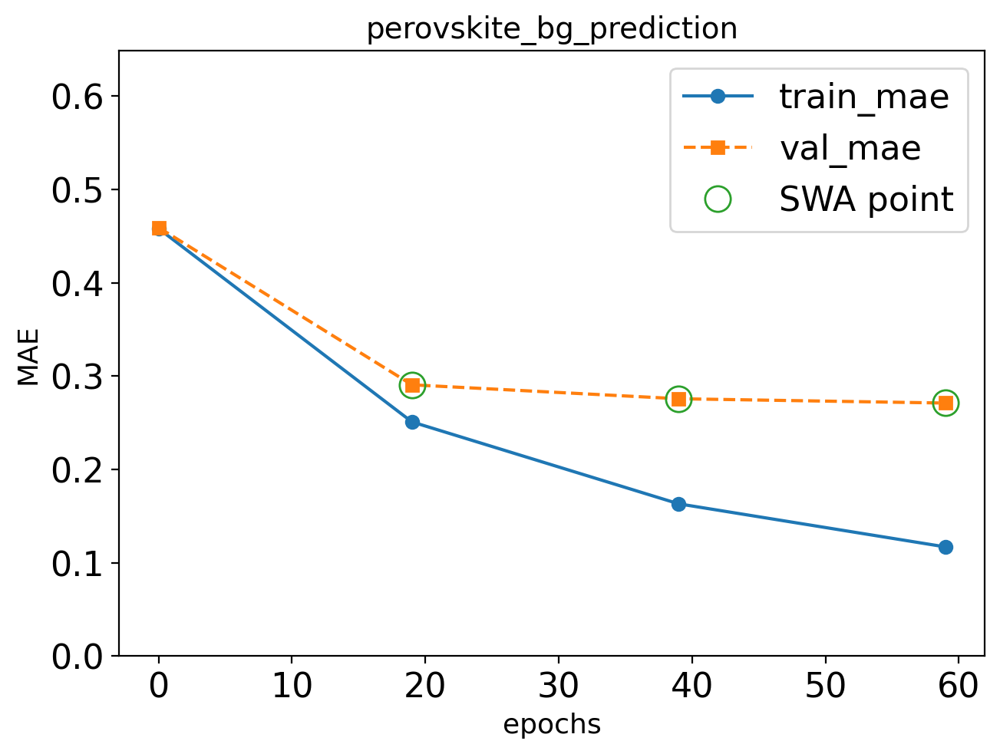

Epoch 79 failed to improve.
Discarded: 1/3 weight updates
Epoch: 79/300 --- train mae: 0.0857 val mae: 0.277


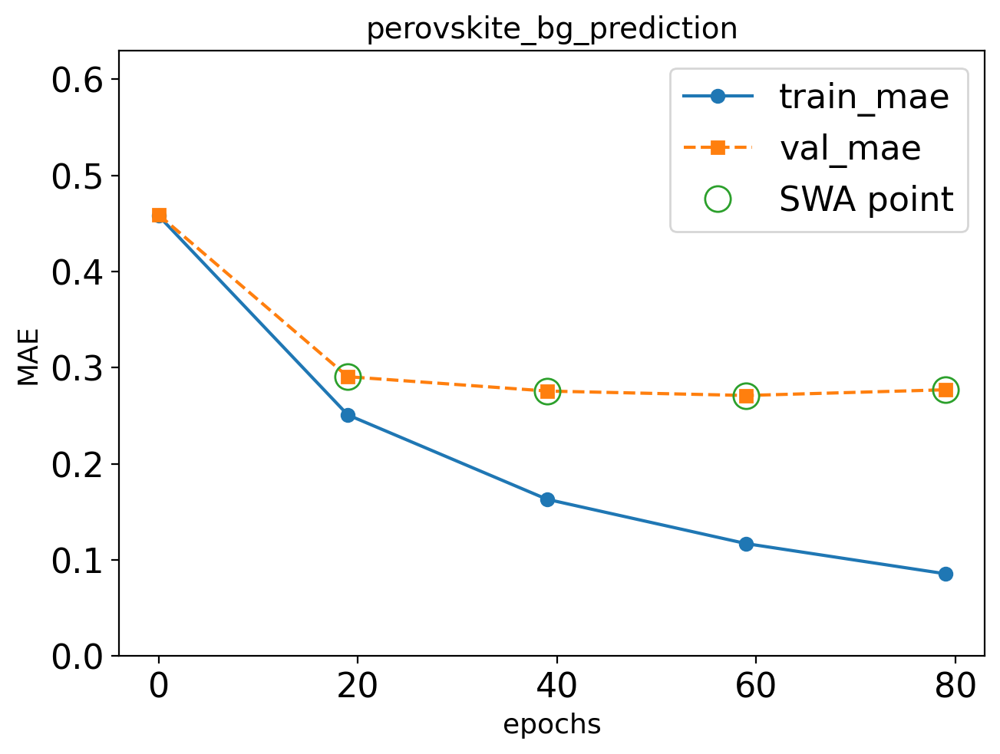

Epoch: 99/300 --- train mae: 0.0665 val mae: 0.275


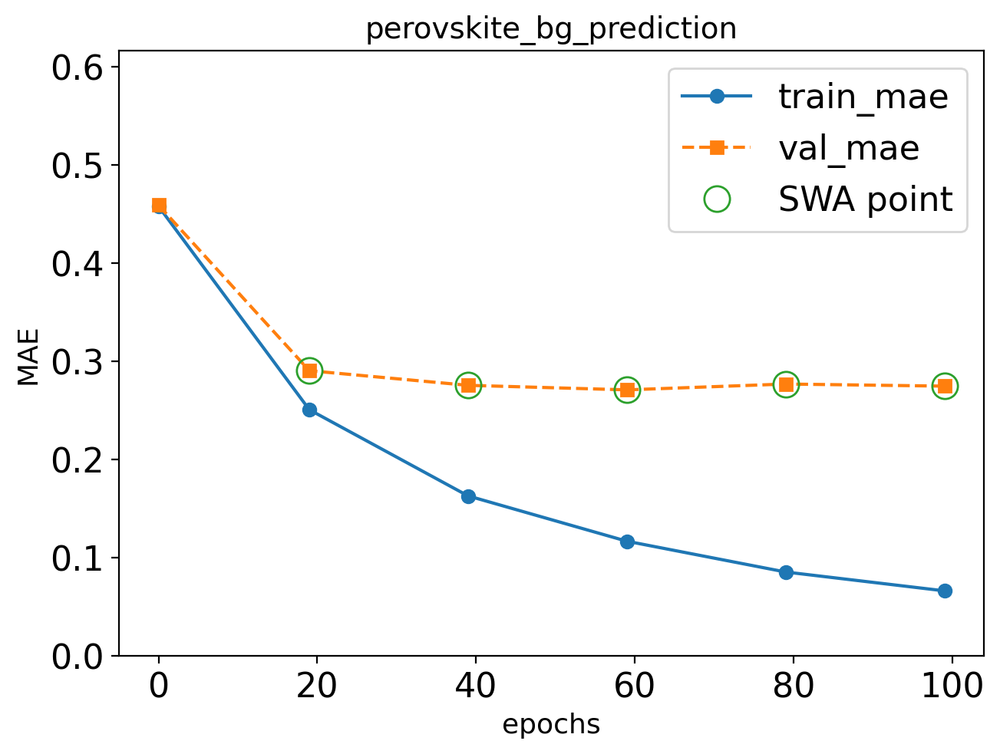

Epoch 119 failed to improve.
Discarded: 2/3 weight updates
Epoch: 119/300 --- train mae: 0.0535 val mae: 0.278


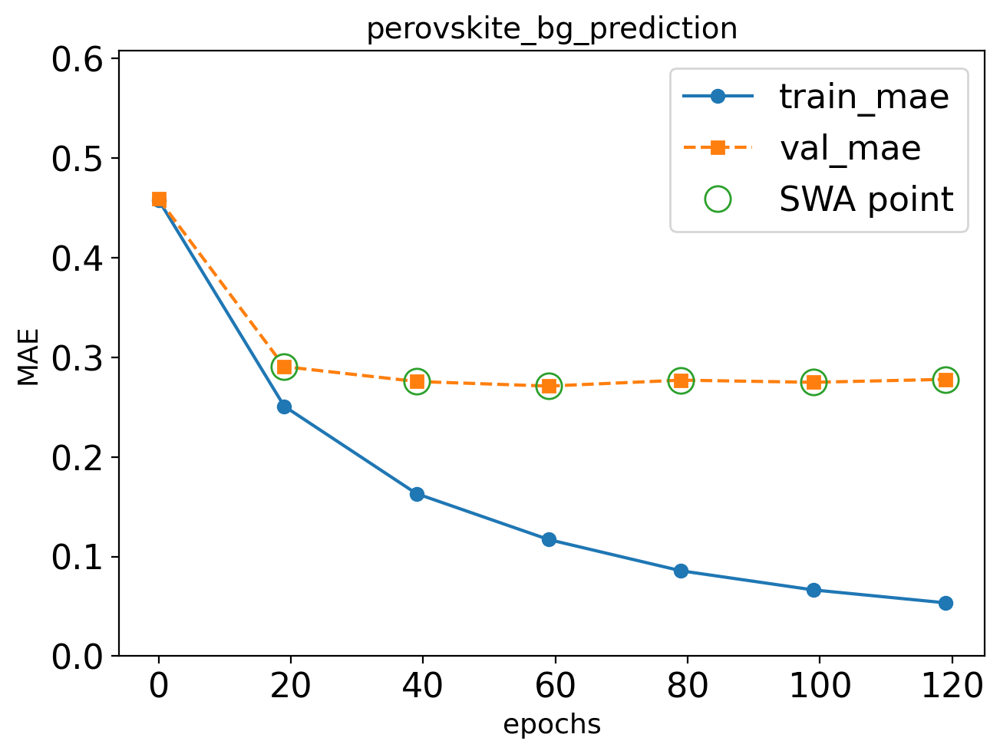

Epoch 139 failed to improve.
Discarded: 3/3 weight updates
Epoch: 139/300 --- train mae: 0.0448 val mae: 0.277


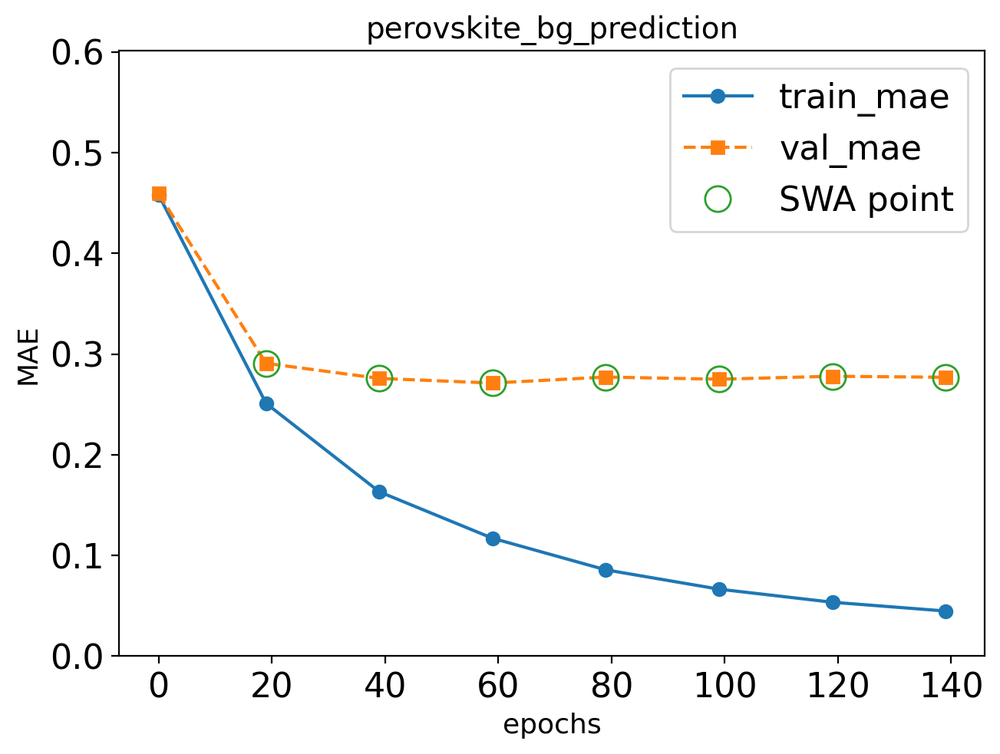

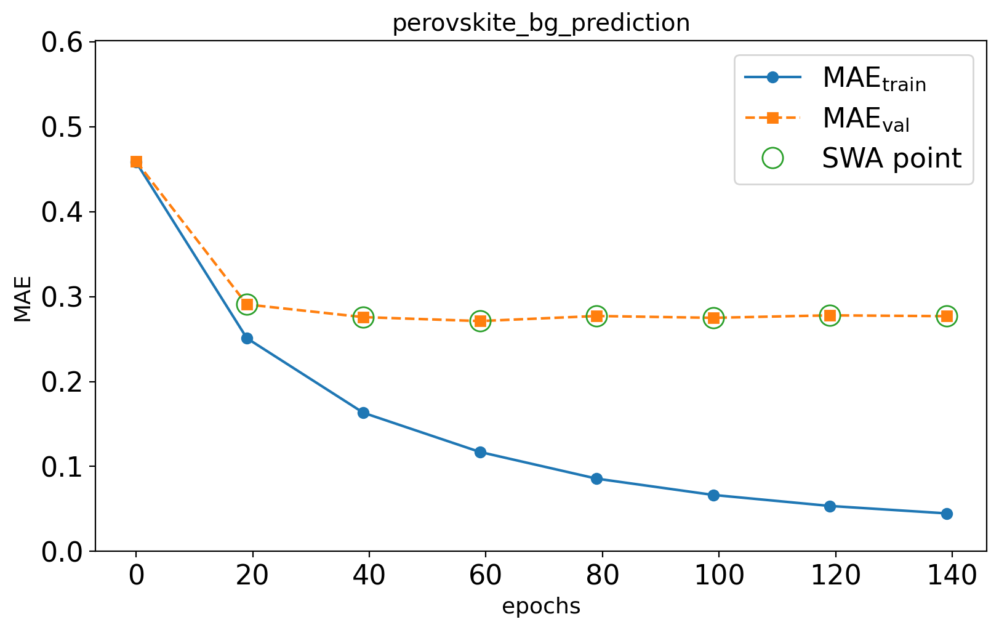

Discarded: 3/3weight updates, early-stopping now
Saving network (perovskite_bg_prediction) to models/trained_models/perovskite_bg_prediction.pth


In [6]:
crabnet_bg = CrabNet(
    mat_prop='bandgap',
    model_name='perovskite_bg_prediction',
    elem_prop='mat2vec',
    learningcurve=True,
    extend_features=feature_names,
)
crabnet_bg.fit(train_df, val_df)

---
## 5. Model Evaluation

We evaluate on the held-out test set, broken down by source to reveal
performance differences across the three data domains.

In [7]:
# --- Collect per-source test metrics ---
# Re-attach source labels to the test set
test_df_src = test_df.copy()
for formula in test_df_src['formula']:
    test_df_src.loc[test_df_src['formula'] == formula, 'source'] = (
        df.loc[df['formula'] == formula, 'source'].values[0]
    )

rows = []
for split_name, split_df in [('train', train_df), ('val', val_df), ('test', test_df)]:
    m = test_r2_score(split_df, feature_names, crabnet_bandgap=crabnet_bg, plot=False)
    rows.append({'split': split_name, 'n': len(split_df),
                 'R²': m['r2'], 'MAE (eV)': m['mae'], 'RMSE (eV)': np.sqrt(m['mse'])})

# Per-source on test set
for src in ['pvk', 'chalcogenides', 'chalc_semicon']:
    df_src = test_df_src[test_df_src['source'] == src]
    if len(df_src) == 0:
        rows.append({'split': f'test/{src}', 'n': 0, 'R²': None, 'MAE (eV)': None, 'RMSE (eV)': None})
        continue
    m = test_r2_score(df_src, feature_names, crabnet_bandgap=crabnet_bg, plot=False)
    rows.append({'split': f'test/{src}', 'n': len(df_src),
                 'R²': m['r2'], 'MAE (eV)': m['mae'], 'RMSE (eV)': np.sqrt(m['mse'])})

metrics_table = pd.DataFrame(rows)
metrics_table.style.format({'R²': '{:.3f}', 'MAE (eV)': '{:.3f}', 'RMSE (eV)': '{:.3f}'}, na_rep='—')

Generating EDM: 100%|██████████| 2902/2902 [00:00<00:00, 359603.82formulae/s]


skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 316403.23formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.3725
MSE: 0.2363
MAE: 0.2722 eV


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 331778.68formulae/s]


skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.3819
MSE: 0.2673
MAE: 0.2579 eV


Generating EDM: 100%|██████████| 158/158 [00:00<00:00, 218568.61formulae/s]


skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.6334
MSE: 0.0336
MAE: 0.0937 eV


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 38479.85formulae/s]


loading data with up to 9 elements in the formula
R2 score: nan
MSE: 0.0808
MAE: 0.2843 eV


Generating EDM: 100%|██████████| 204/204 [00:00<00:00, 380452.65formulae/s]

loading data with up to 9 elements in the formula
R2 score: 0.2684
MSE: 0.4491
MAE: 0.3850 eV


,split,n,R²,MAE (eV),RMSE (eV)
0,train,2902,0.887,0.081,0.205
1,val,363,0.373,0.272,0.486
2,test,363,0.382,0.258,0.517
3,test/pvk,158,0.633,0.094,0.183
4,test/chalcogenides,1,—,0.284,0.284
5,test/chalc_semicon,204,0.268,0.385,0.670


---
## 6. Leave-One-Out Cross-Validation — Chalcogenide Perovskites

With only **11 unique chalcogenide perovskite formulas**, a standard random
split places 0–1 compounds in the test set, making per-compound error
estimation unreliable. We therefore apply **LOOCV**: for each of the 11
formulas, we hold it out, retrain CrabNet on the remaining ~3 600 compounds
(including all halide perovskites and chalcogenide semiconductors), and
predict the held-out compound.

This provides the most honest estimate of how well the model extrapolates
to *unseen* chalcogenide perovskites — the key claim of the paper.

In [8]:
# Identify unique chalcogenide perovskite formulas in the grouped data
chalc_mask = df_grouped['source'] == 'chalcogenides'
df_chalc_grouped = df_grouped.loc[chalc_mask, ['formula', 'target']].copy()

# Remove BaTiS3 and CaZrS3 — not clearly perovskite-type structures
df_chalc_grouped = df_chalc_grouped[~df_chalc_grouped['formula'].isin(['BaTiS3', 'CaZrS3'])]

chalc_formulas = df_chalc_grouped['formula'].values
chalc_targets  = df_chalc_grouped['target'].values

# Compute experimental std dev per formula from the raw chalcogenide CSV
df_raw_chalc = pd.read_csv(RAW_DATA_DIR / 'chalcogenides_bandgap_devices.csv')
expt_stats = df_raw_chalc.groupby('reduced_formulas')['bandgap'].agg(['median', 'std', 'count'])
expt_stats['std'] = expt_stats['std'].fillna(0.0)  # single-entry formulas → std = 0

chalc_expt_std = np.array([
    expt_stats.loc[f, 'std'] if f in expt_stats.index else 0.0
    for f in chalc_formulas
])

print(f'Chalcogenide perovskite formulas for LOOCV: {len(chalc_formulas)}')
for f, t, s in zip(chalc_formulas, chalc_targets, chalc_expt_std):
    n = int(expt_stats.loc[f, 'count']) if f in expt_stats.index else 0
    print(f'  {f:30s}  Eg = {t:.2f} ± {s:.3f} eV  (n={n})')

Chalcogenide perovskite formulas for LOOCV: 9
  Ba(Zr0.95Ti0.05)S3              Eg = 1.63 ± 0.000 eV  (n=1)
  Ba(Zr0.96Ti0.04)S3              Eg = 1.51 ± 0.000 eV  (n=1)
  BaHfS3                          Eg = 2.12 ± 0.078 eV  (n=2)
  BaZr(S0.6Se0.4)3                Eg = 1.76 ± 0.000 eV  (n=1)
  BaZrS3                          Eg = 1.85 ± 0.083 eV  (n=4)
  BaZrSe3                         Eg = 1.30 ± 0.000 eV  (n=1)
  LaYS3                           Eg = 2.30 ± 0.000 eV  (n=1)
  SrHfS3                          Eg = 2.37 ± 0.064 eV  (n=2)
  SrZrS3                          Eg = 2.09 ± 0.064 eV  (n=2)


In [13]:
# Load raw chalcogenide data to verify formulas
raw_chalc_path = RAW_DATA_DIR / 'chalcogenides_bandgap_devices.csv'
df_raw_chalc = pd.read_csv(raw_chalc_path)
print(f'\nRaw chalcogenide data: {len(df_raw_chalc)} entries')
print(f'\nUnique formulas in raw data:')
for formula in sorted(df_raw_chalc['reduced_formulas'].unique()):
    entries = df_raw_chalc[df_raw_chalc['reduced_formulas'] == formula]
    print(f'  {formula:30s}  n={len(entries):2d}  Eg range: {entries["bandgap"].min():.2f}–{entries["bandgap"].max():.2f} eV')
    
print(f'\nFormulas in grouped data (source="chalcogenides"):')
for formula in sorted(chalc_formulas):
    print(f'  {formula}')


Raw chalcogenide data: 17 entries

Unique formulas in raw data:
  Ba(Zr0.95Ti0.05)S3              n= 1  Eg range: 1.63–1.63 eV
  Ba(Zr0.96Ti0.04)S3              n= 1  Eg range: 1.51–1.51 eV
  BaHfS3                          n= 2  Eg range: 2.06–2.17 eV
  BaTiS3                          n= 1  Eg range: 1.30–1.30 eV
  BaZr(S0.6Se0.4)3                n= 1  Eg range: 1.76–1.76 eV
  BaZrS3                          n= 4  Eg range: 1.75–1.94 eV
  BaZrSe3                         n= 1  Eg range: 1.30–1.30 eV
  CaZrS3                          n= 1  Eg range: 1.50–1.50 eV
  LaYS3                           n= 1  Eg range: 2.30–2.30 eV
  SrHfS3                          n= 2  Eg range: 2.32–2.41 eV
  SrZrS3                          n= 2  Eg range: 2.05–2.14 eV

Formulas in grouped data (source="chalcogenides"):
  Ba(Zr0.95Ti0.05)S3
  Ba(Zr0.96Ti0.04)S3
  BaHfS3
  BaZr(S0.6Se0.4)3
  BaZrS3
  BaZrSe3
  LaYS3
  SrHfS3
  SrZrS3



--- LOOCV fold 1/9: holding out Ba(Zr0.95Ti0.05)S3 ---

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 309405.38formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 351056.57formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.453 val mae: 0.452


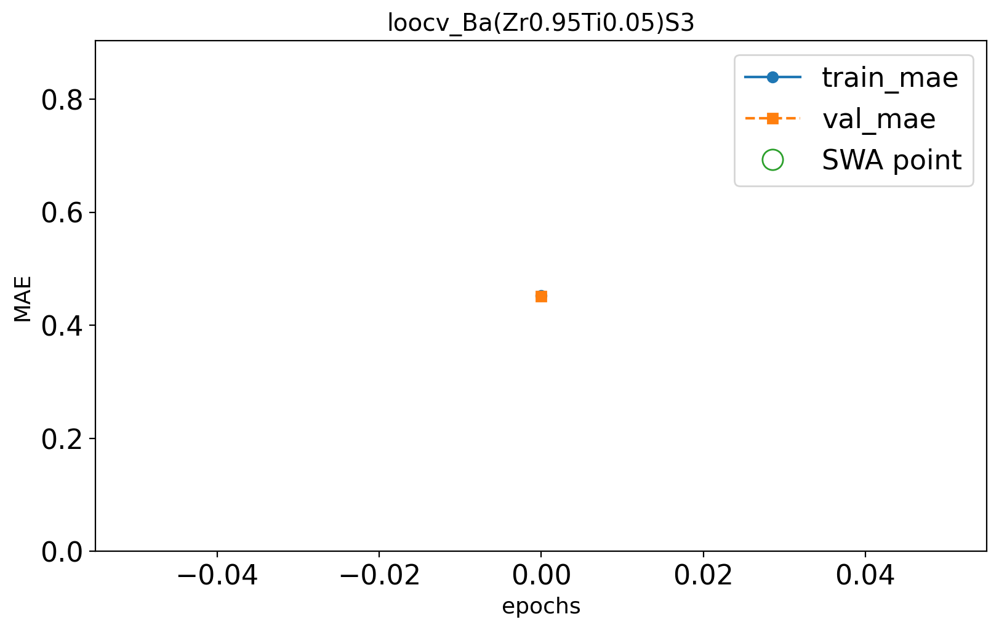

Epoch: 19/300 --- train mae: 0.243 val mae: 0.296


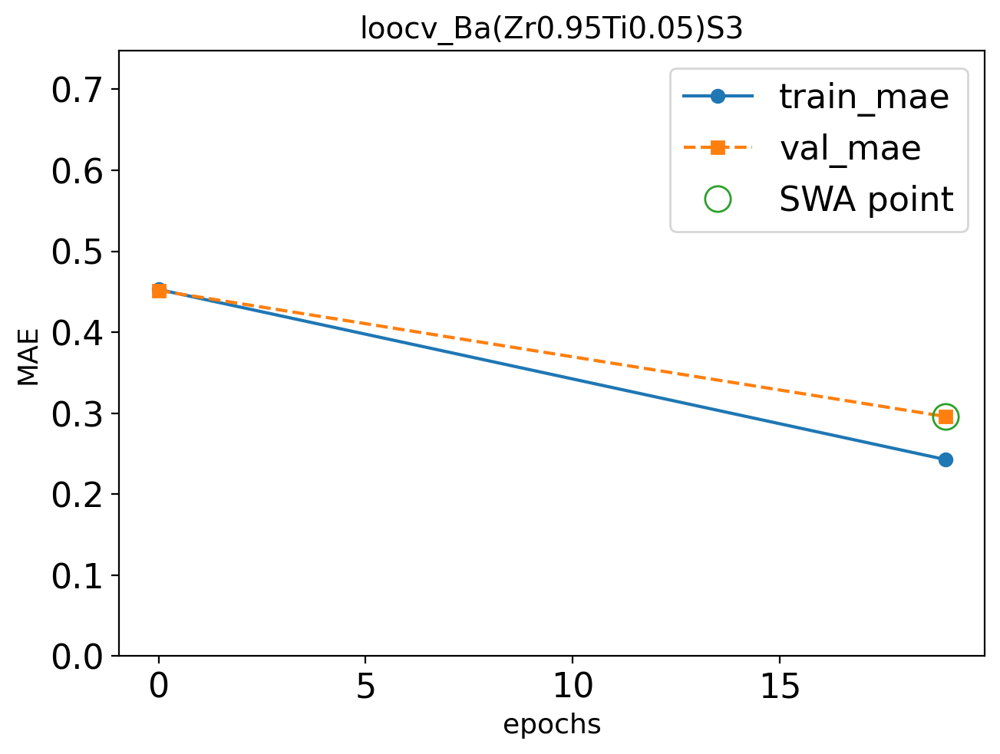

Epoch: 39/300 --- train mae: 0.157 val mae: 0.274


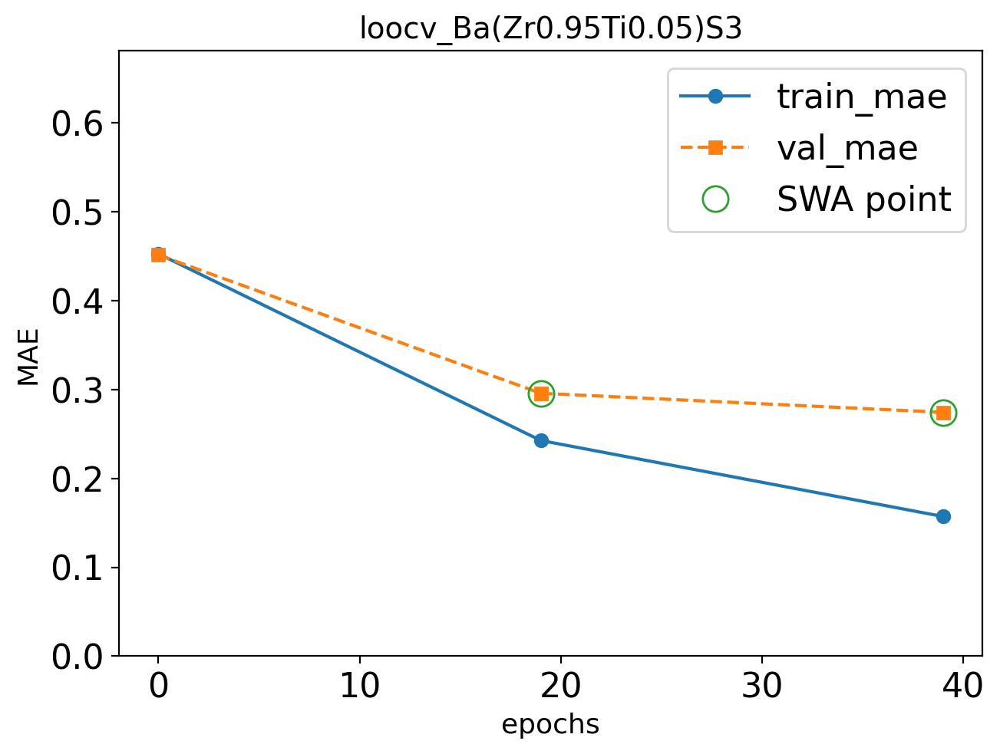

Epoch: 59/300 --- train mae: 0.106 val mae: 0.264


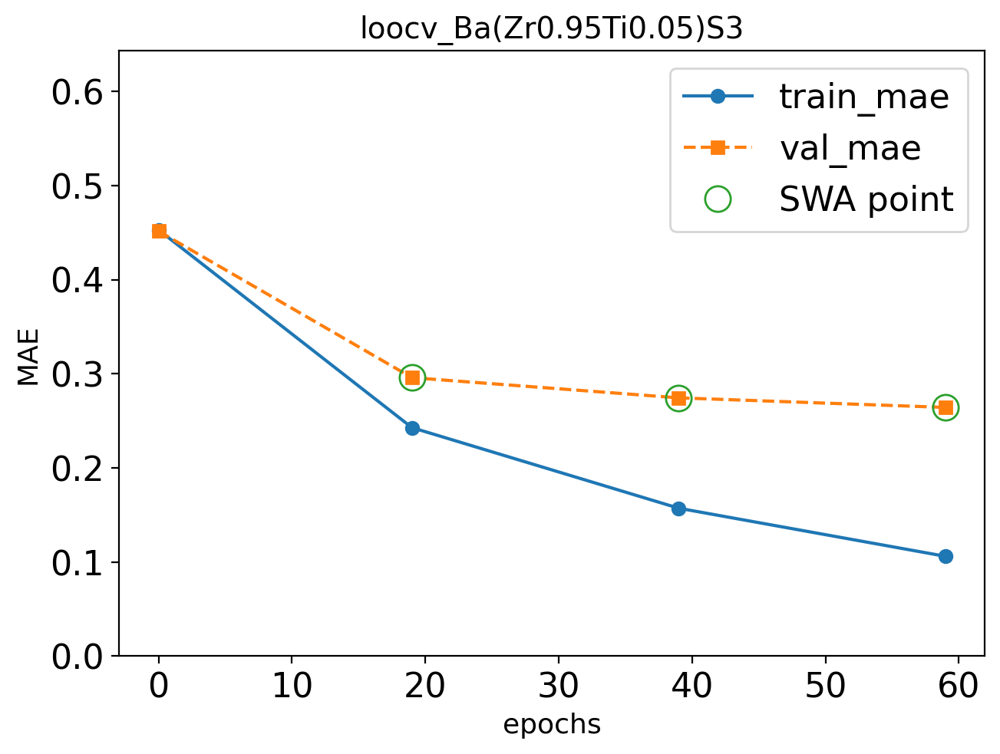

Epoch 79 failed to improve.
Discarded: 1/3 weight updates
Epoch: 79/300 --- train mae: 0.0793 val mae: 0.267


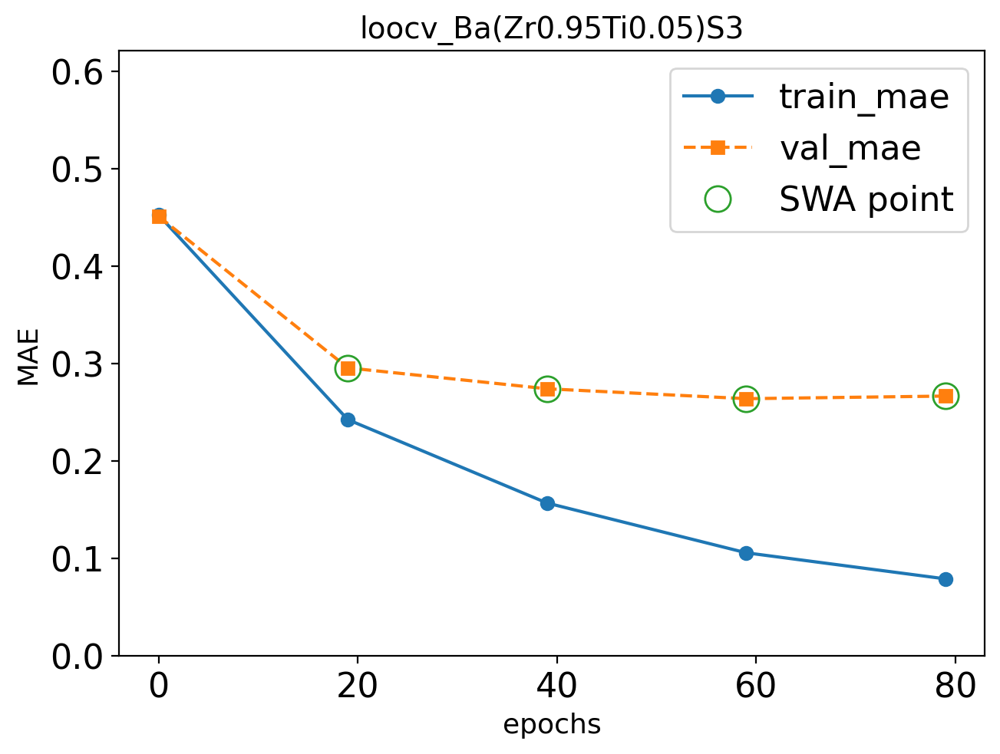

Epoch: 99/300 --- train mae: 0.0625 val mae: 0.26


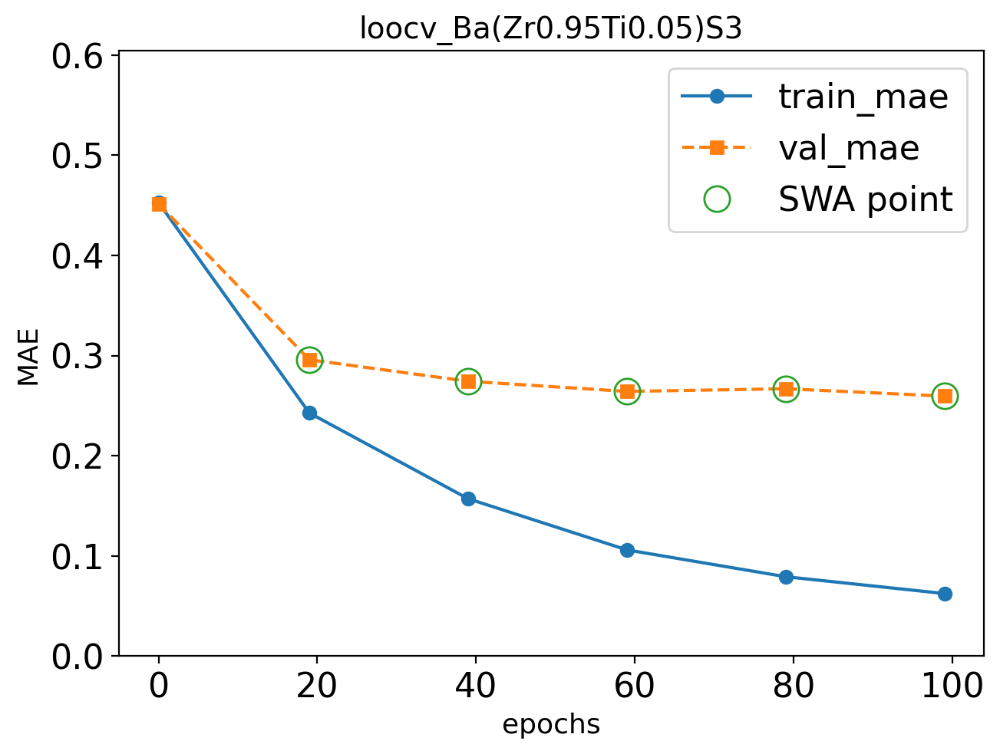

Epoch 119 failed to improve.
Discarded: 2/3 weight updates
Epoch: 119/300 --- train mae: 0.0517 val mae: 0.266


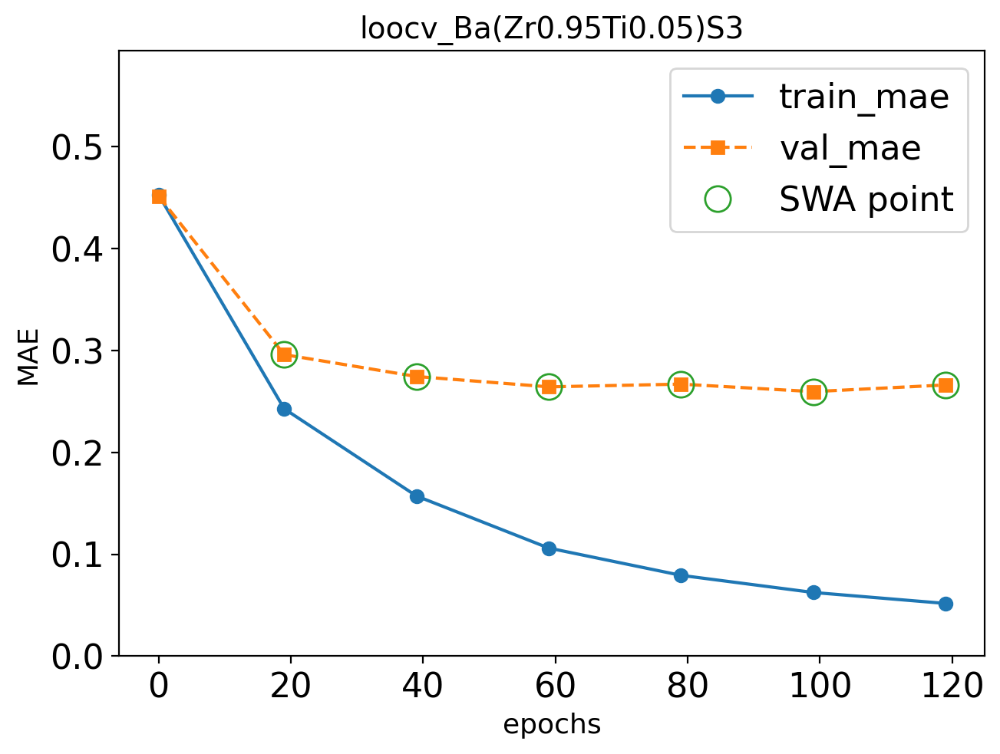

Epoch 139 failed to improve.
Discarded: 3/3 weight updates
Epoch: 139/300 --- train mae: 0.0444 val mae: 0.263


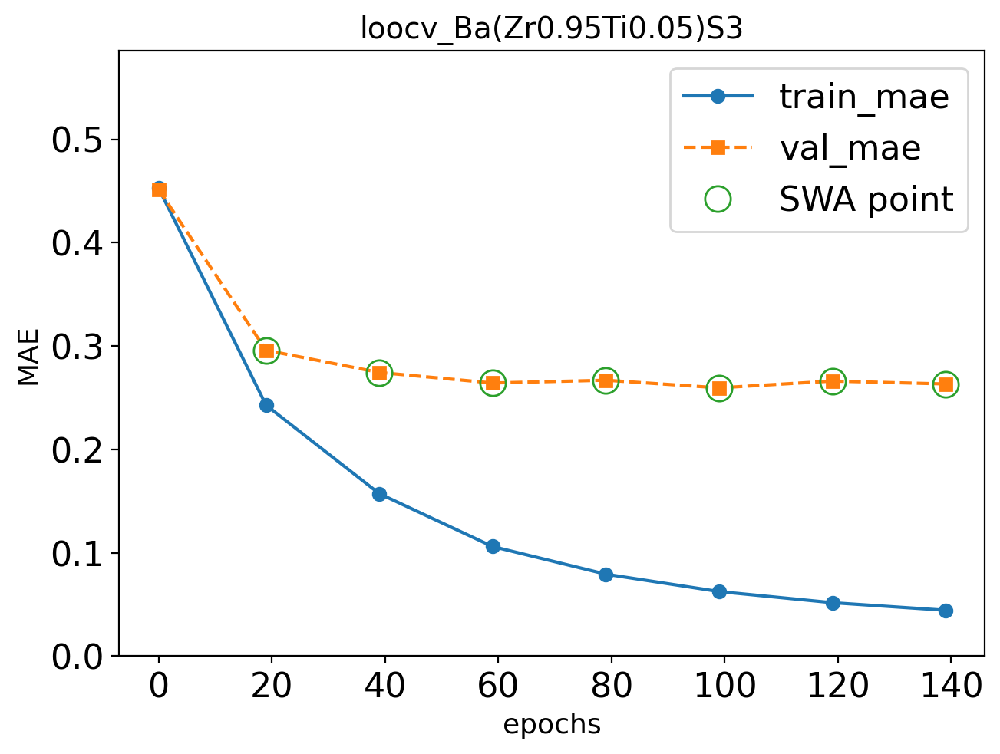

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_Ba(Zr0.95Ti0.05)S3) to models/trained_models/loocv_Ba(Zr0.95Ti0.05)S3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 590.66formulae/s]

loading data with up to 9 elements in the formula
  Actual: 1.63 eV  |  Predicted: 1.62 ± 0.09 eV  |  Residual: -0.01 eV

--- LOOCV fold 2/9: holding out Ba(Zr0.96Ti0.04)S3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 313583.73formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 212911.81formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.459 val mae: 0.46


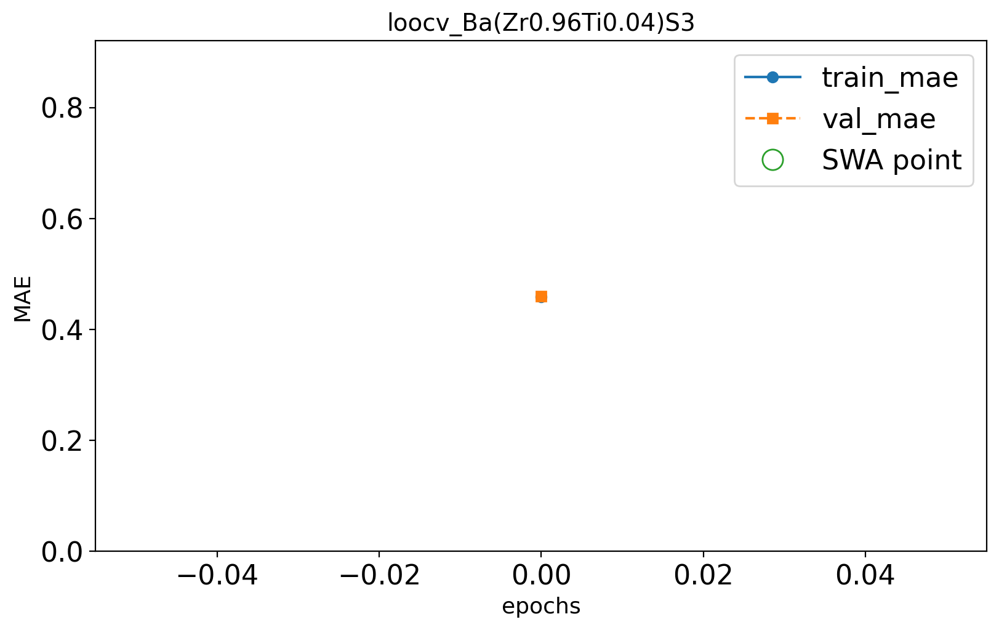

Epoch: 19/300 --- train mae: 0.248 val mae: 0.297


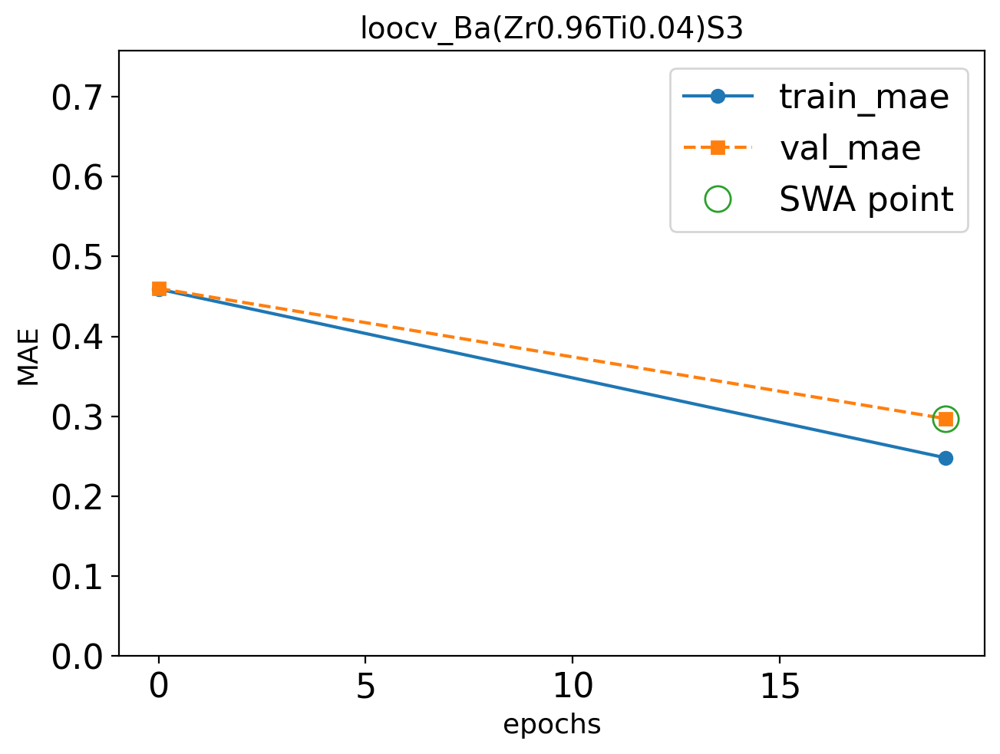

Epoch: 39/300 --- train mae: 0.164 val mae: 0.274


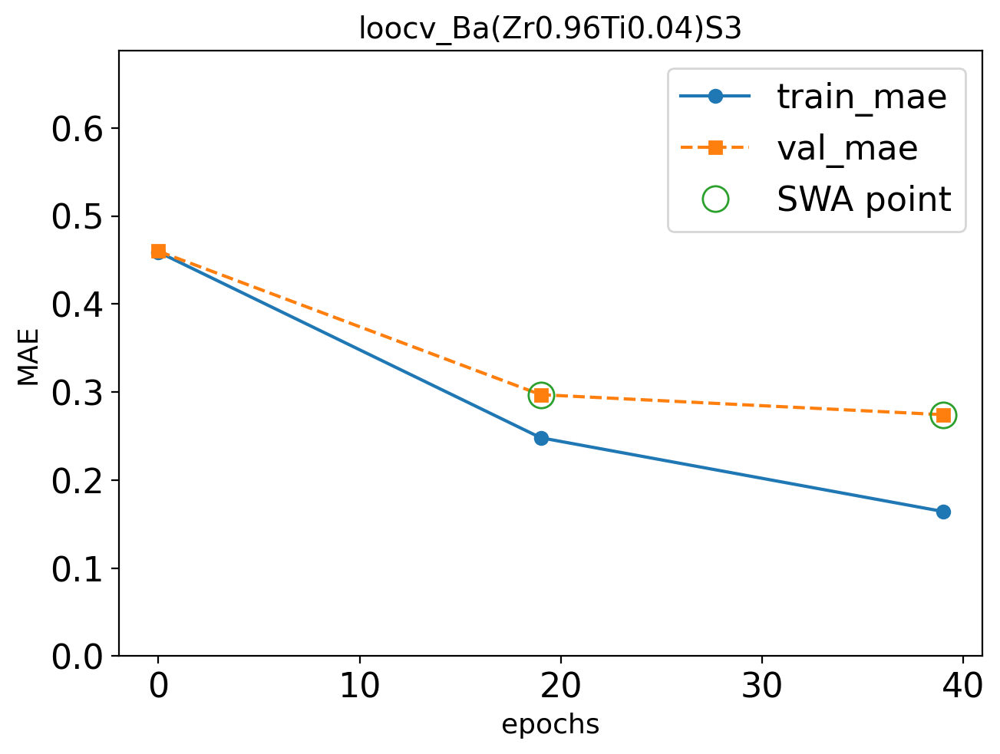

Epoch: 59/300 --- train mae: 0.113 val mae: 0.275


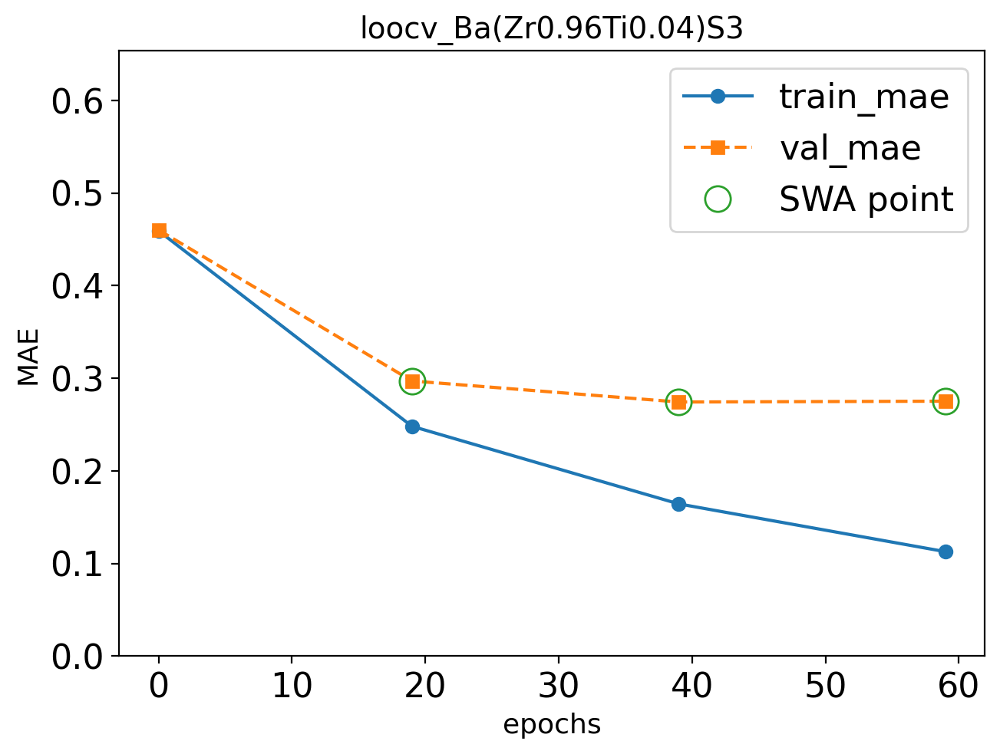

Epoch: 79/300 --- train mae: 0.0863 val mae: 0.268


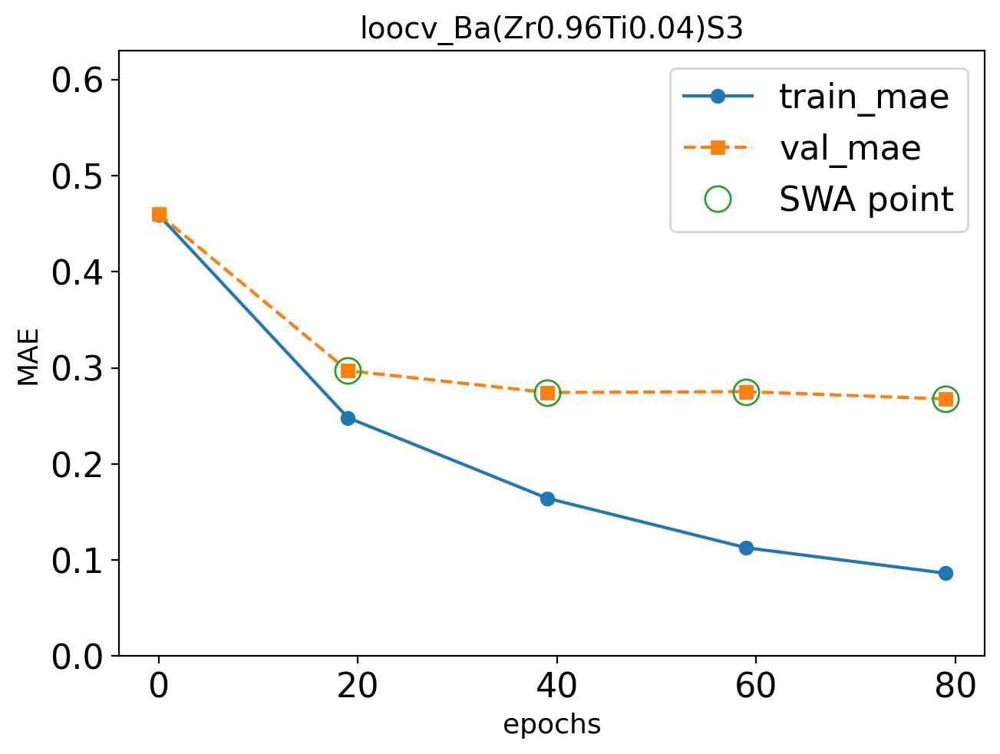

Epoch: 99/300 --- train mae: 0.0682 val mae: 0.26


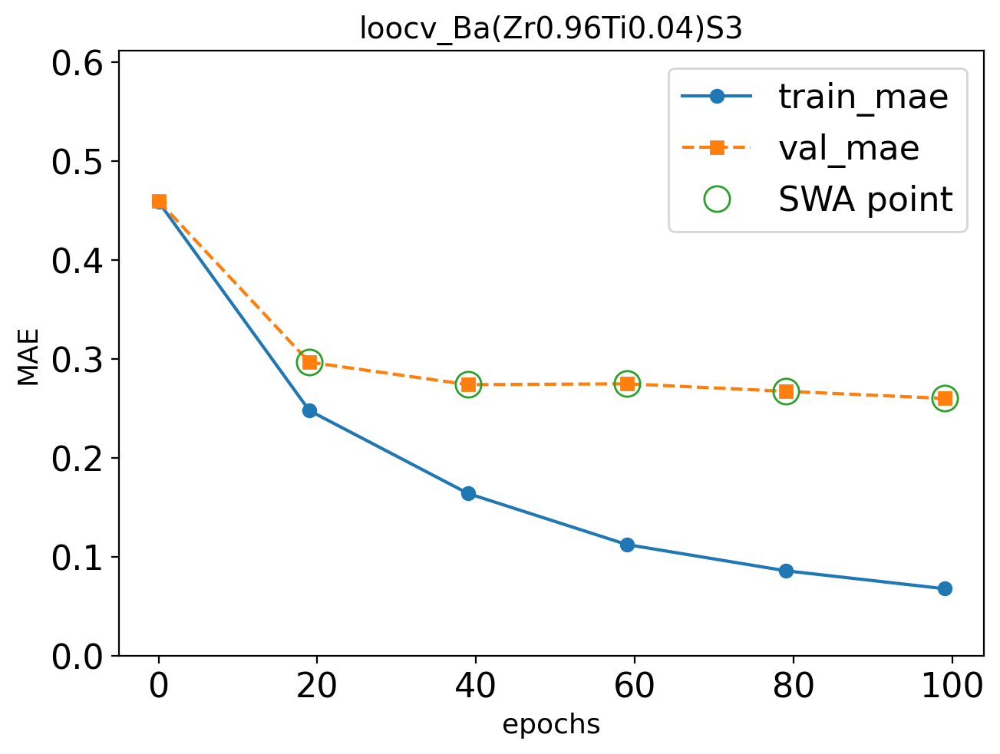

Epoch: 119/300 --- train mae: 0.0545 val mae: 0.255


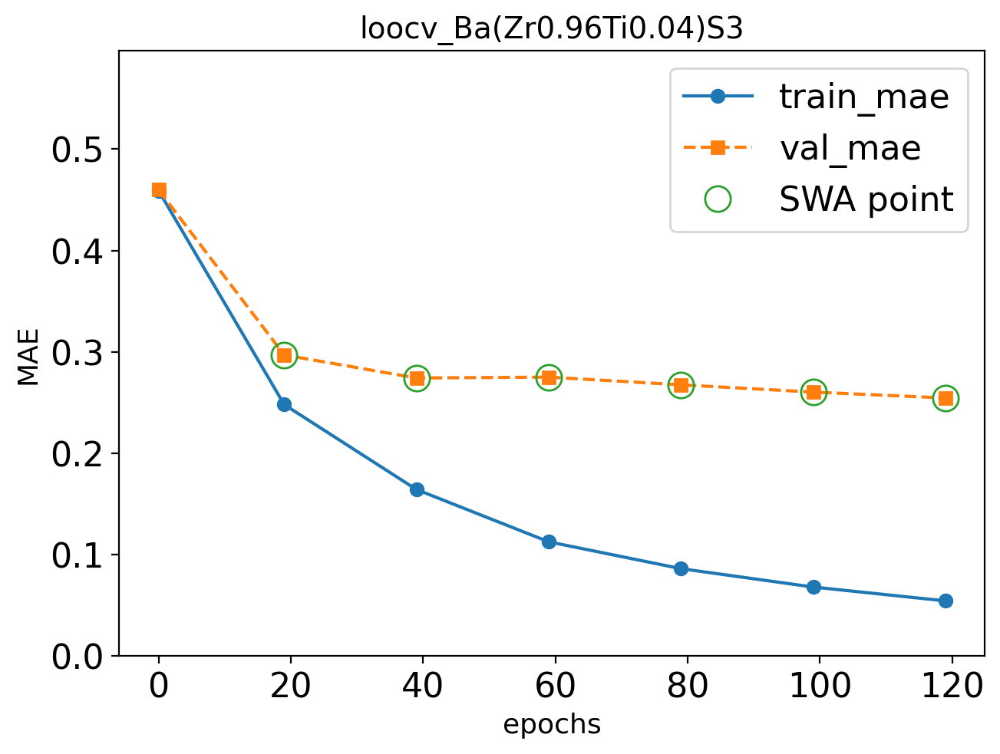

Epoch: 139/300 --- train mae: 0.0448 val mae: 0.257


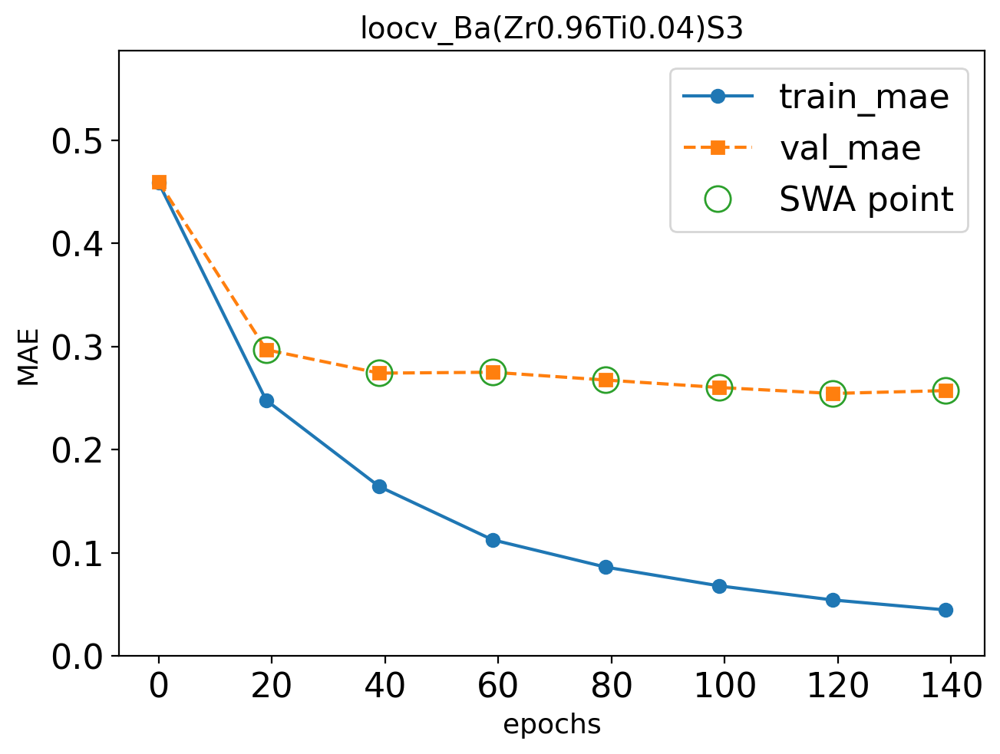

Epoch 159 failed to improve.
Discarded: 1/3 weight updates
Epoch: 159/300 --- train mae: 0.0392 val mae: 0.259


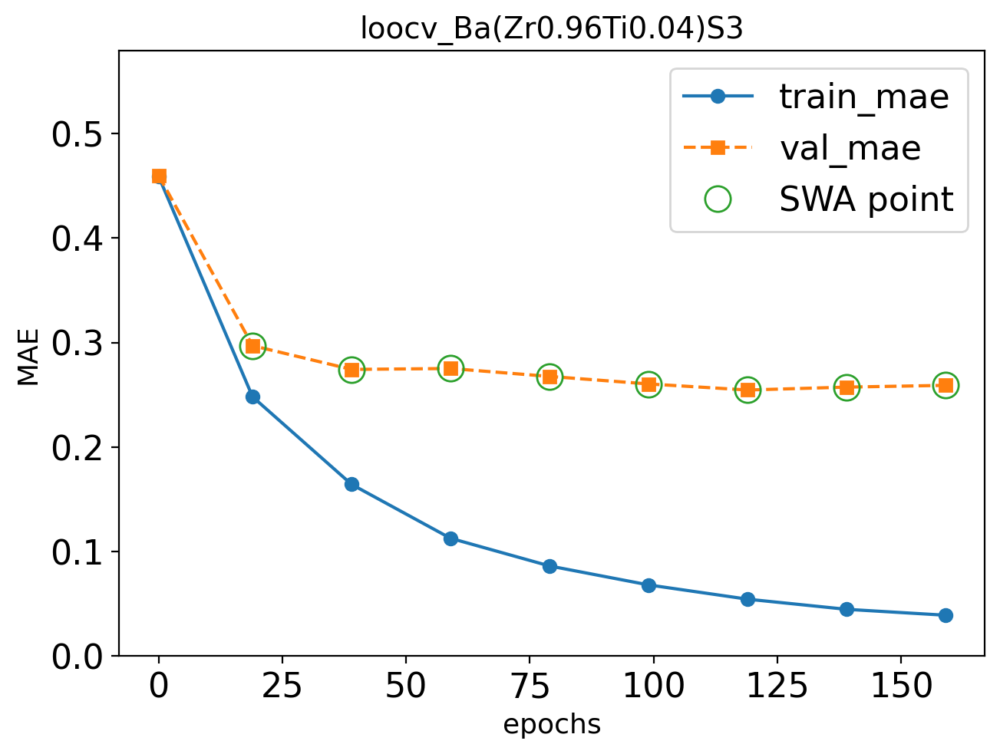

Epoch: 179/300 --- train mae: 0.0358 val mae: 0.251


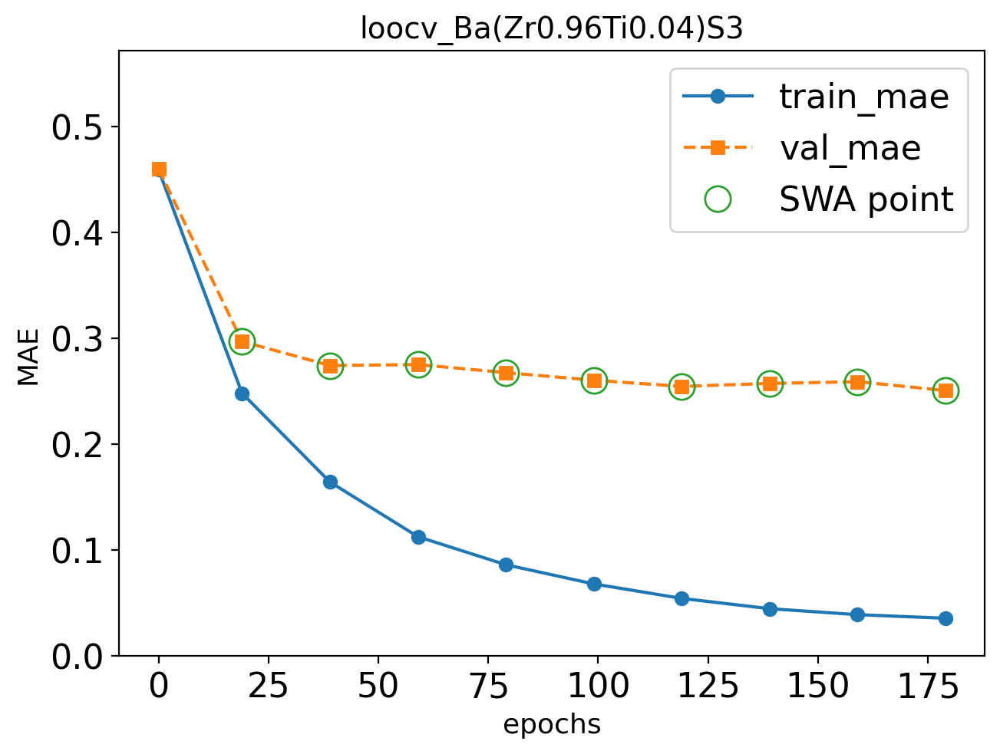

Epoch 199 failed to improve.
Discarded: 2/3 weight updates
Epoch: 199/300 --- train mae: 0.0329 val mae: 0.255


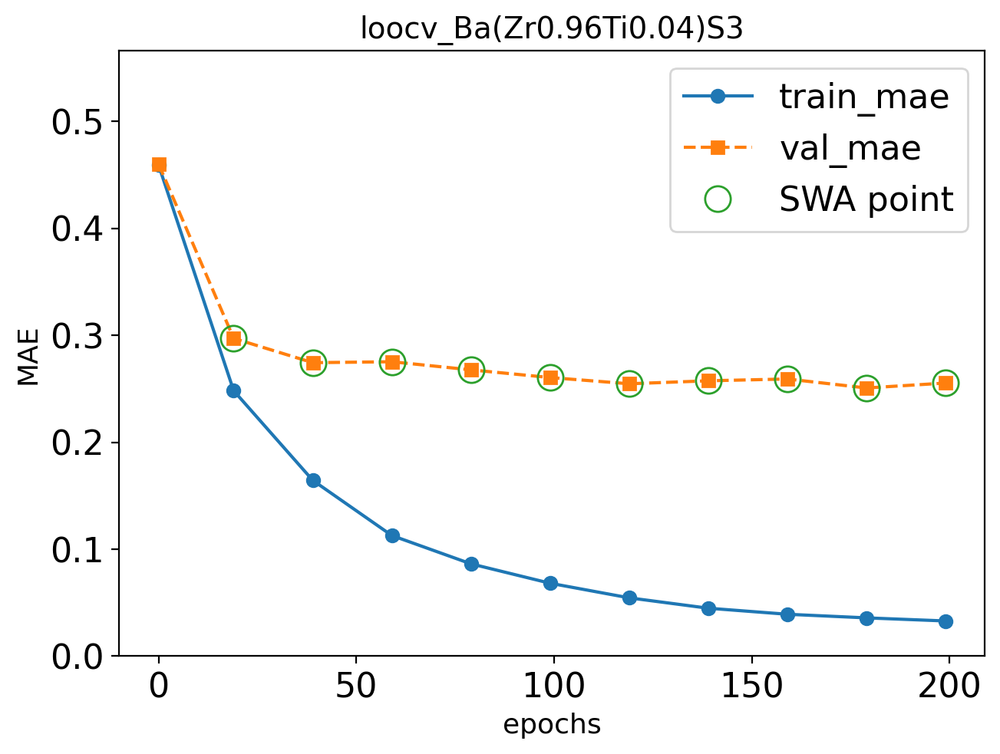

Epoch 219 failed to improve.
Discarded: 3/3 weight updates
Epoch: 219/300 --- train mae: 0.0309 val mae: 0.259


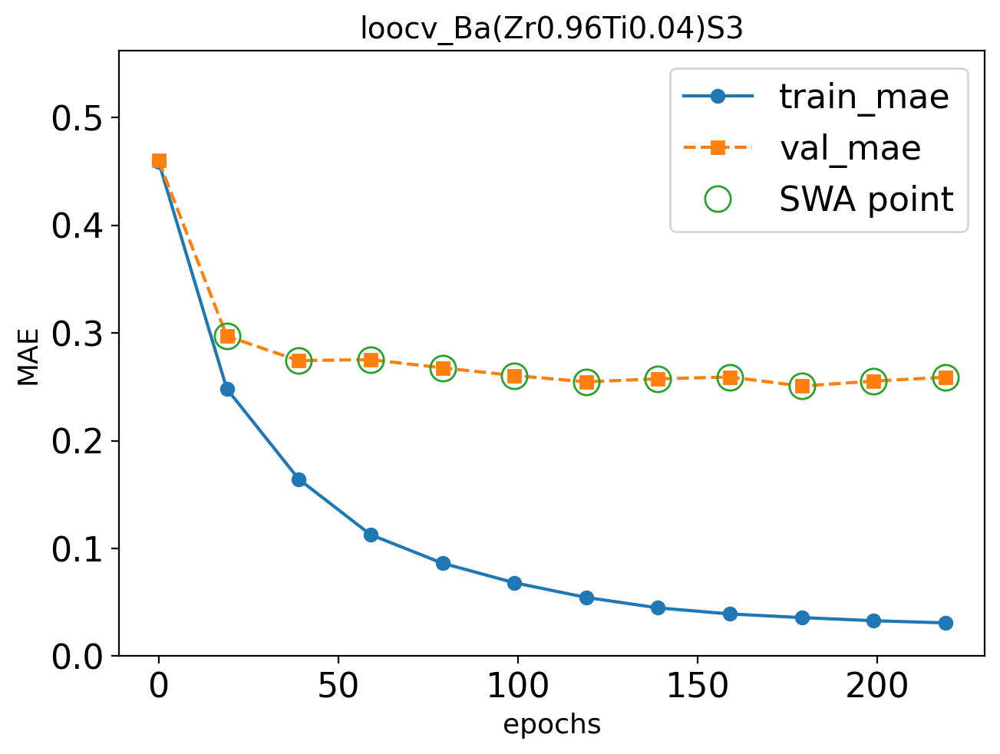

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_Ba(Zr0.96Ti0.04)S3) to models/trained_models/loocv_Ba(Zr0.96Ti0.04)S3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13315.25formulae/s]

loading data with up to 9 elements in the formula
  Actual: 1.51 eV  |  Predicted: 1.60 ± 0.06 eV  |  Residual: +0.09 eV

--- LOOCV fold 3/9: holding out BaHfS3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 312946.58formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 305606.65formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.463 val mae: 0.465


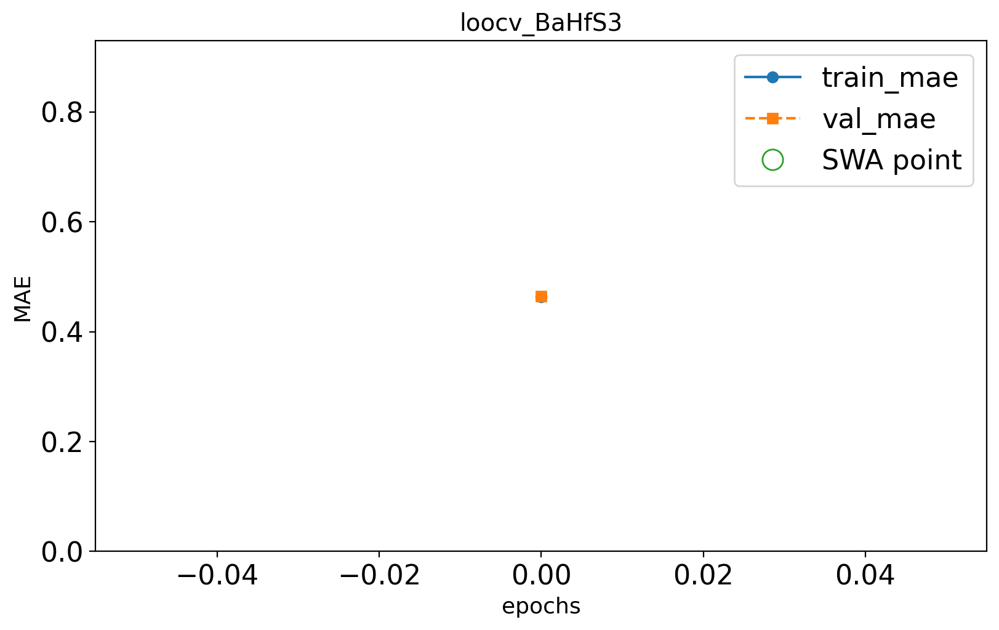

Epoch: 19/300 --- train mae: 0.242 val mae: 0.289


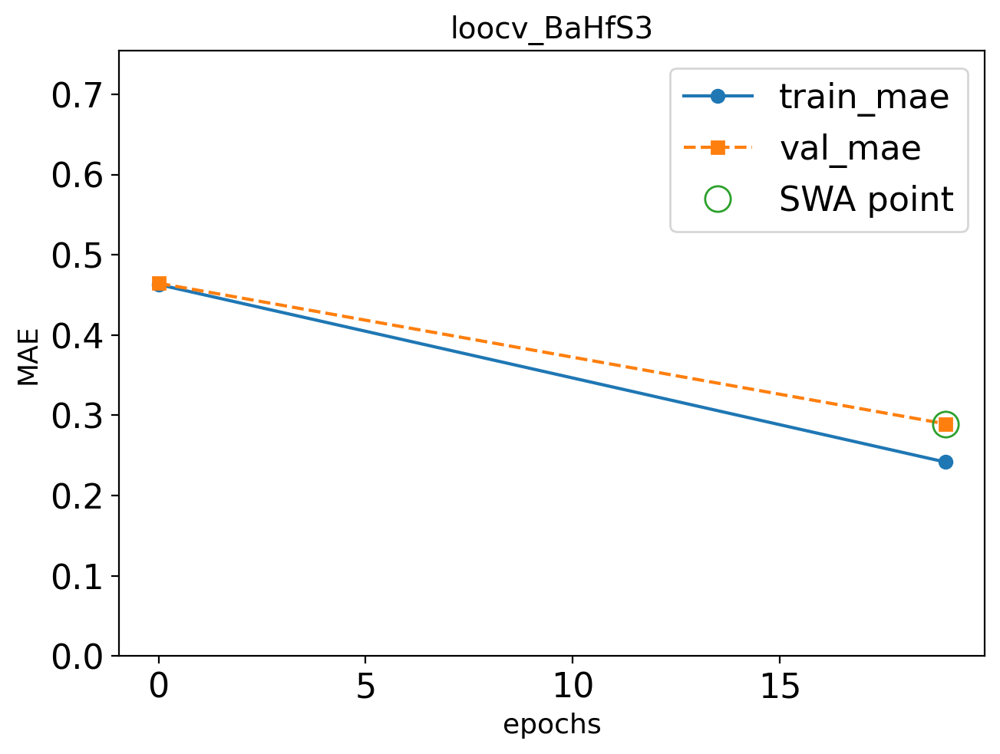

Epoch: 39/300 --- train mae: 0.154 val mae: 0.276


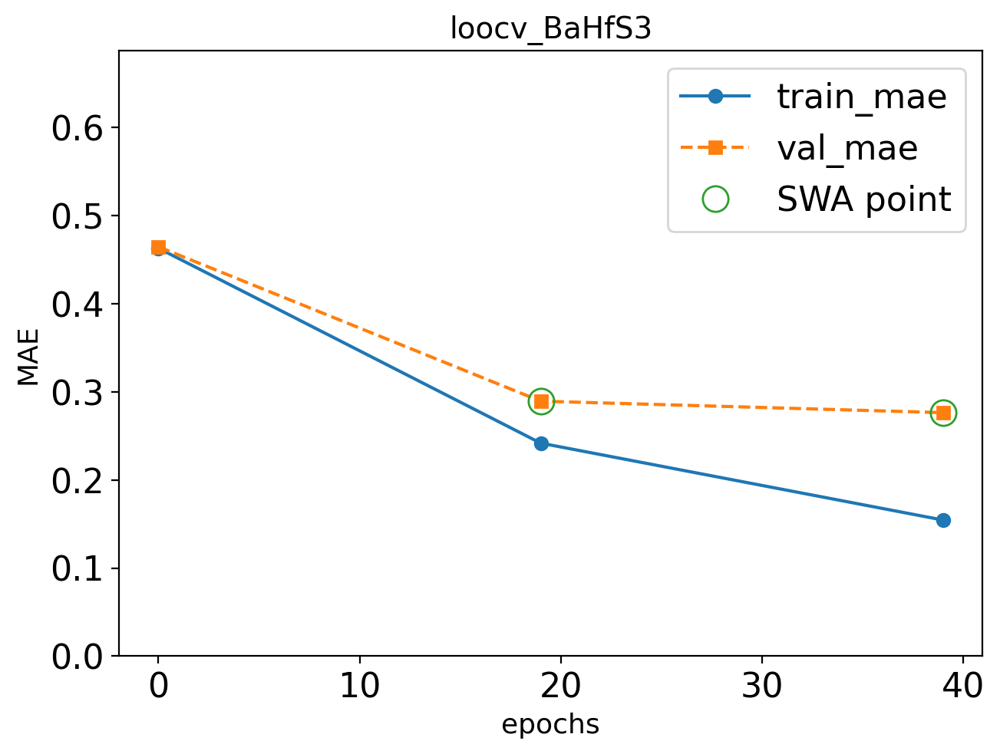

Epoch: 59/300 --- train mae: 0.108 val mae: 0.275


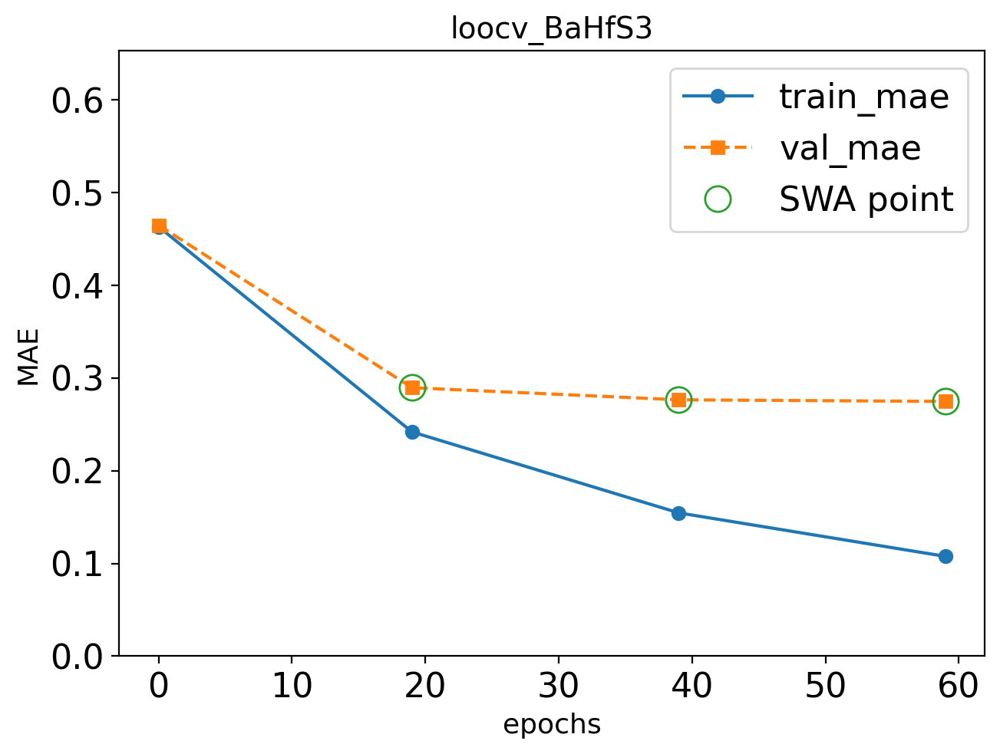

Epoch: 79/300 --- train mae: 0.0783 val mae: 0.273


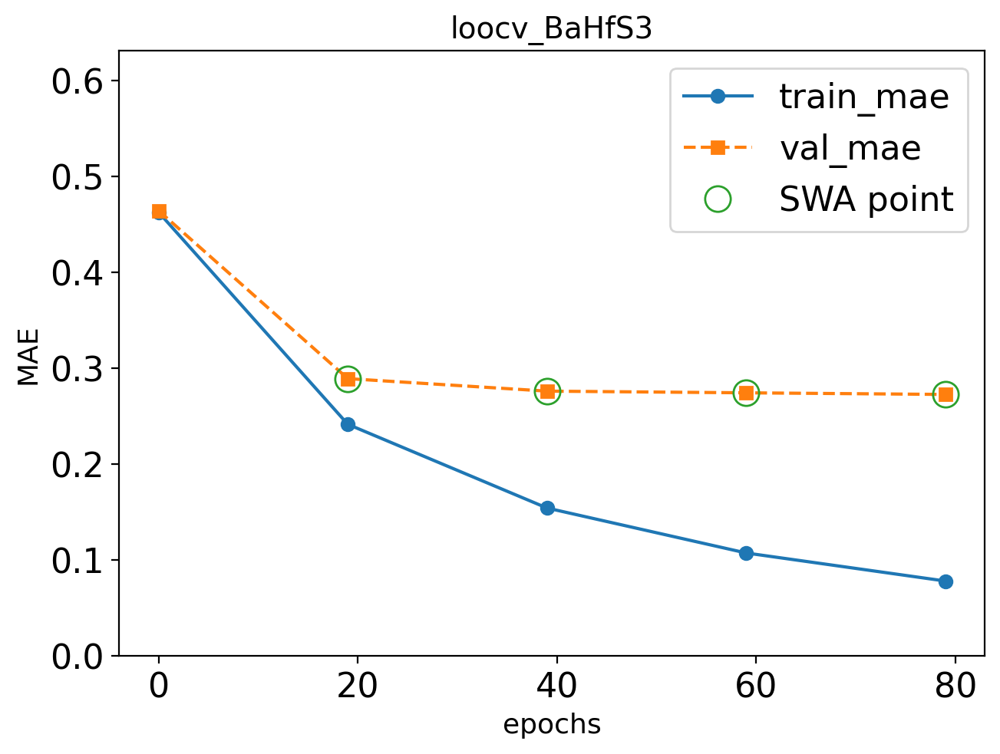

Epoch: 99/300 --- train mae: 0.0596 val mae: 0.268


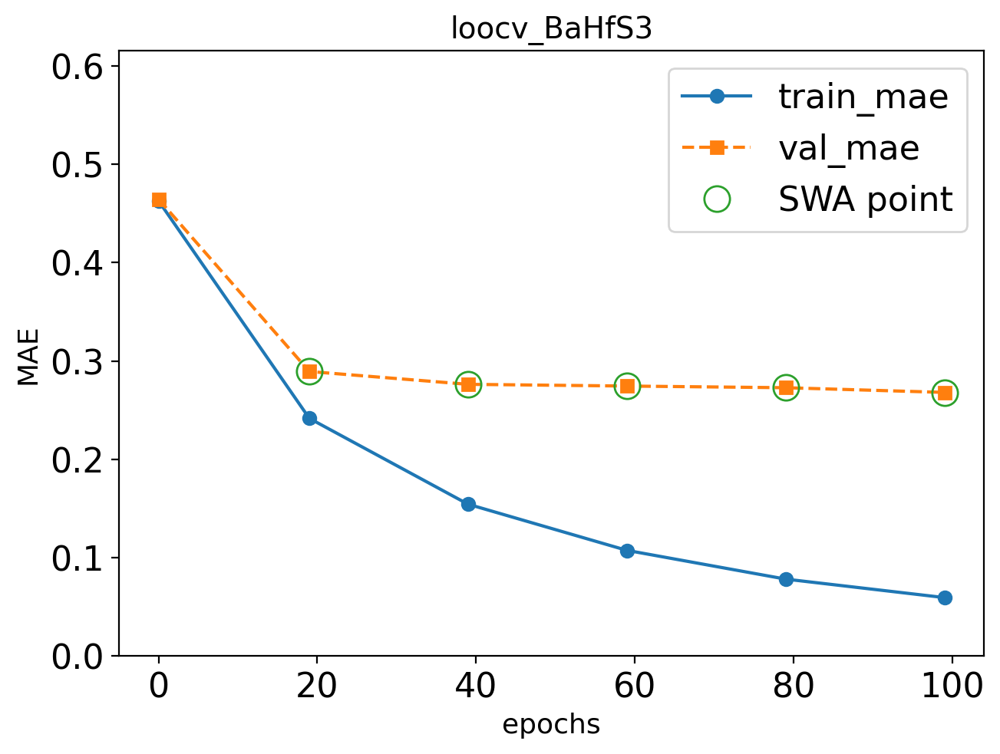

Epoch: 119/300 --- train mae: 0.05 val mae: 0.265


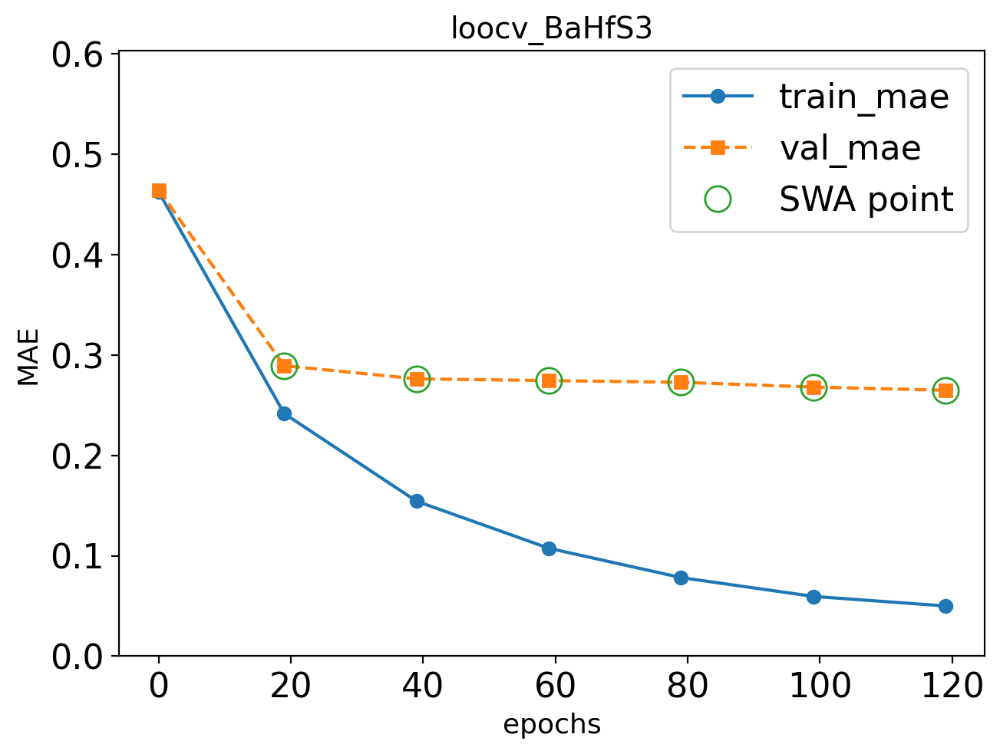

Epoch: 139/300 --- train mae: 0.043 val mae: 0.266


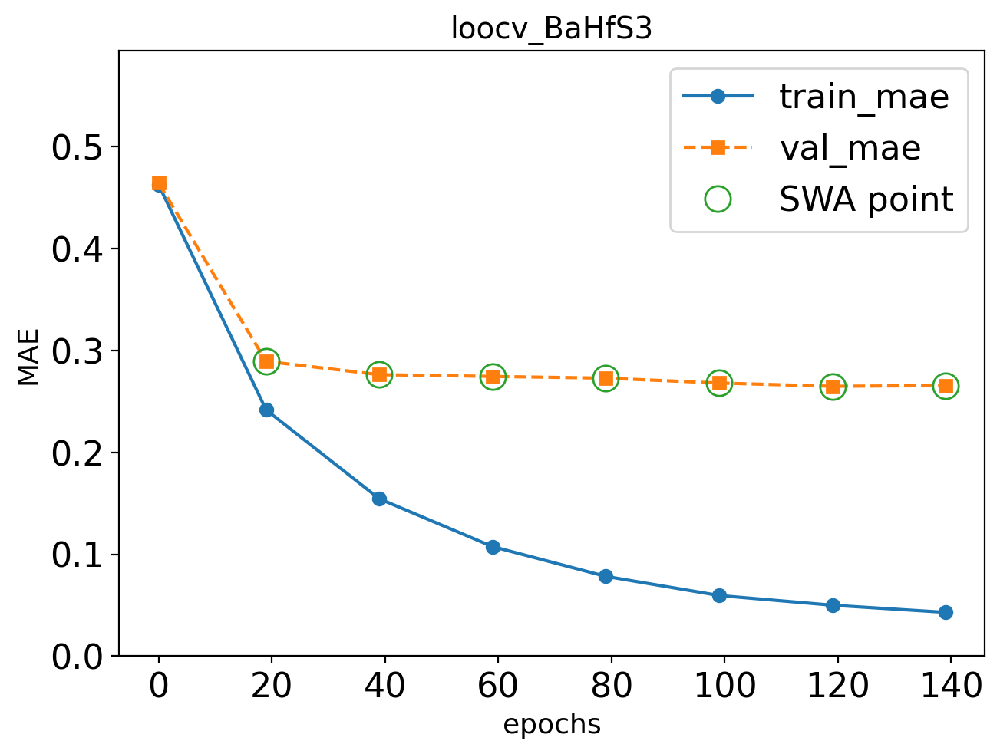

Epoch: 159/300 --- train mae: 0.0382 val mae: 0.265


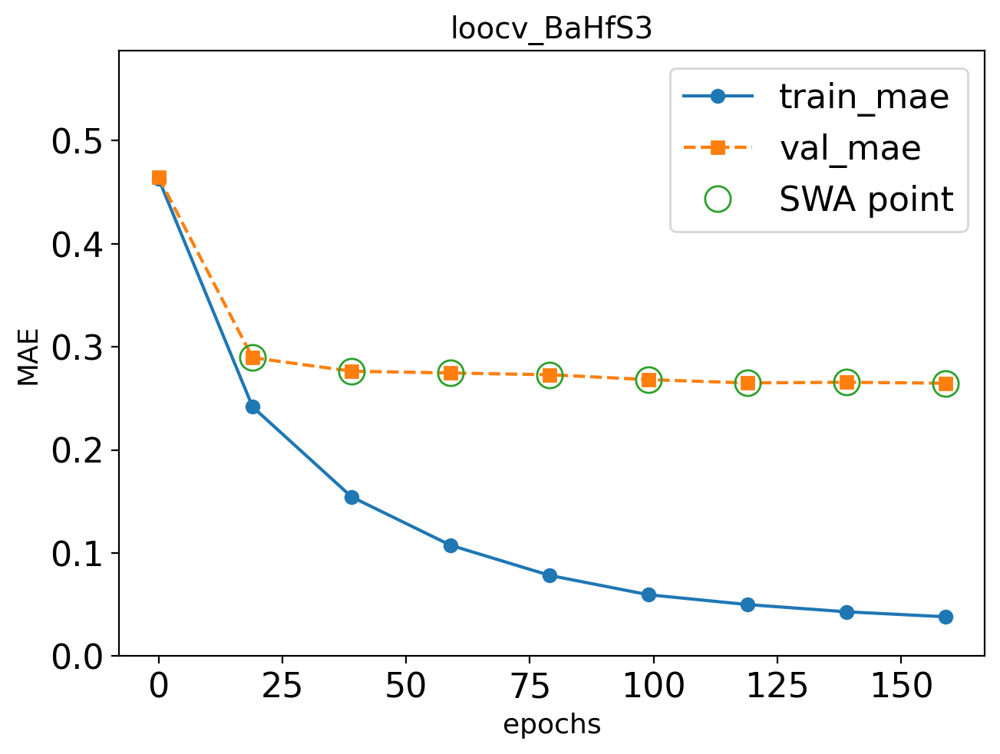

Epoch 179 failed to improve.
Discarded: 1/3 weight updates
Epoch: 179/300 --- train mae: 0.0332 val mae: 0.269


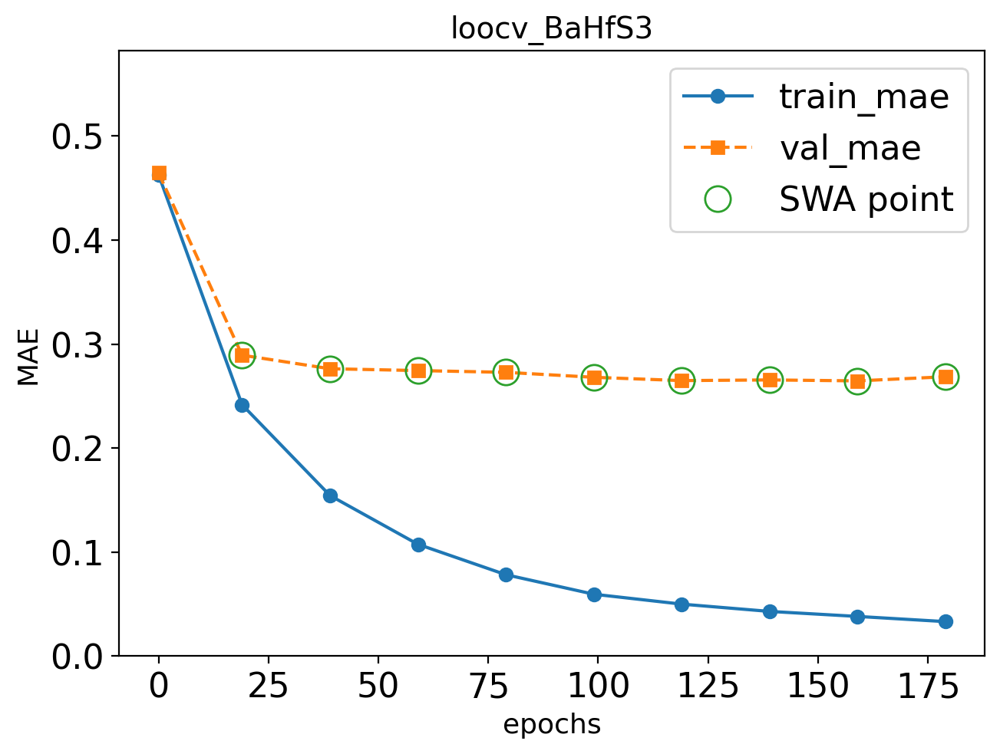

Epoch 199 failed to improve.
Discarded: 2/3 weight updates
Epoch: 199/300 --- train mae: 0.031 val mae: 0.273


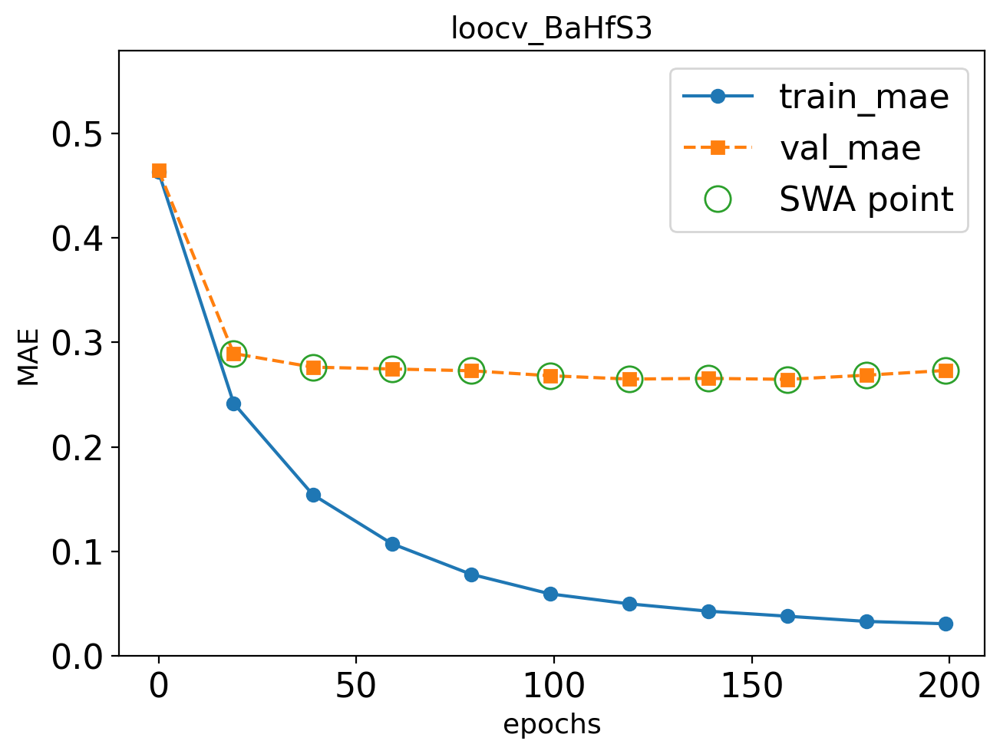

Epoch 219 failed to improve.
Discarded: 3/3 weight updates
Epoch: 219/300 --- train mae: 0.0291 val mae: 0.271


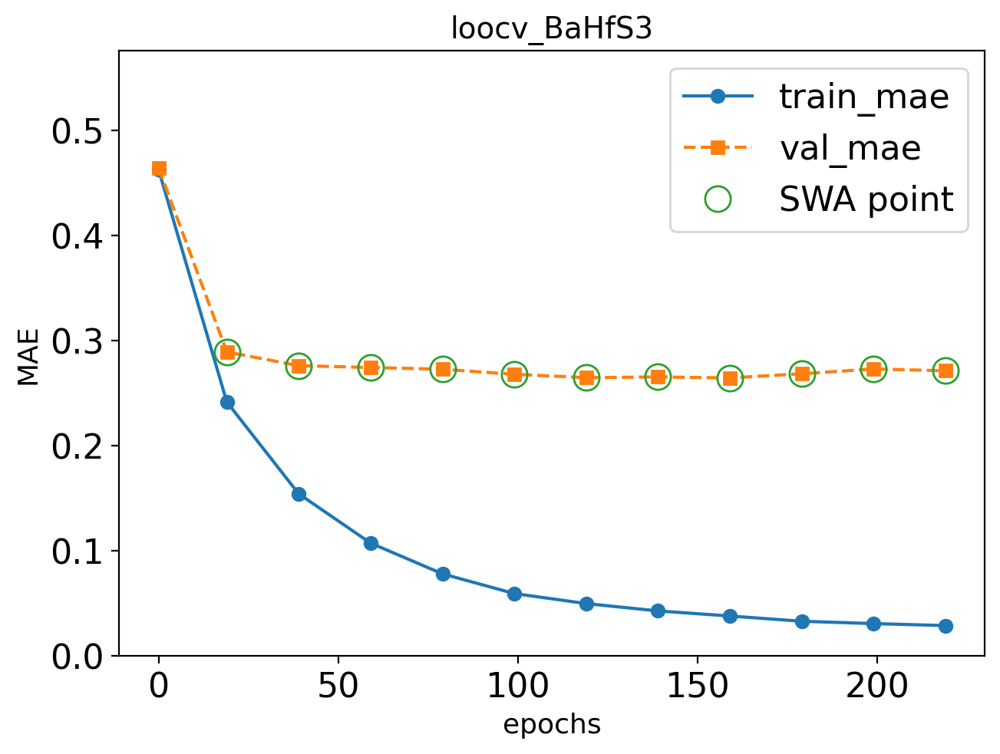

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_BaHfS3) to models/trained_models/loocv_BaHfS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 174.98formulae/s]


loading data with up to 9 elements in the formula
  Actual: 2.12 eV  |  Predicted: 1.65 ± 0.06 eV  |  Residual: -0.46 eV

--- LOOCV fold 4/9: holding out BaZr(S0.6Se0.4)3 ---

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 308683.24formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 297079.48formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.461 val mae: 0.463


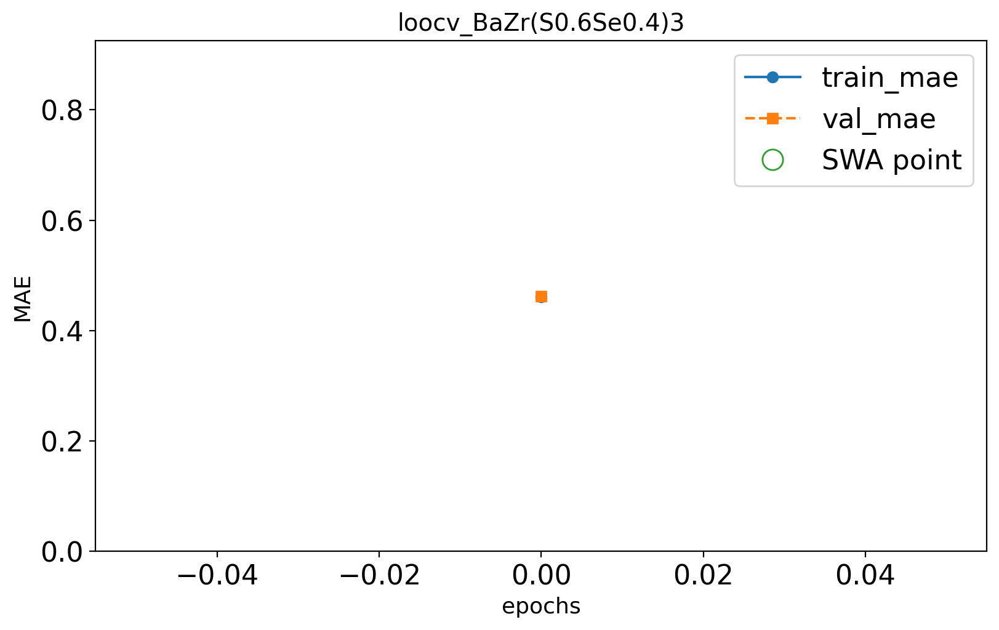

Epoch: 19/300 --- train mae: 0.243 val mae: 0.288


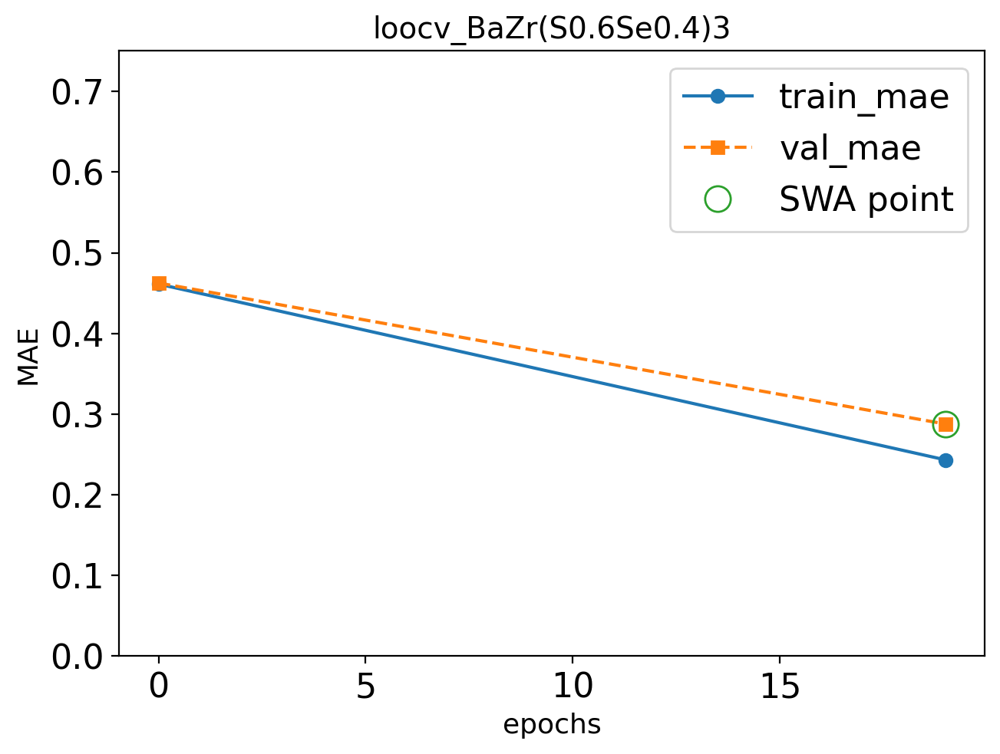

Epoch: 39/300 --- train mae: 0.161 val mae: 0.272


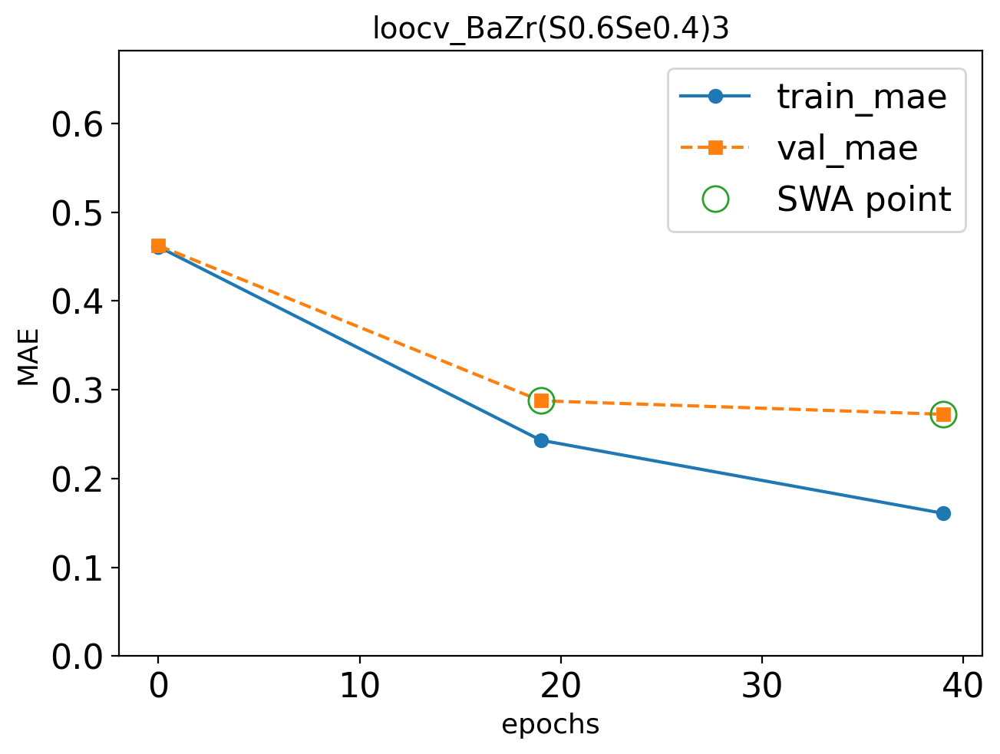

Epoch 59 failed to improve.
Discarded: 1/3 weight updates
Epoch: 59/300 --- train mae: 0.108 val mae: 0.277


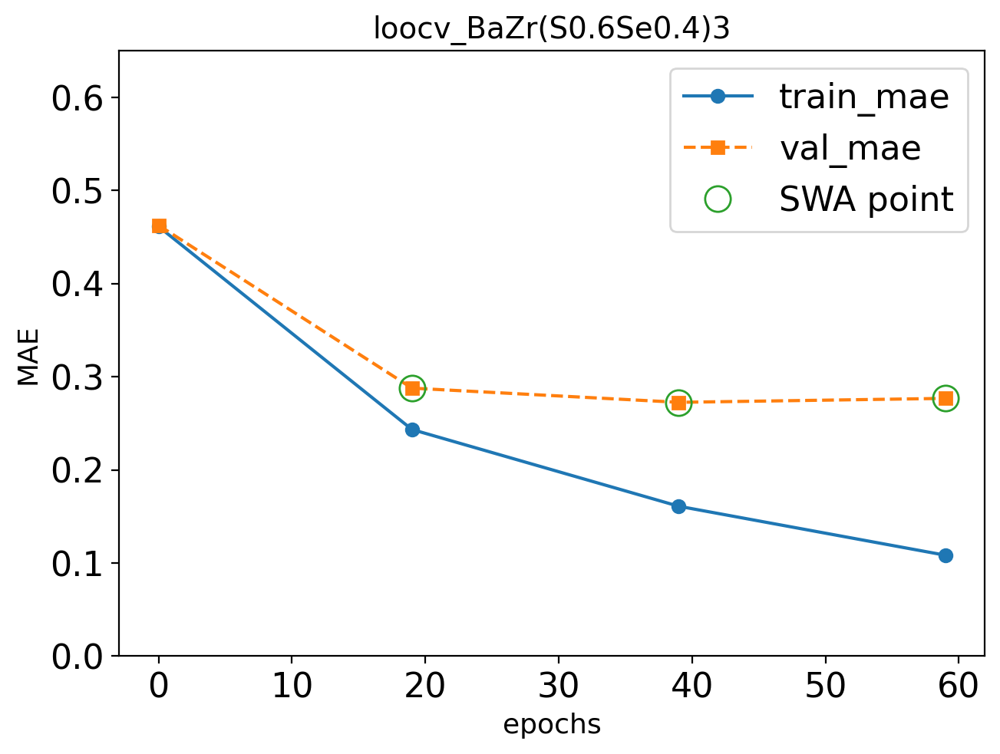

Epoch: 79/300 --- train mae: 0.0816 val mae: 0.273


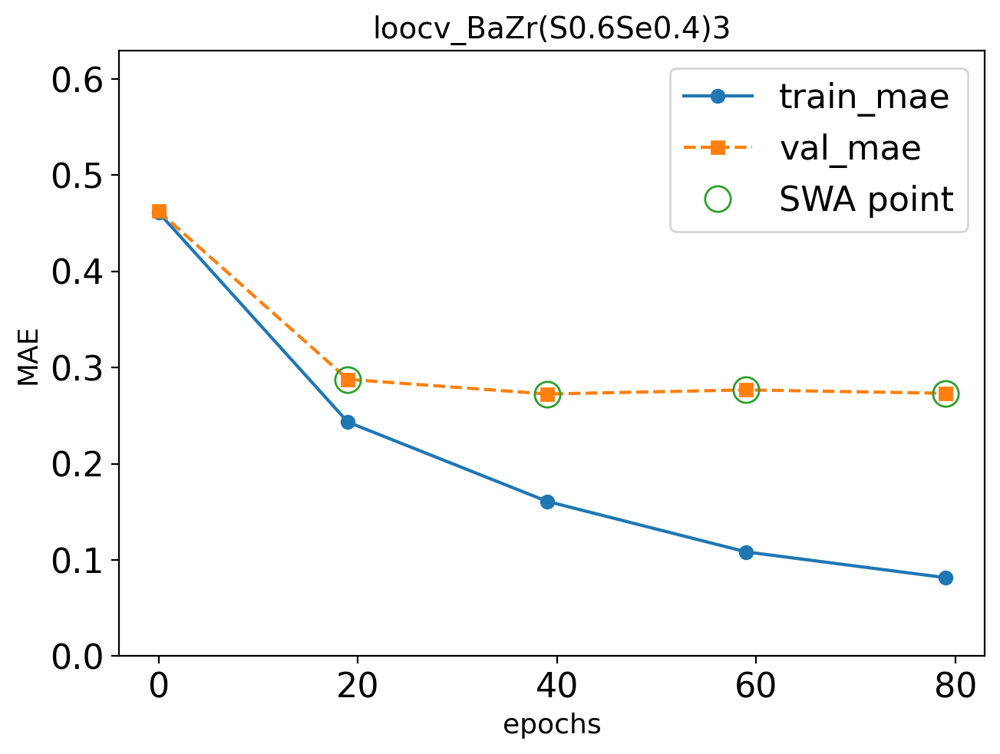

Epoch 99 failed to improve.
Discarded: 2/3 weight updates
Epoch: 99/300 --- train mae: 0.0619 val mae: 0.276


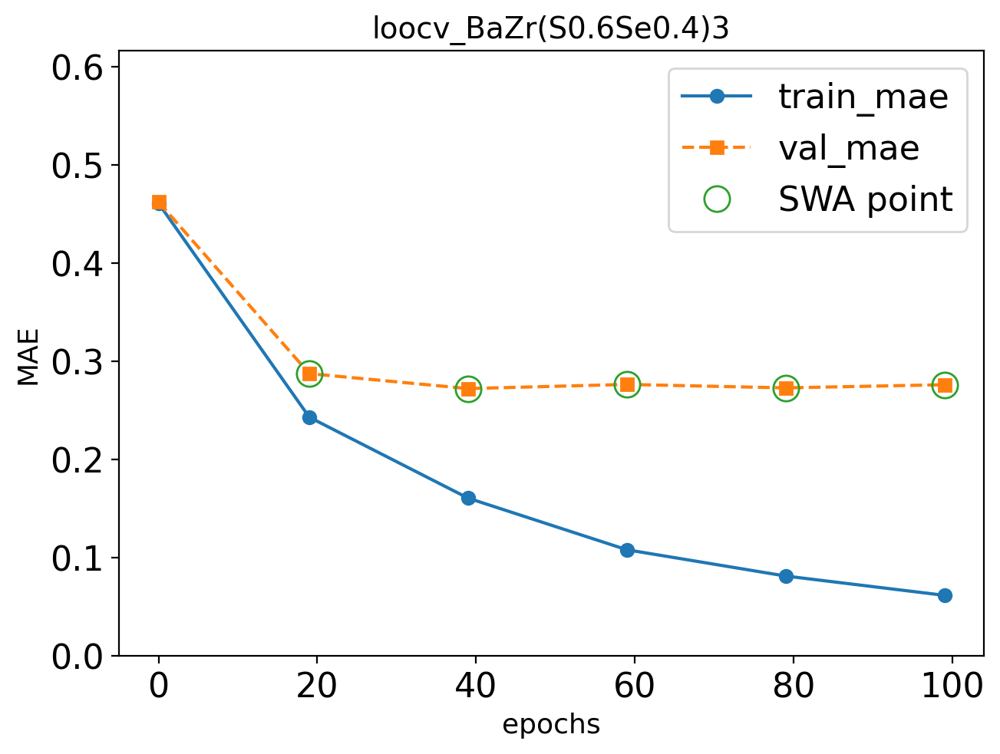

Epoch 119 failed to improve.
Discarded: 3/3 weight updates
Epoch: 119/300 --- train mae: 0.051 val mae: 0.284


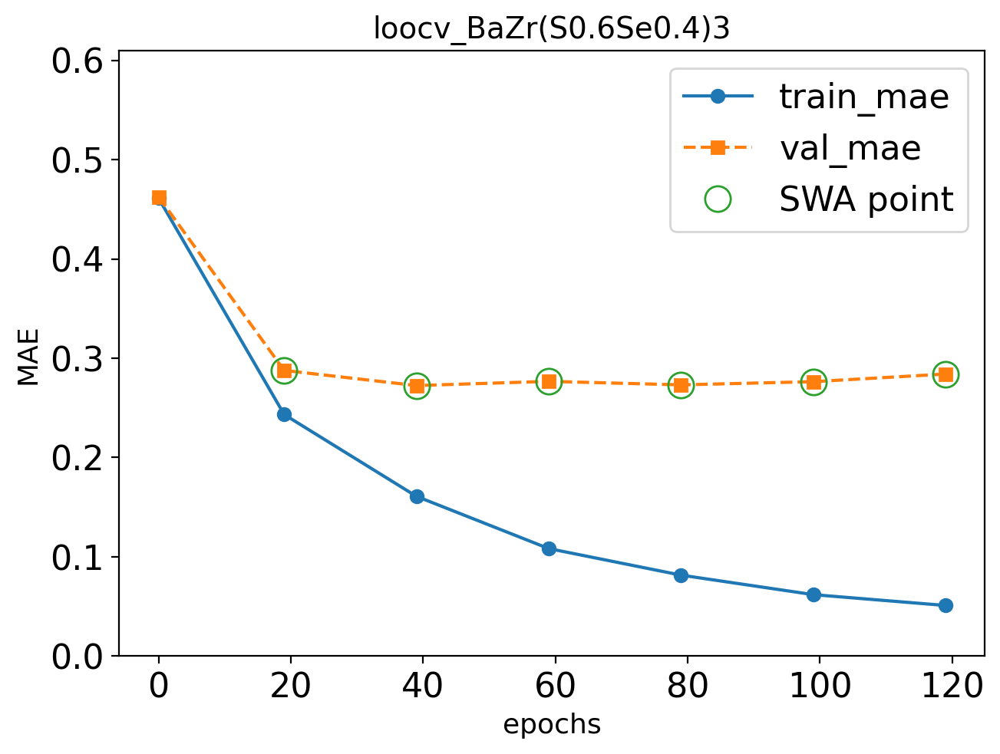

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_BaZr(S0.6Se0.4)3) to models/trained_models/loocv_BaZr(S0.6Se0.4)3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 203.33formulae/s]

loading data with up to 9 elements in the formula


  Actual: 1.76 eV  |  Predicted: 1.73 ± 0.17 eV  |  Residual: -0.03 eV

--- LOOCV fold 5/9: holding out BaZrS3 ---

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 312432.30formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 318921.73formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.452 val mae: 0.451


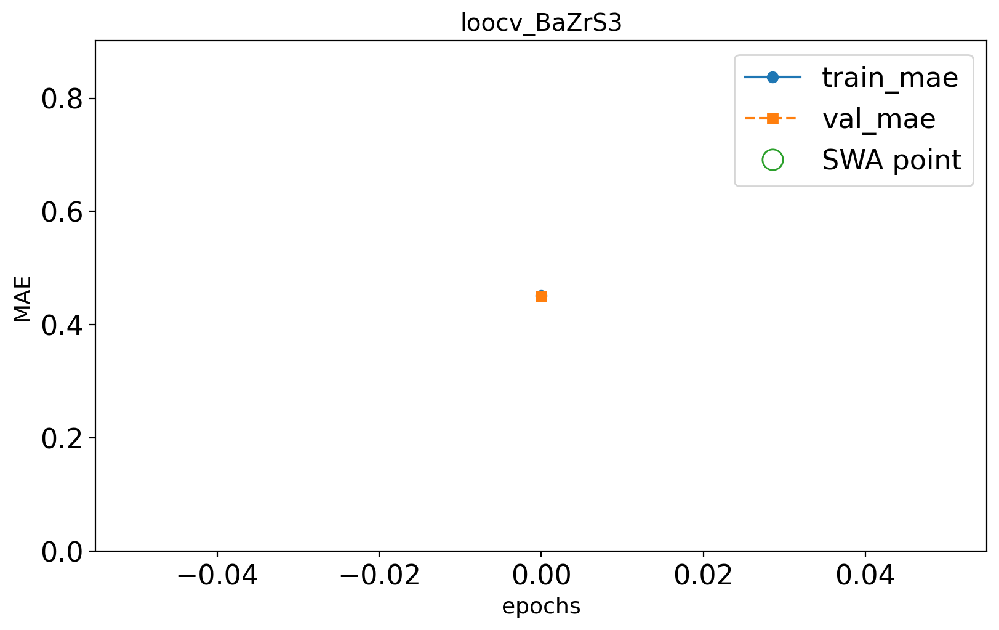

Epoch: 19/300 --- train mae: 0.253 val mae: 0.298


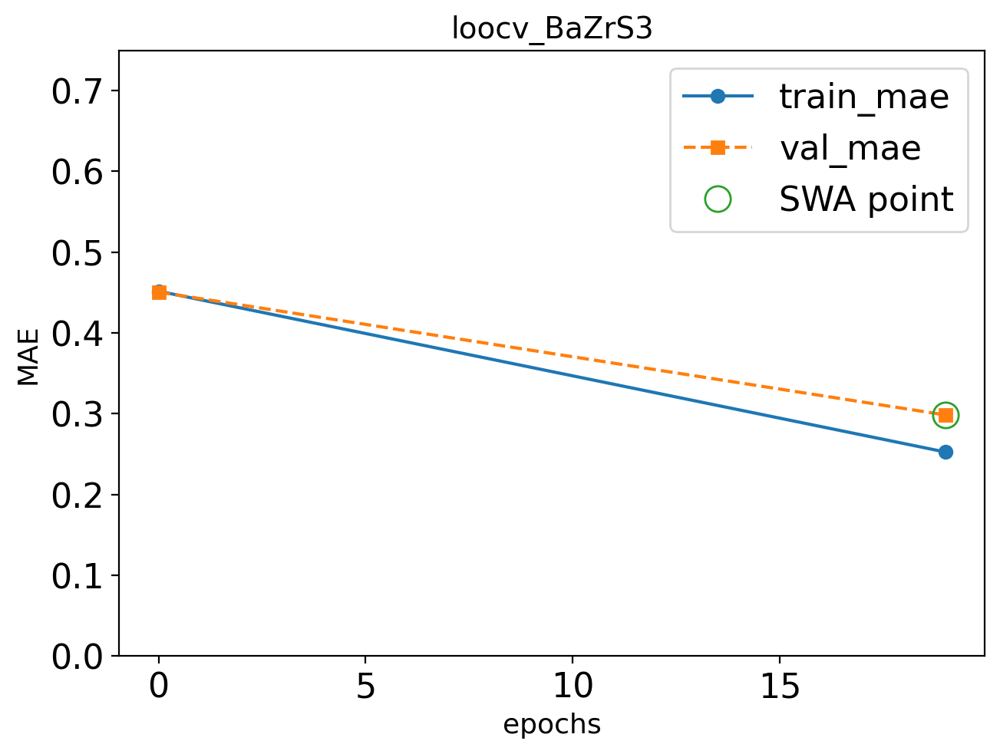

Epoch: 39/300 --- train mae: 0.168 val mae: 0.278


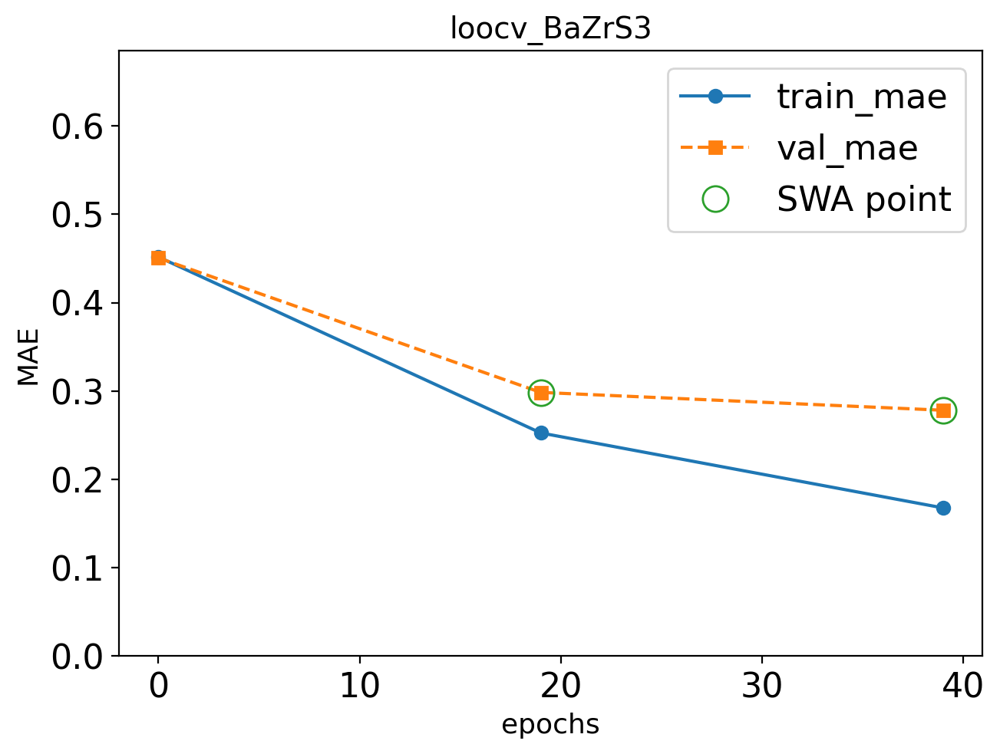

Epoch: 59/300 --- train mae: 0.114 val mae: 0.278


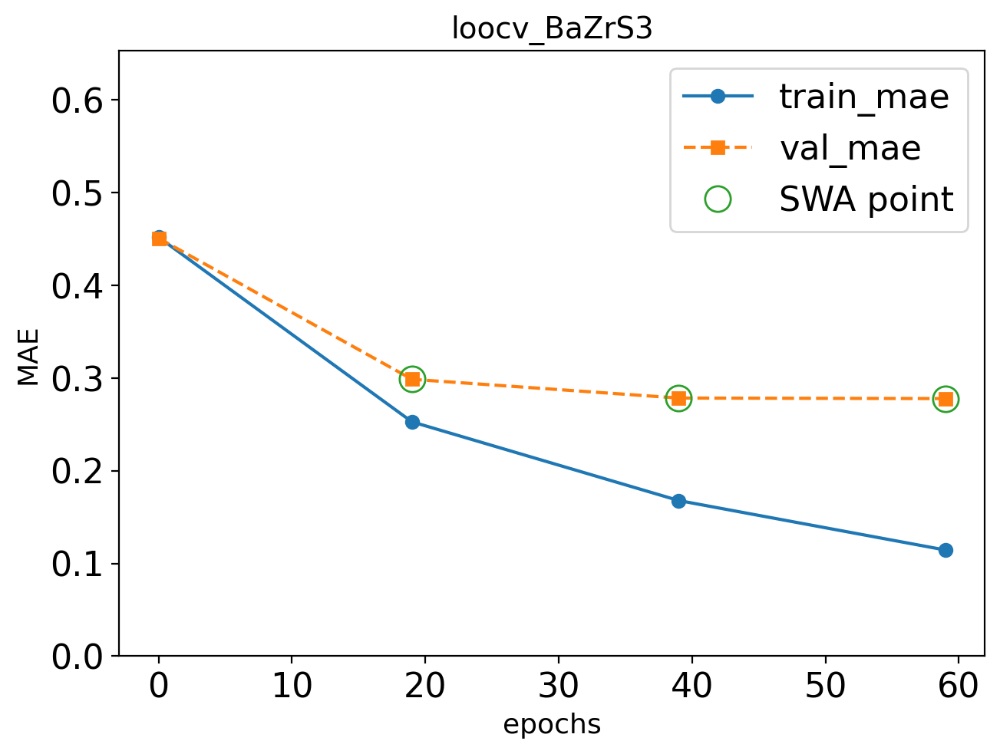

Epoch: 79/300 --- train mae: 0.084 val mae: 0.276


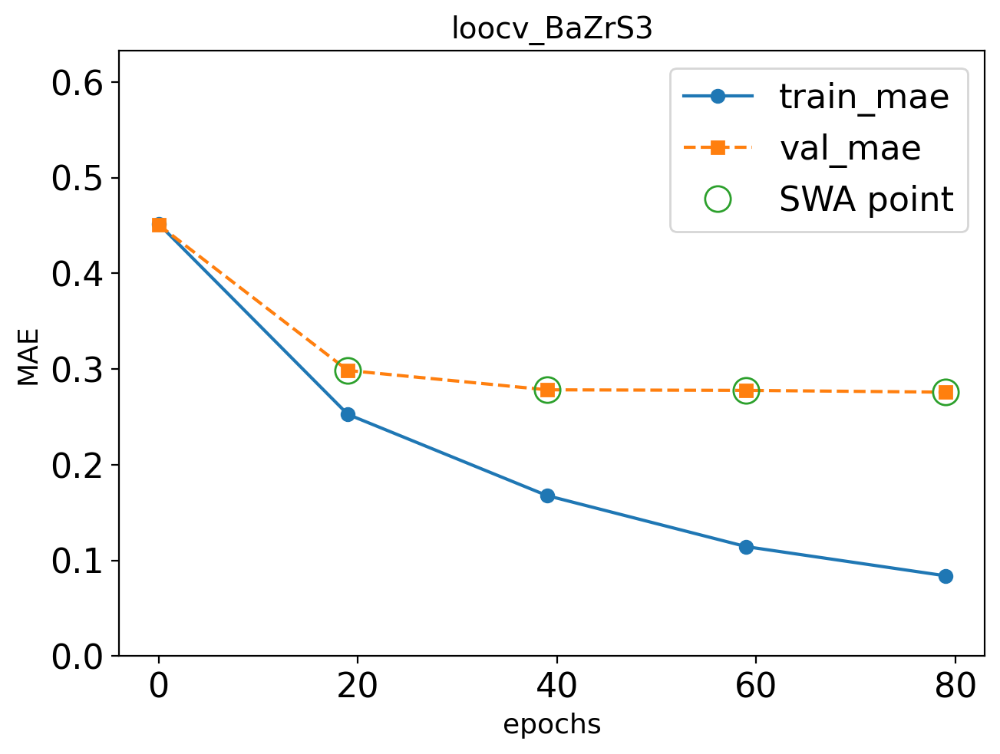

Epoch: 99/300 --- train mae: 0.066 val mae: 0.271


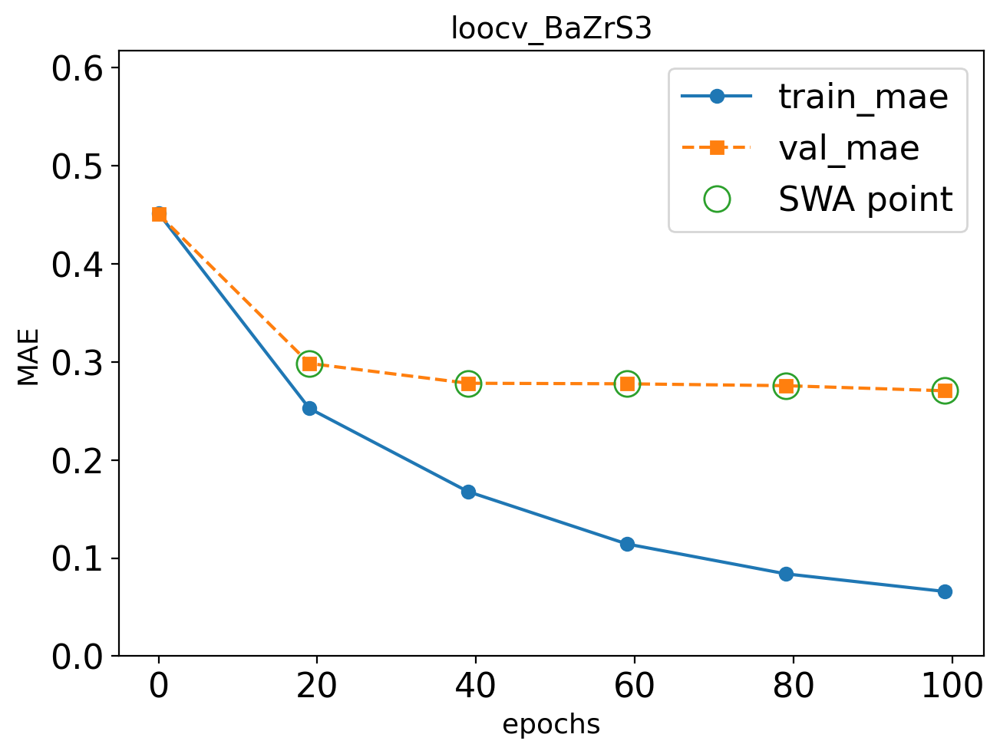

Epoch: 119/300 --- train mae: 0.0546 val mae: 0.271


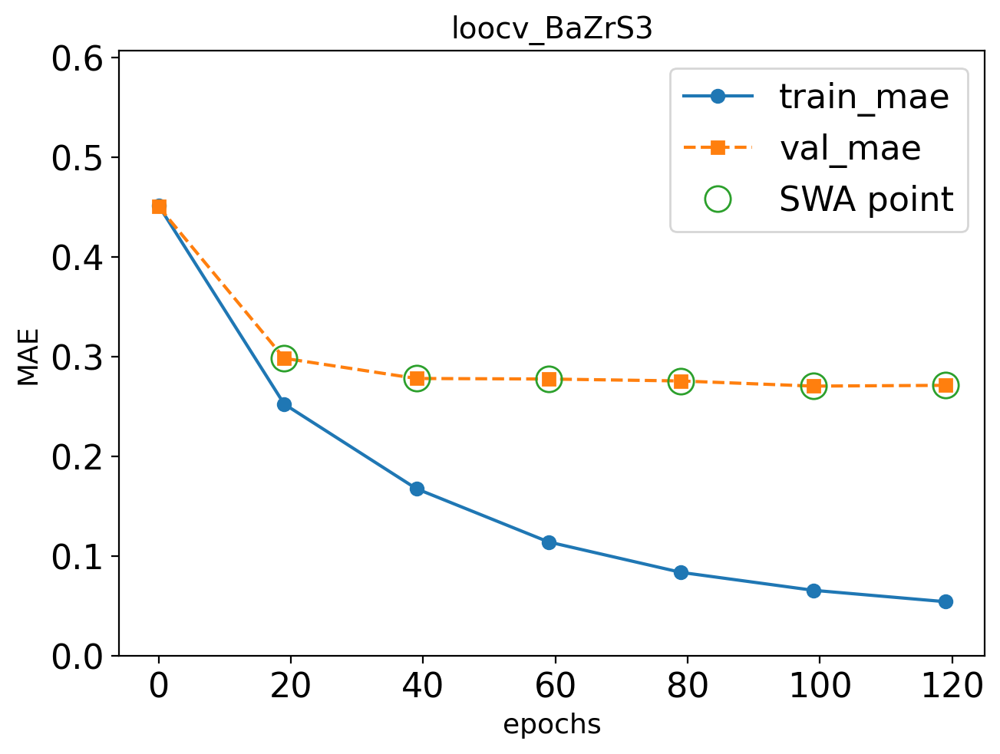

Epoch: 139/300 --- train mae: 0.0481 val mae: 0.264


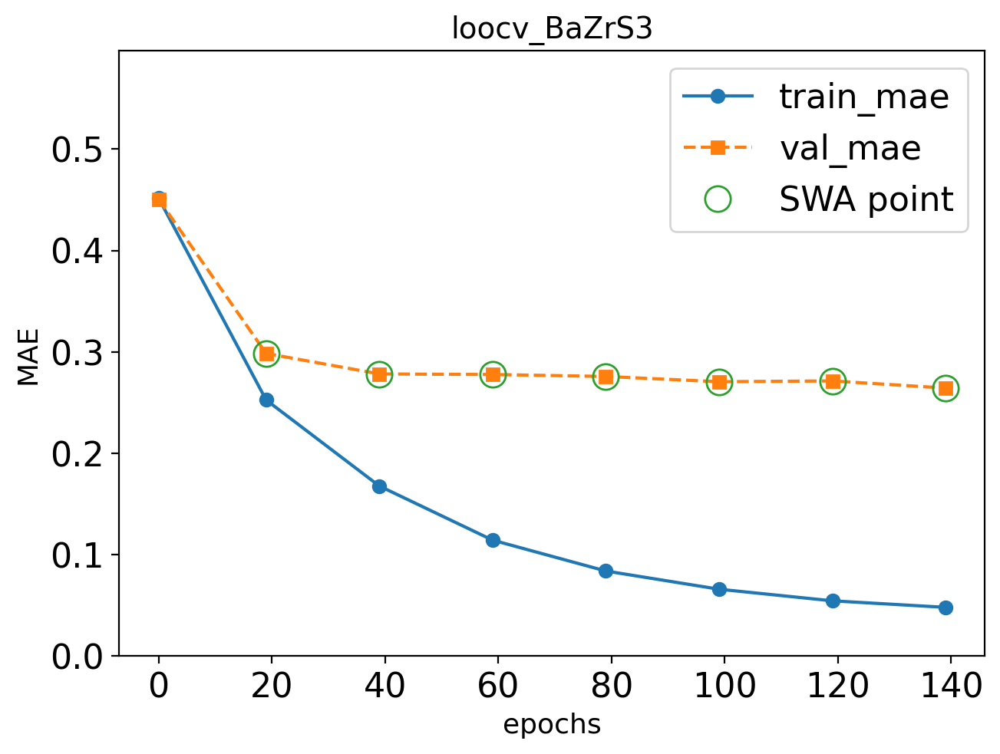

Epoch: 159/300 --- train mae: 0.0415 val mae: 0.266


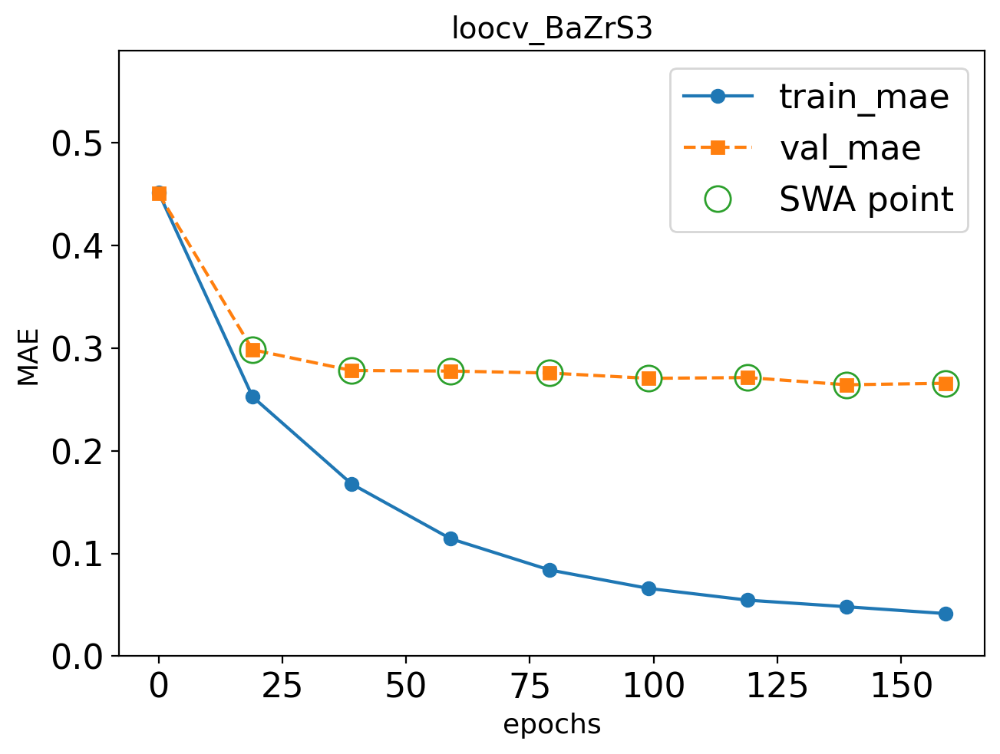

Epoch 179 failed to improve.
Discarded: 1/3 weight updates
Epoch: 179/300 --- train mae: 0.0365 val mae: 0.267


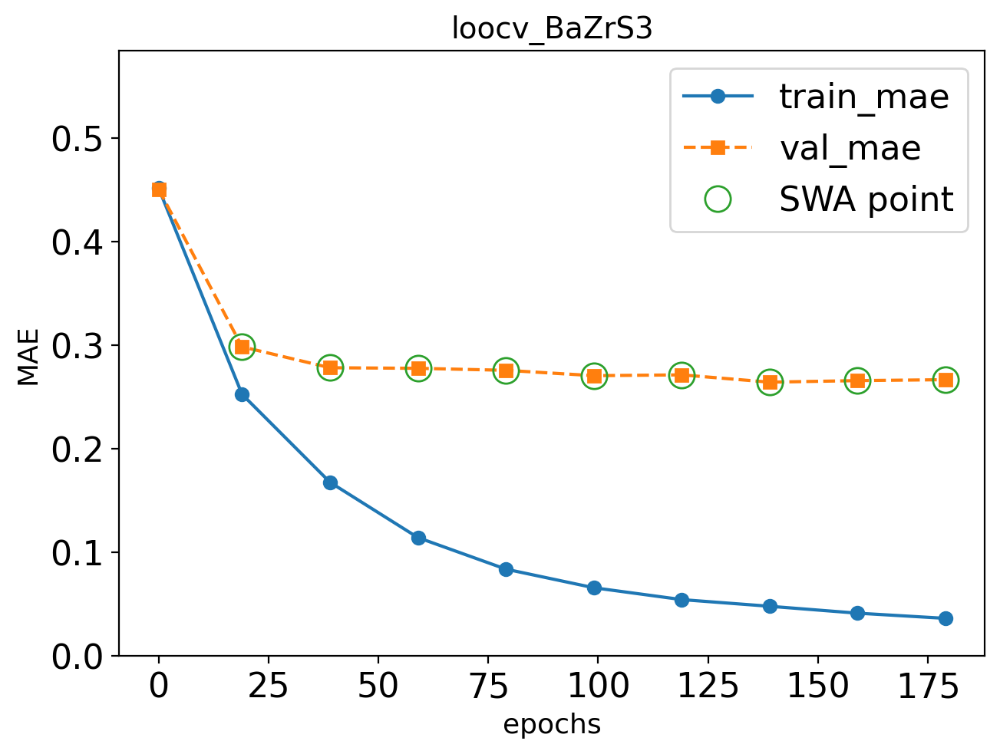

Epoch: 199/300 --- train mae: 0.0334 val mae: 0.26


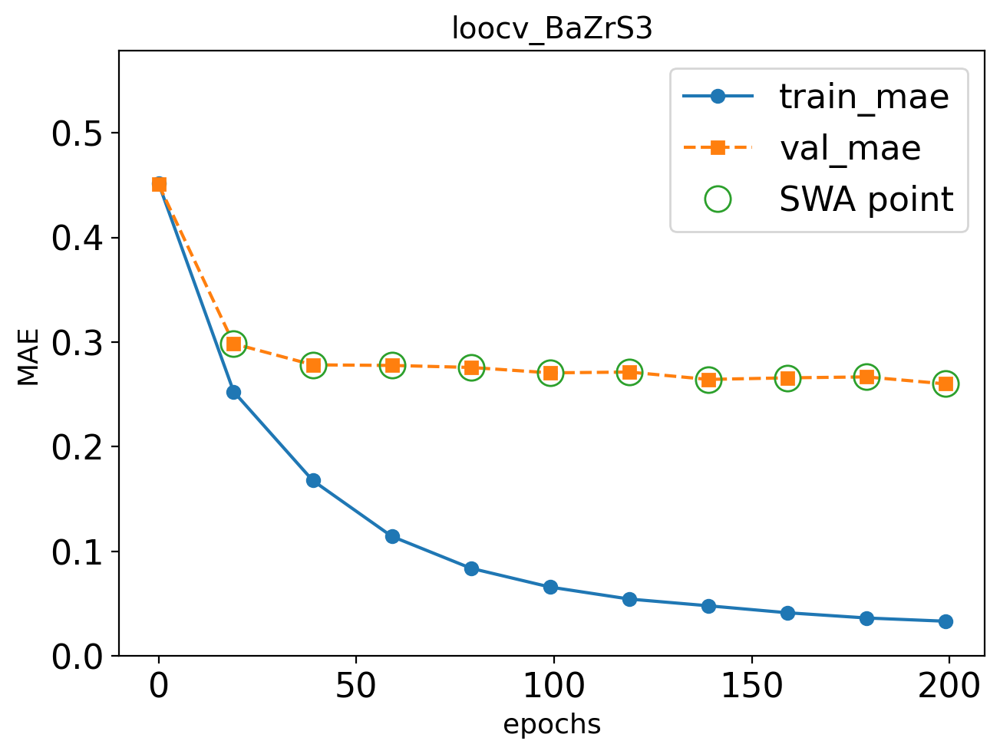

Epoch 219 failed to improve.
Discarded: 2/3 weight updates
Epoch: 219/300 --- train mae: 0.0317 val mae: 0.27


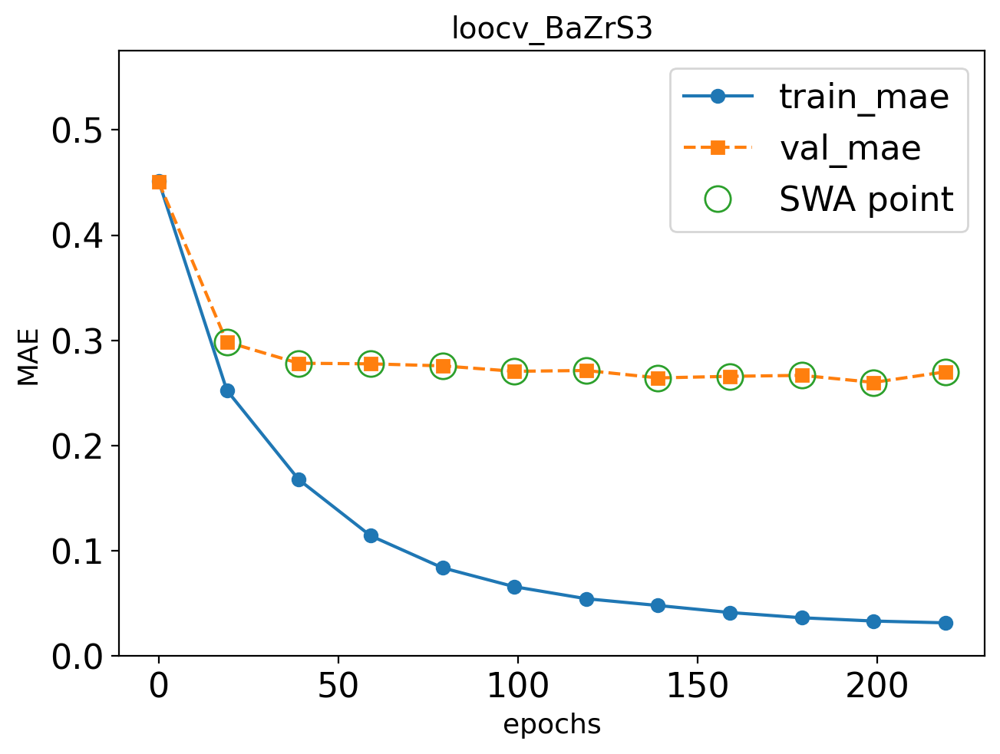

Epoch 239 failed to improve.
Discarded: 3/3 weight updates
Epoch: 239/300 --- train mae: 0.0298 val mae: 0.271


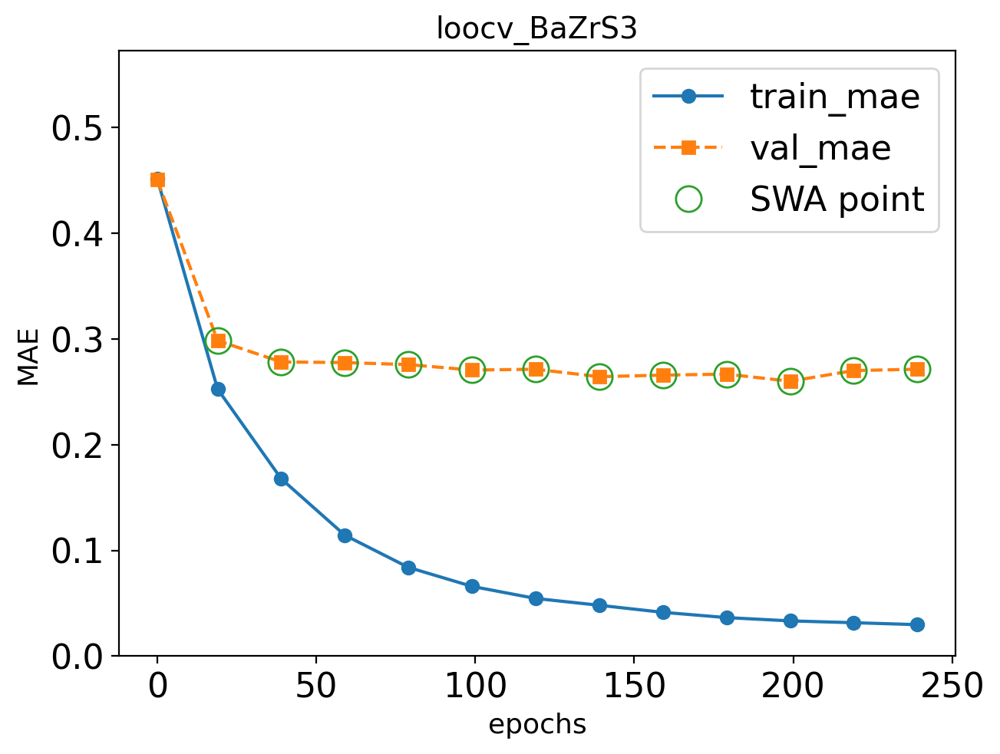

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_BaZrS3) to models/trained_models/loocv_BaZrS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 18558.87formulae/s]

loading data with up to 9 elements in the formula
  Actual: 1.85 eV  |  Predicted: 1.78 ± 0.04 eV  |  Residual: -0.08 eV

--- LOOCV fold 6/9: holding out BaZrSe3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 305084.27formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 264420.35formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.46 val mae: 0.462


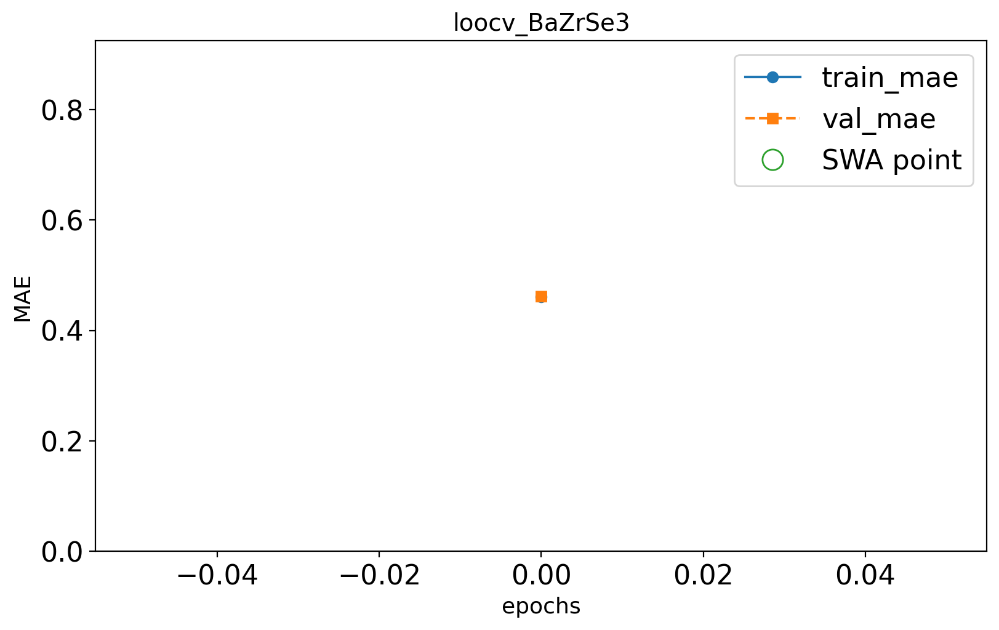

Epoch: 19/300 --- train mae: 0.245 val mae: 0.296


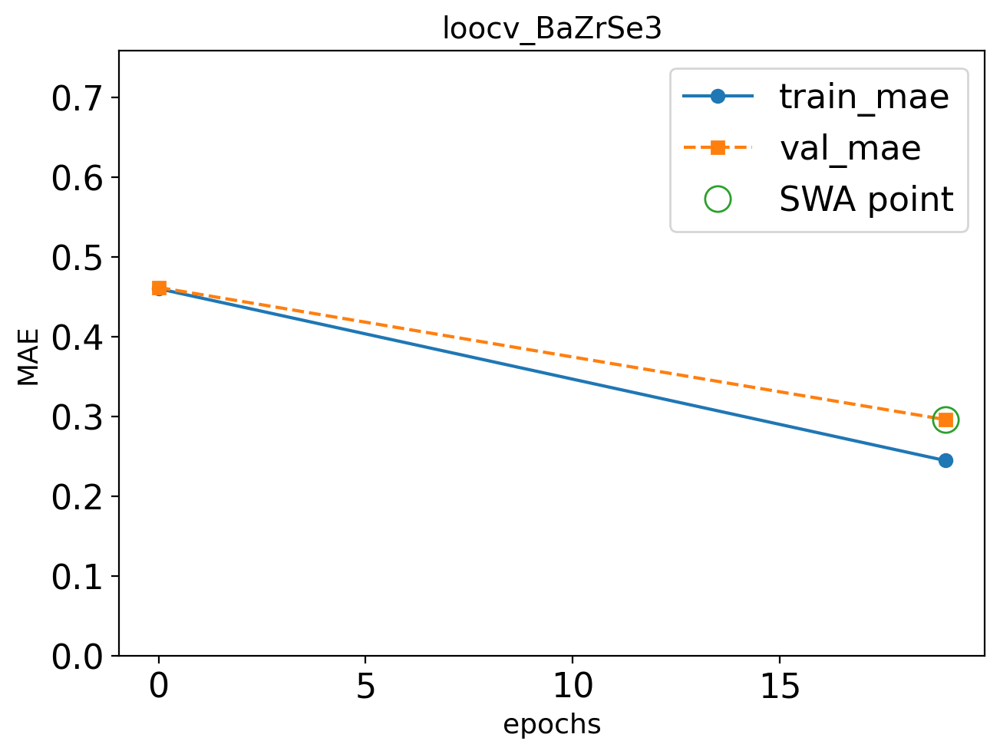

Epoch: 39/300 --- train mae: 0.159 val mae: 0.278


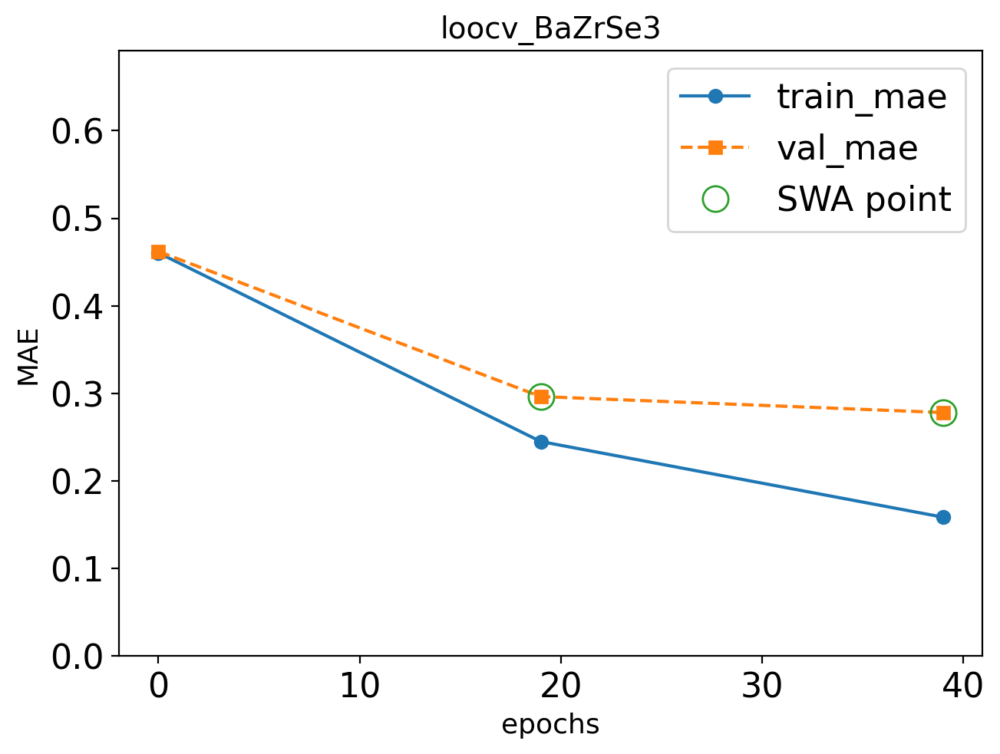

Epoch: 59/300 --- train mae: 0.113 val mae: 0.28


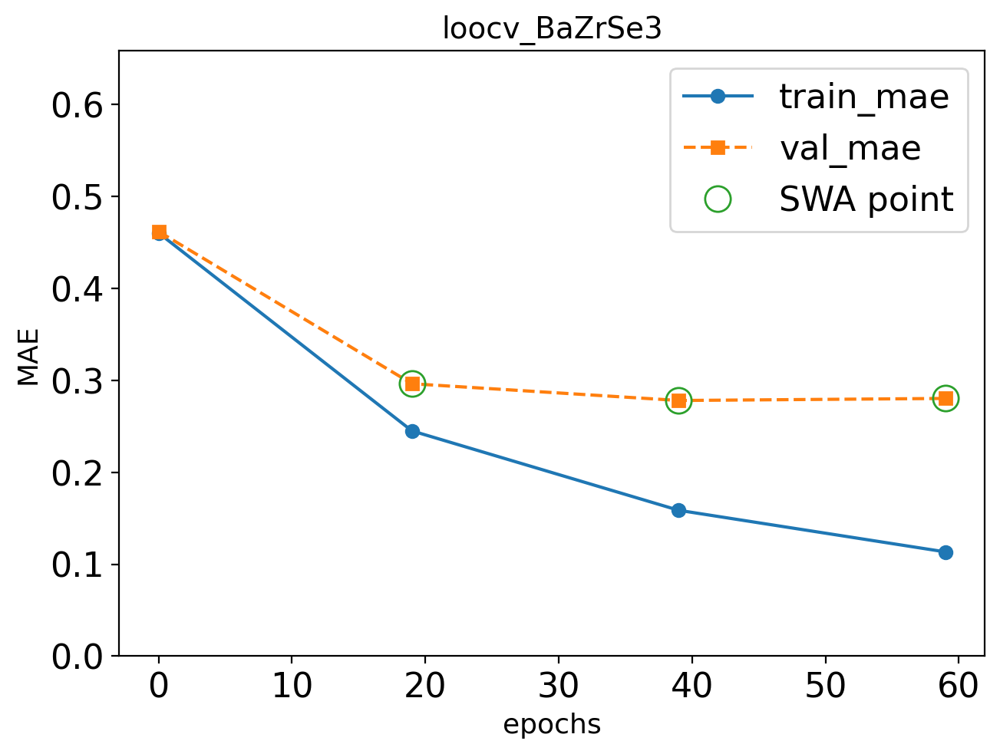

Epoch: 79/300 --- train mae: 0.0819 val mae: 0.275


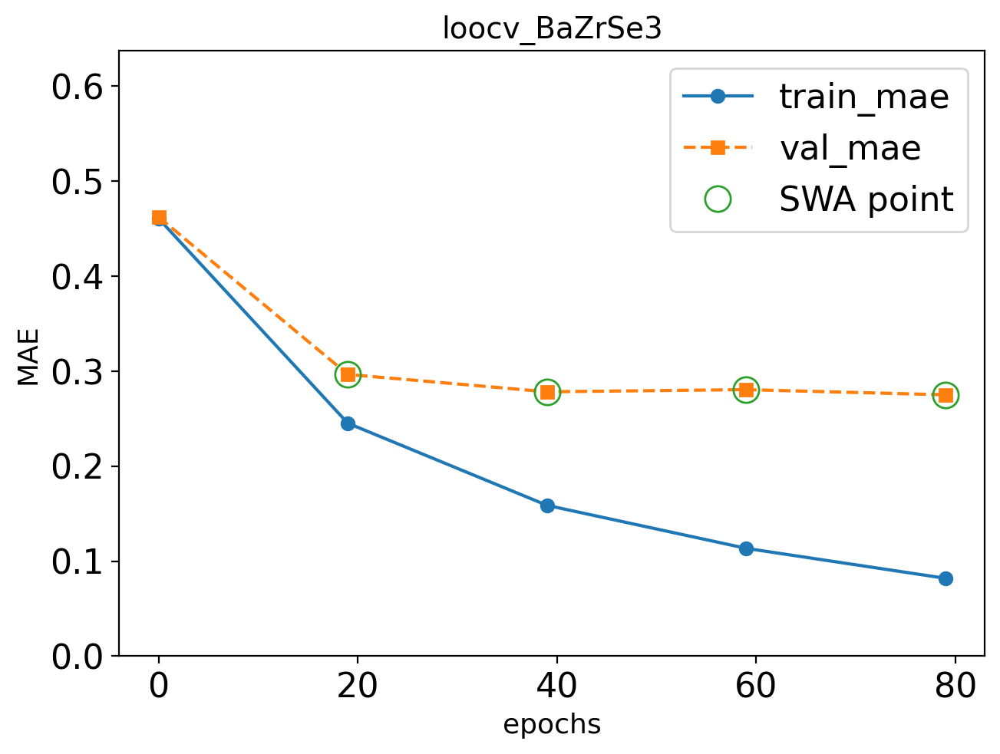

Epoch: 99/300 --- train mae: 0.0648 val mae: 0.275


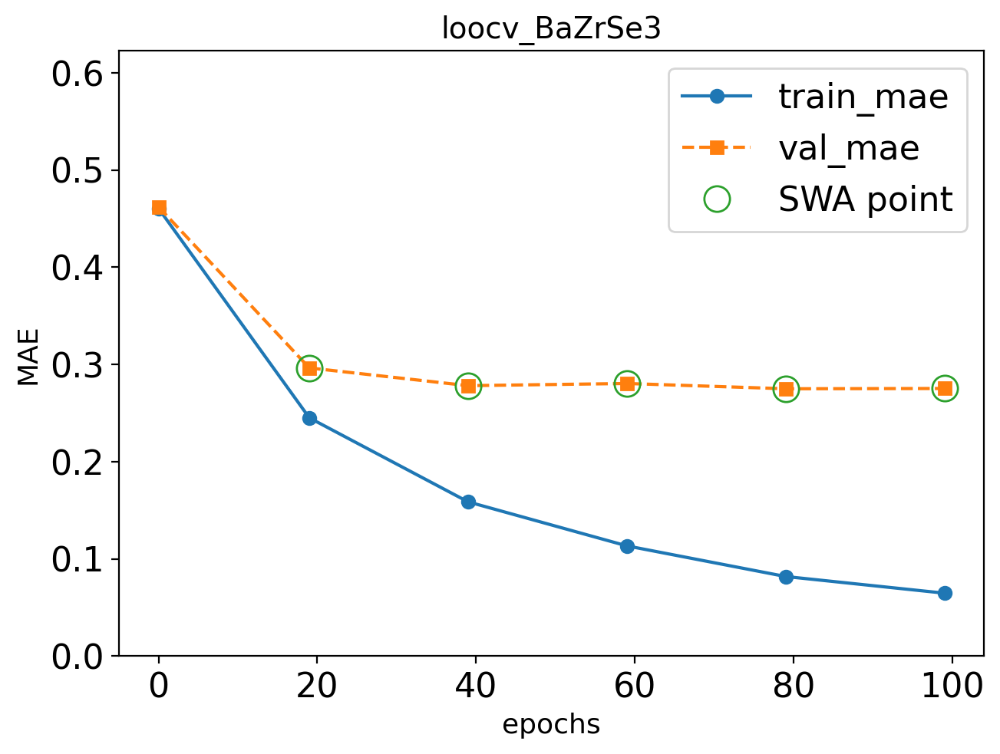

Epoch: 119/300 --- train mae: 0.053 val mae: 0.278


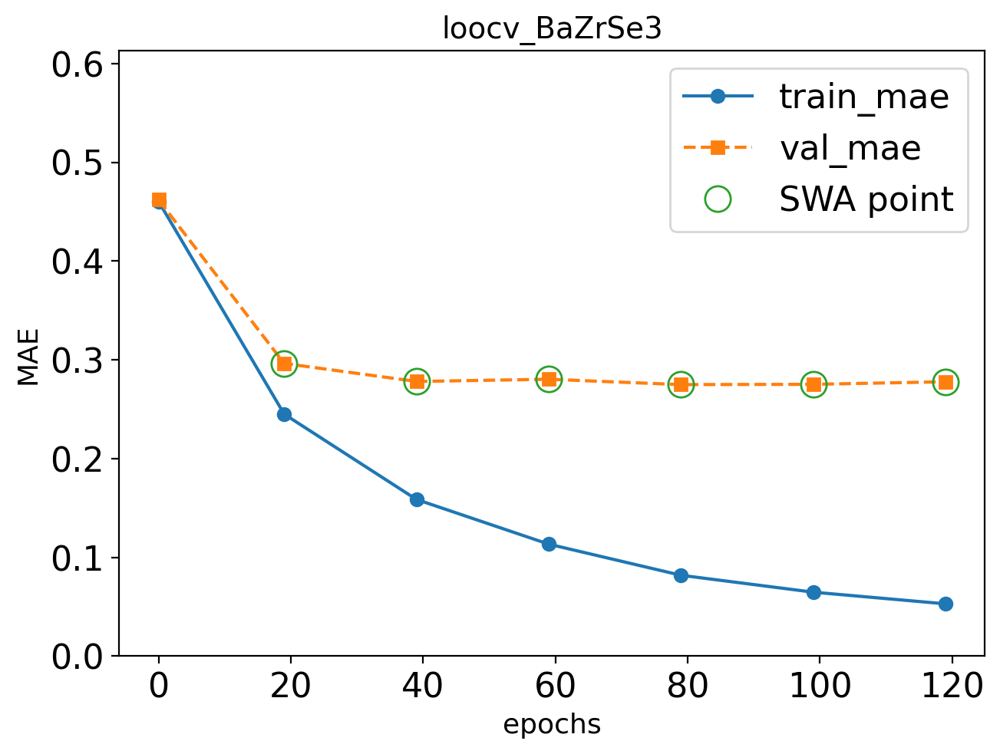

Epoch: 139/300 --- train mae: 0.0455 val mae: 0.276


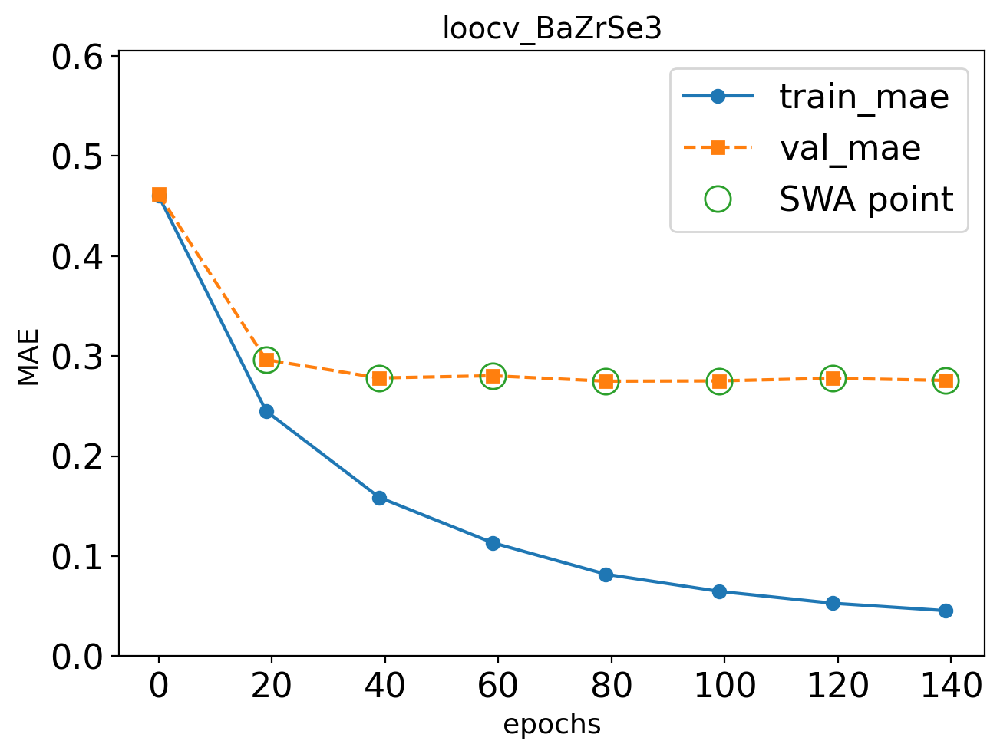

Epoch: 159/300 --- train mae: 0.0402 val mae: 0.272


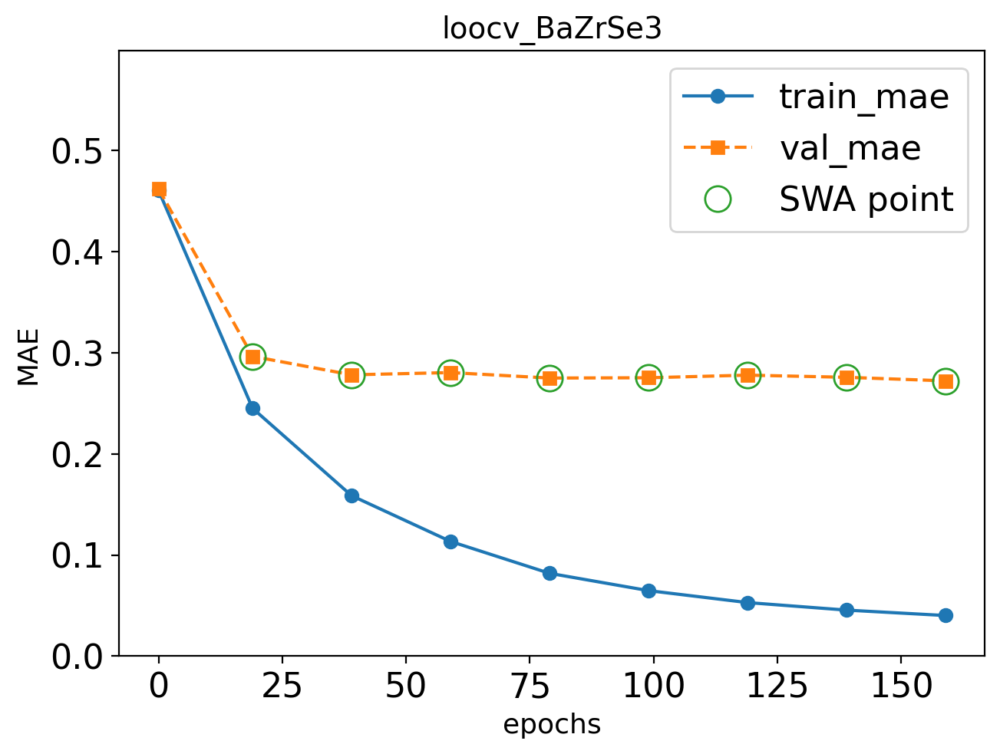

Epoch: 179/300 --- train mae: 0.0351 val mae: 0.273


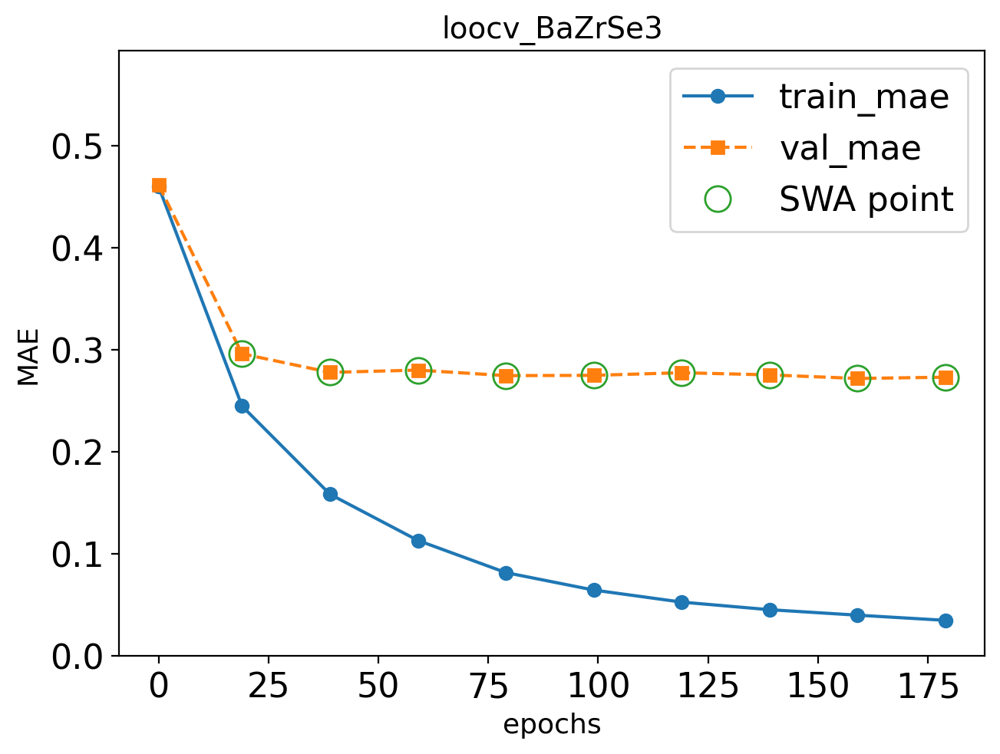

Epoch: 199/300 --- train mae: 0.0331 val mae: 0.272


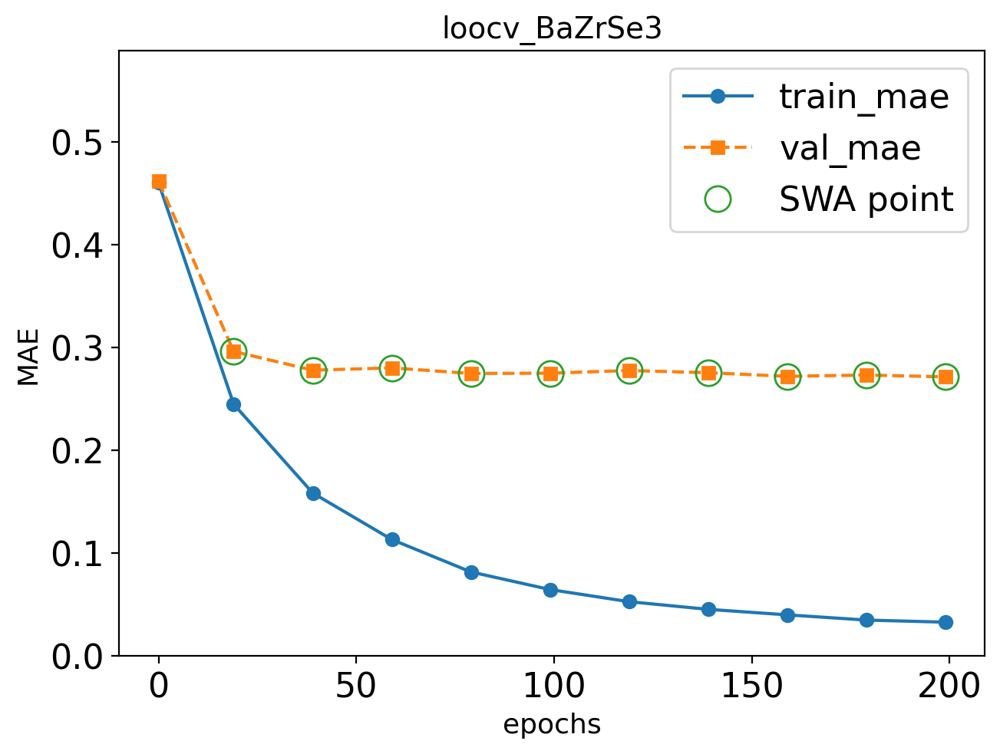

Epoch: 219/300 --- train mae: 0.0309 val mae: 0.264


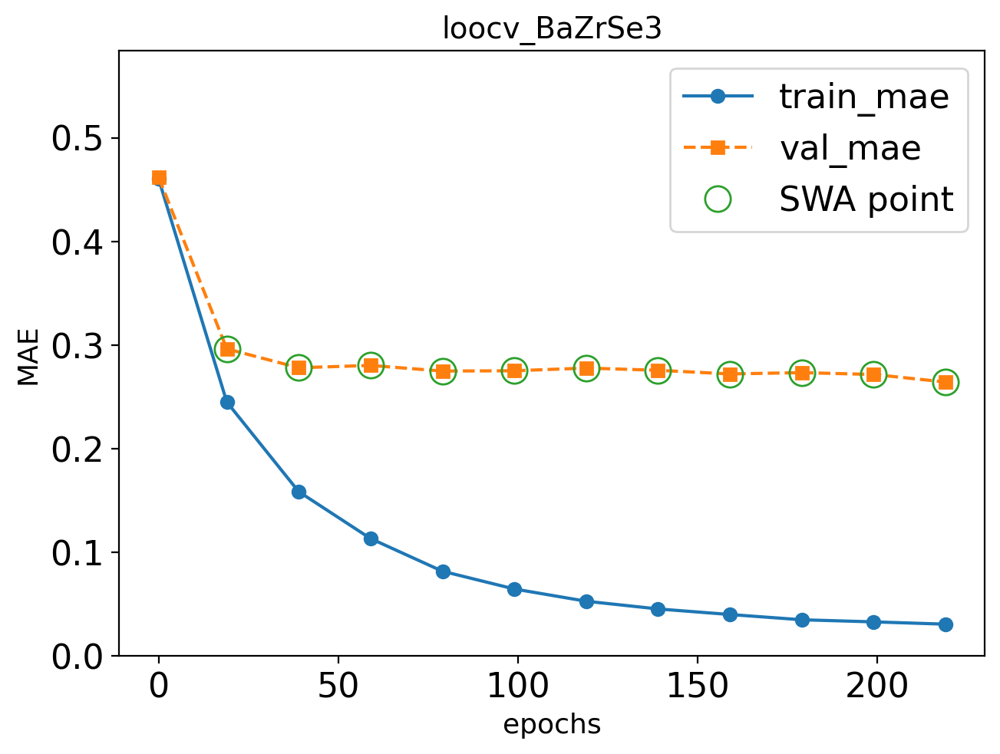

Epoch: 239/300 --- train mae: 0.0301 val mae: 0.267


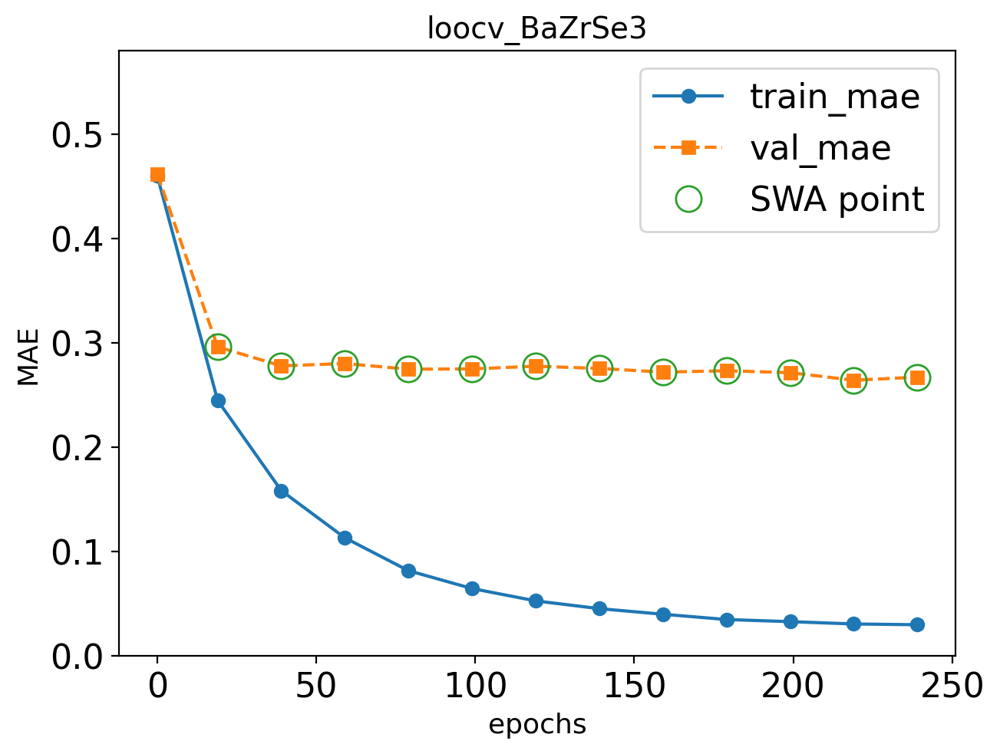

Epoch: 259/300 --- train mae: 0.028 val mae: 0.266


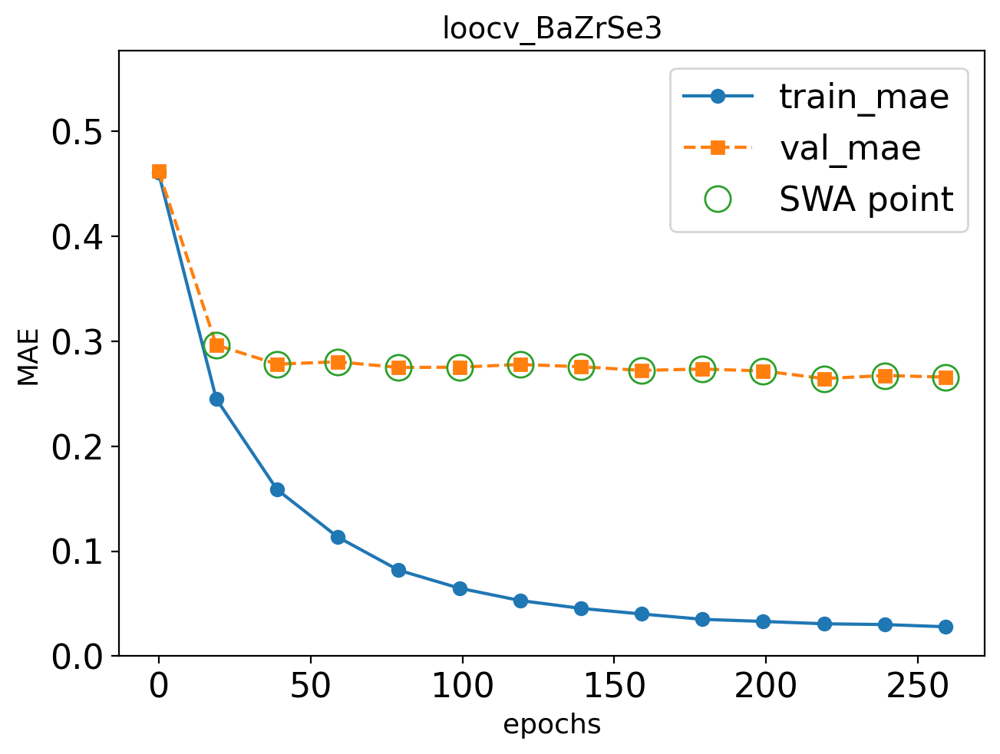

Epoch: 279/300 --- train mae: 0.0267 val mae: 0.265


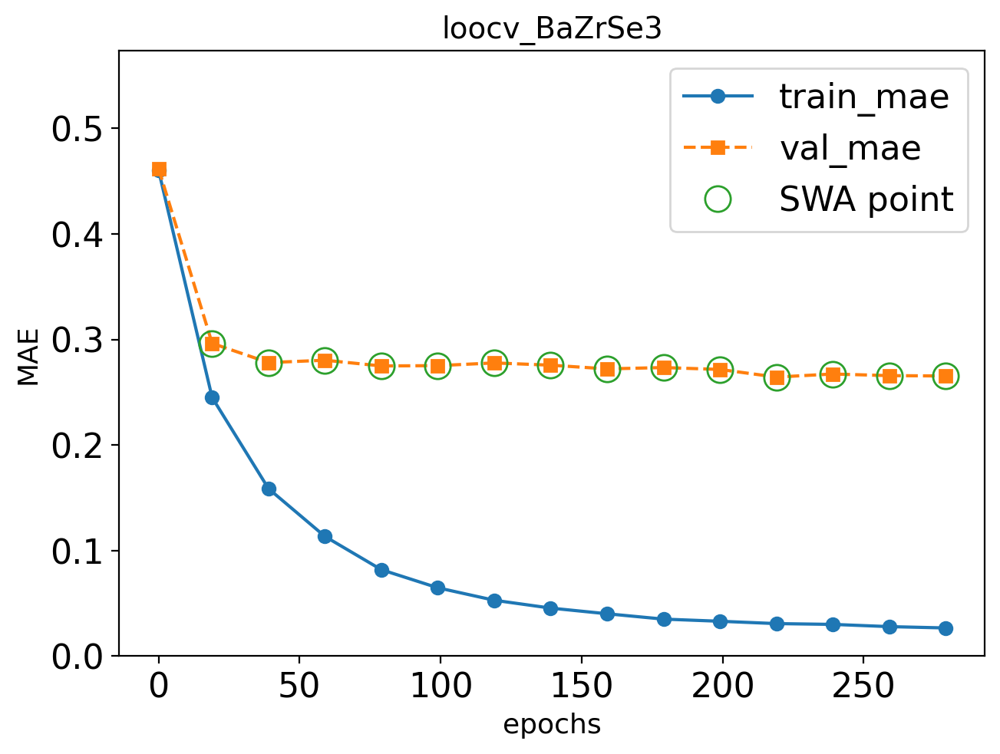

Epoch: 299/300 --- train mae: 0.0267 val mae: 0.266


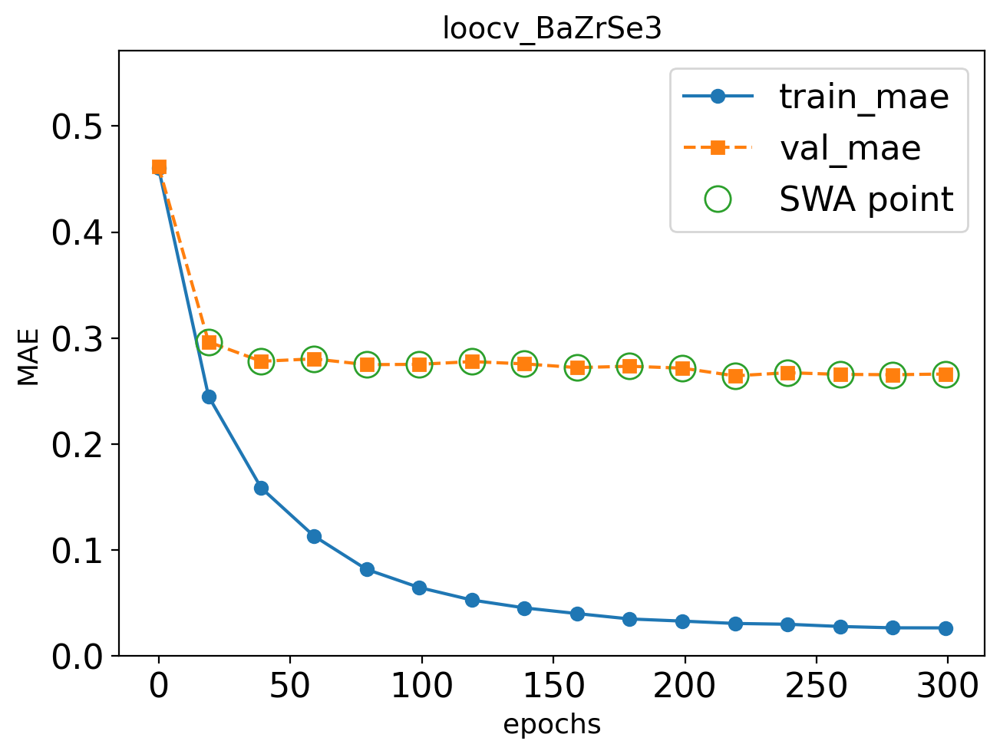

Saving network (loocv_BaZrSe3) to models/trained_models/loocv_BaZrSe3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10407.70formulae/s]

loading data with up to 9 elements in the formula
  Actual: 1.30 eV  |  Predicted: 1.38 ± 0.02 eV  |  Residual: +0.08 eV

--- LOOCV fold 7/9: holding out LaYS3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 314028.85formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 296097.31formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.46 val mae: 0.461


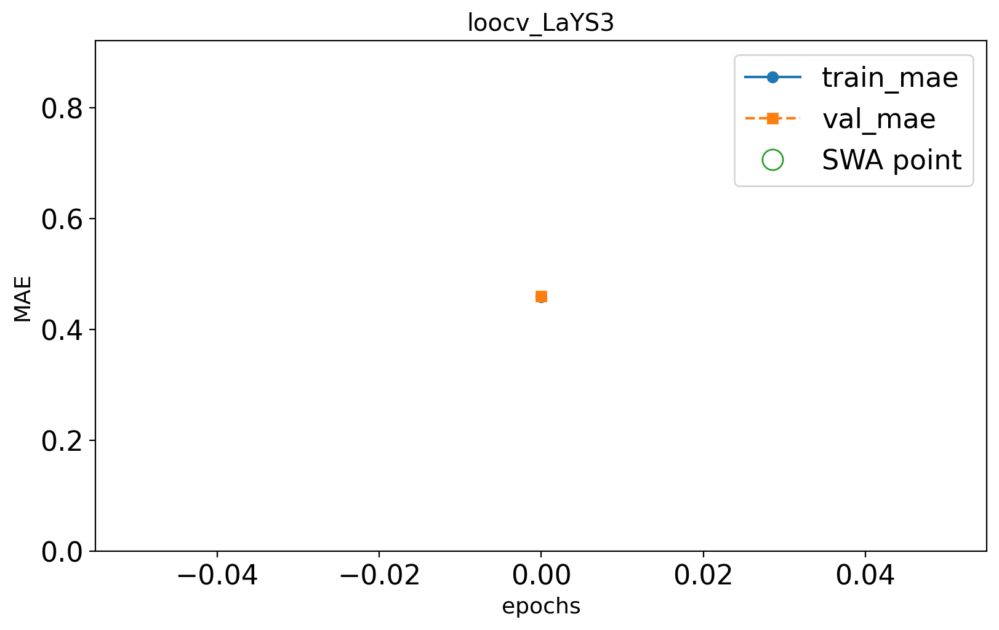

Epoch: 19/300 --- train mae: 0.245 val mae: 0.296


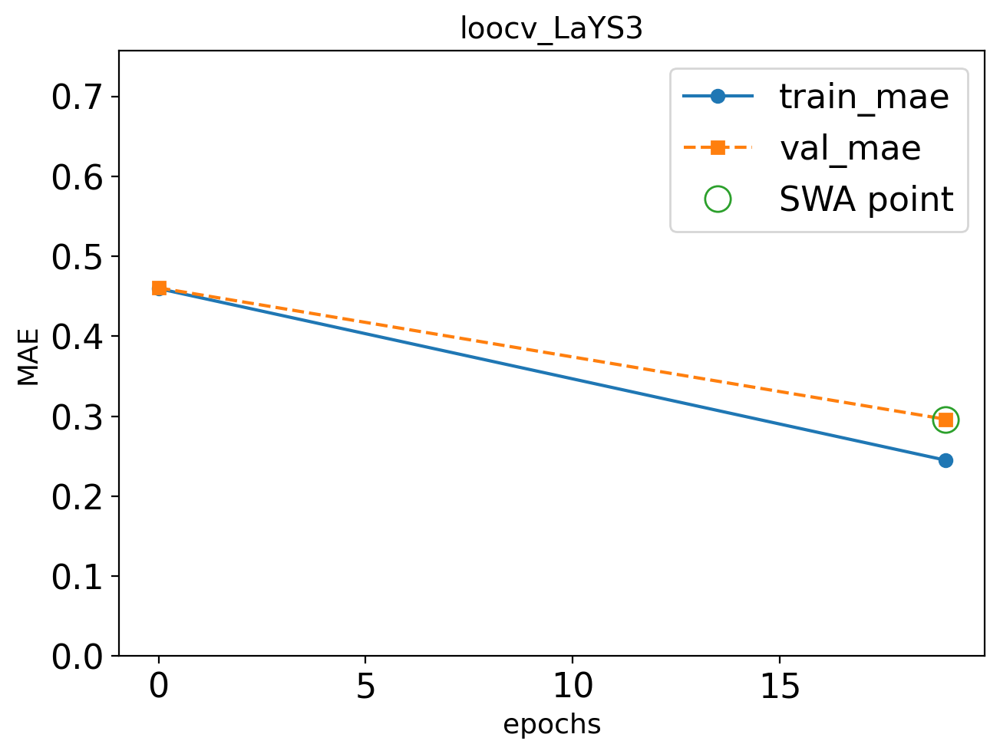

Epoch: 39/300 --- train mae: 0.155 val mae: 0.273


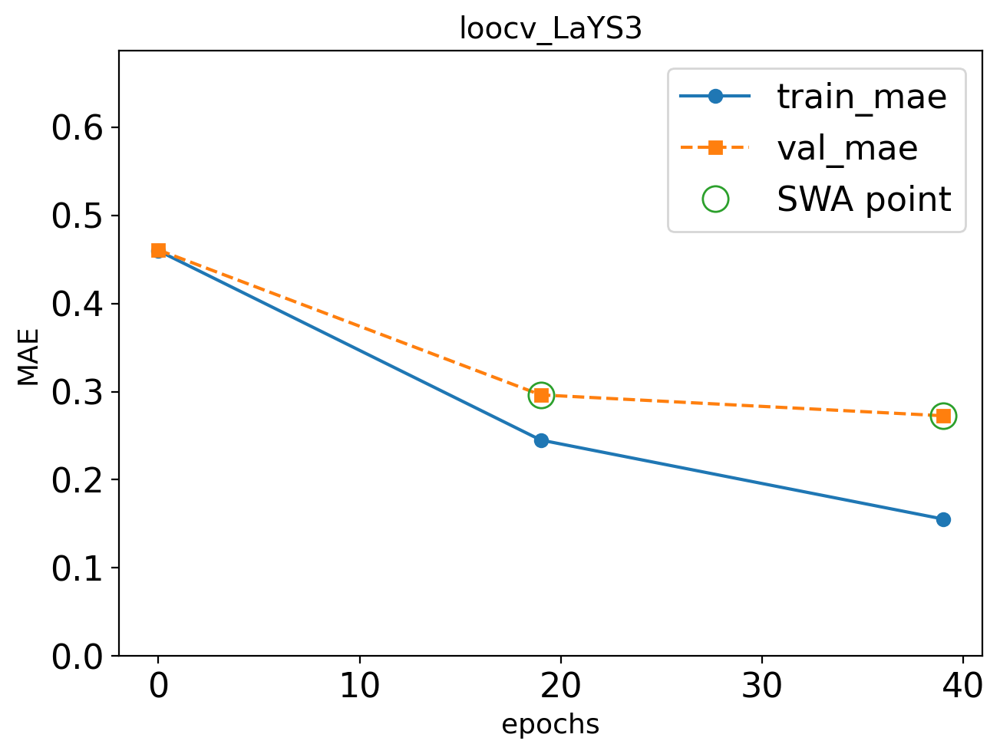

Epoch: 59/300 --- train mae: 0.108 val mae: 0.267


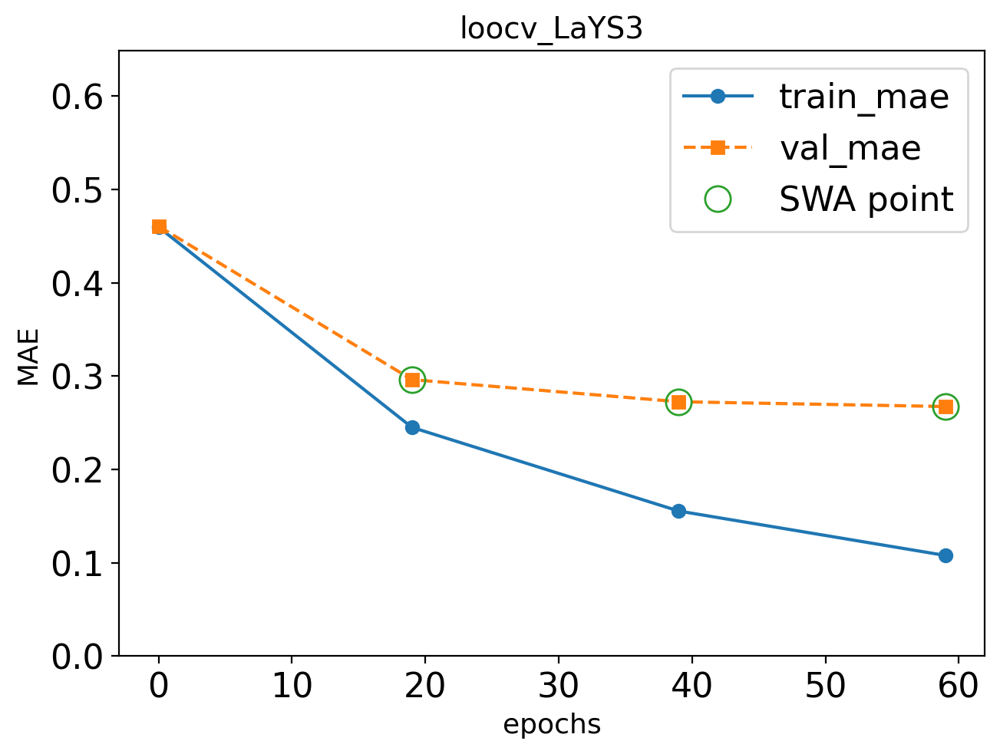

Epoch: 79/300 --- train mae: 0.0805 val mae: 0.268


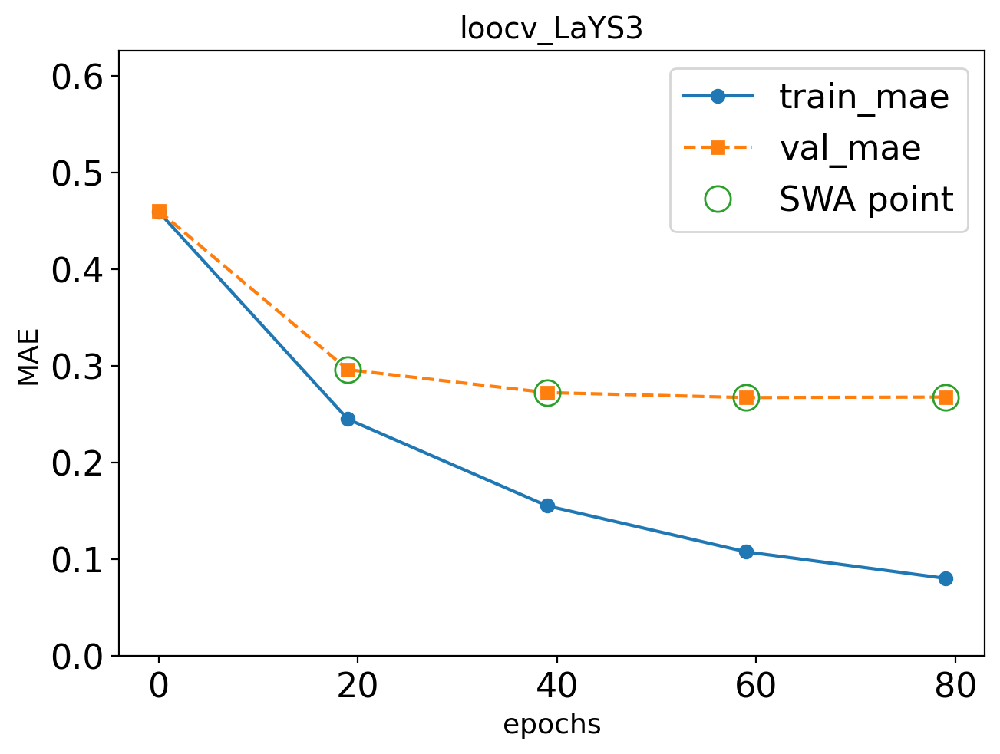

Epoch: 99/300 --- train mae: 0.0635 val mae: 0.259


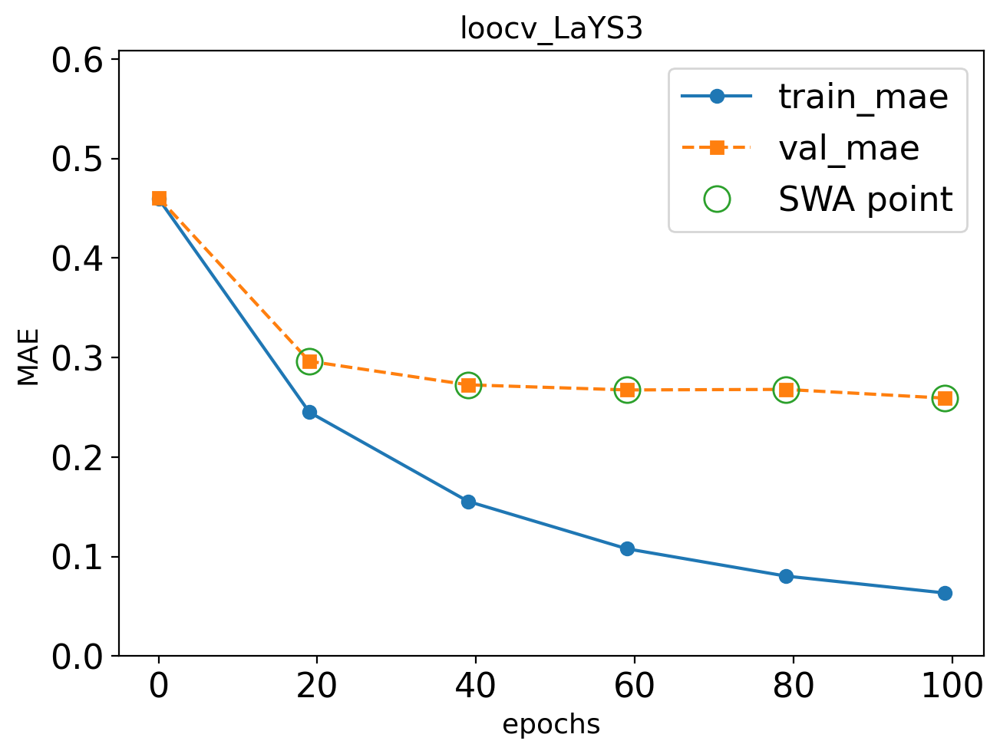

Epoch: 119/300 --- train mae: 0.0518 val mae: 0.259


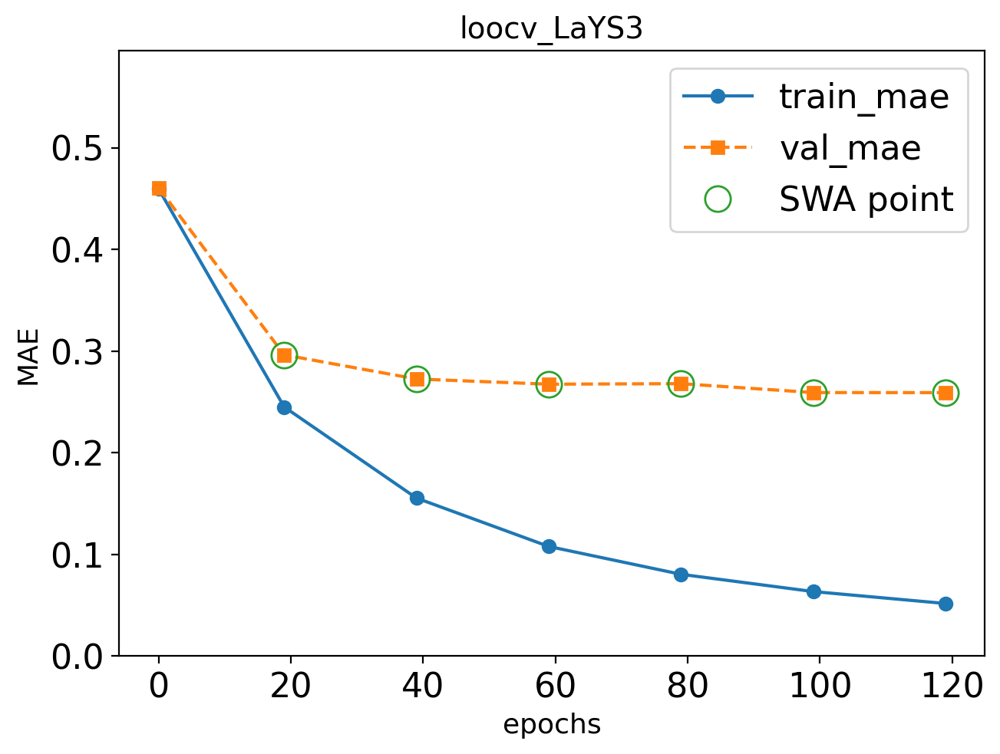

Epoch: 139/300 --- train mae: 0.0448 val mae: 0.257


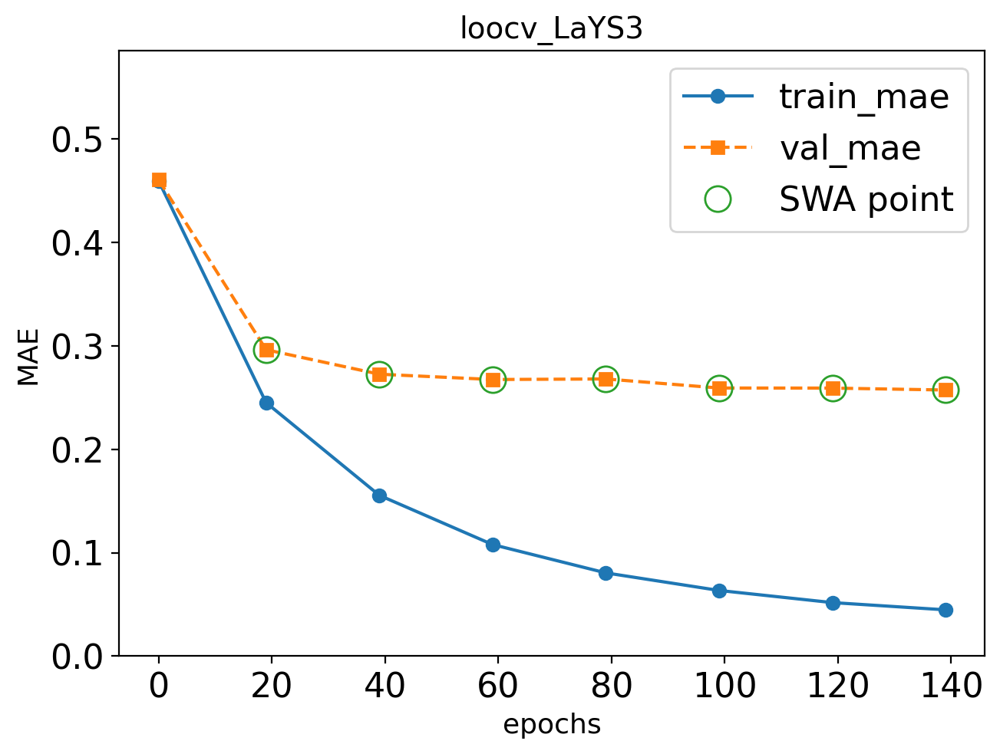

Epoch: 159/300 --- train mae: 0.0381 val mae: 0.256


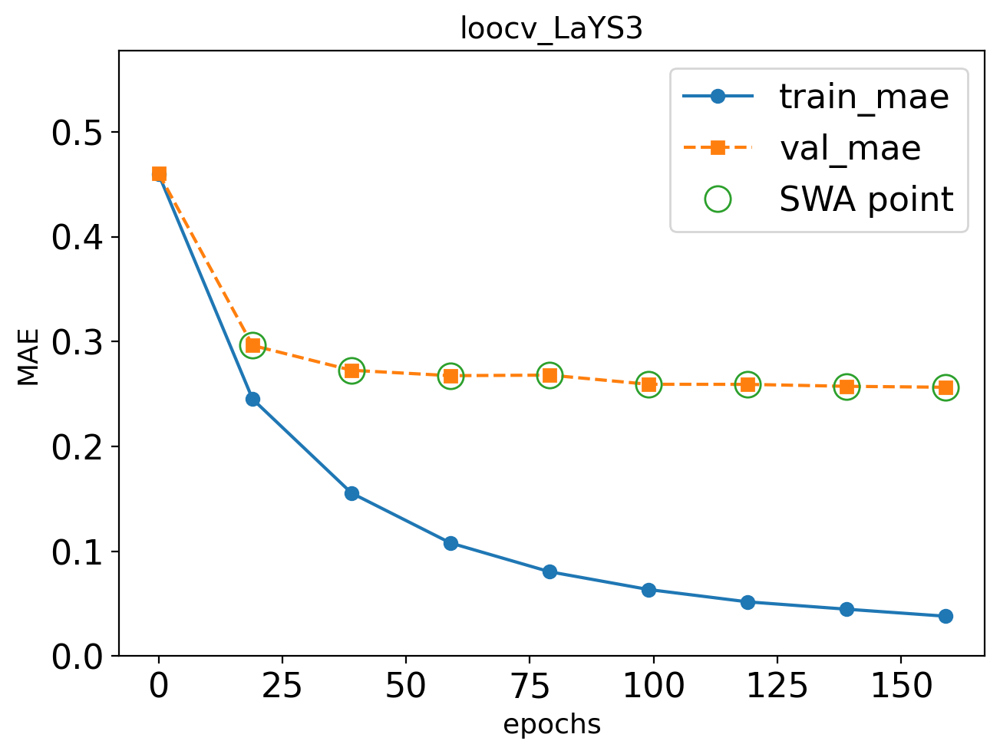

Epoch: 179/300 --- train mae: 0.0341 val mae: 0.258


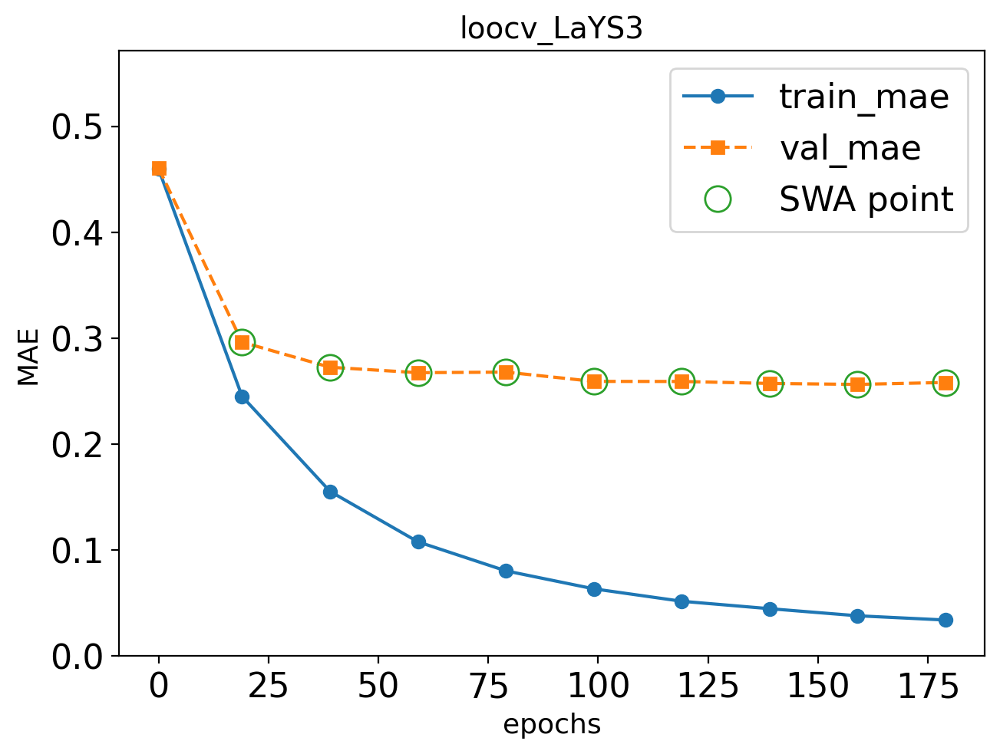

Epoch: 199/300 --- train mae: 0.0315 val mae: 0.252


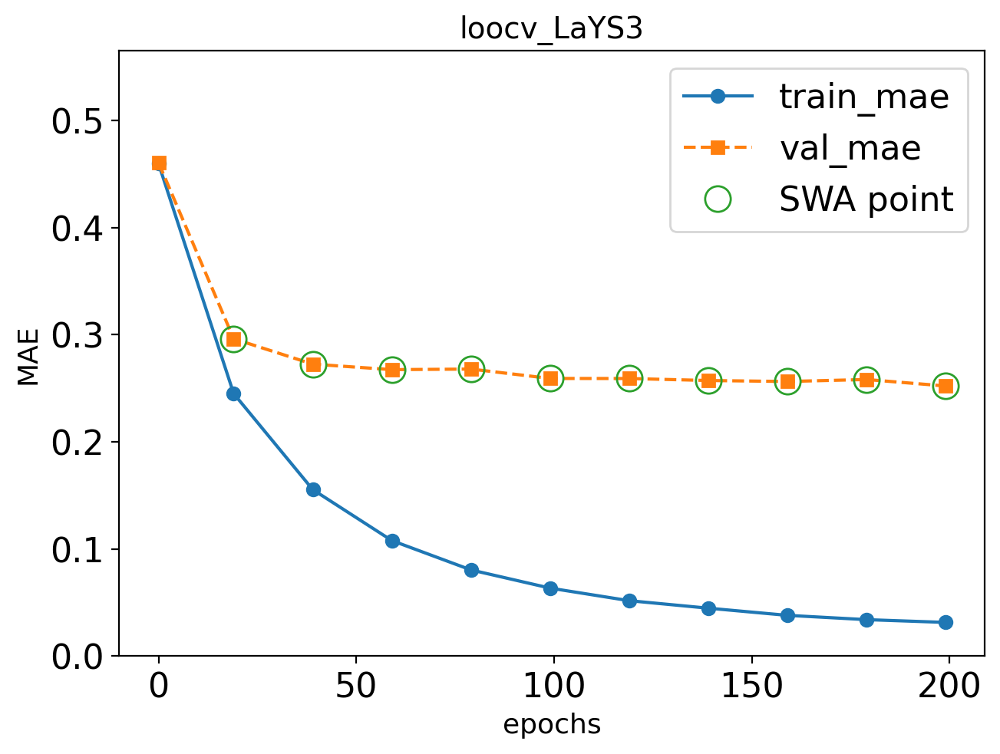

Epoch 219 failed to improve.
Discarded: 1/3 weight updates
Epoch: 219/300 --- train mae: 0.0295 val mae: 0.259


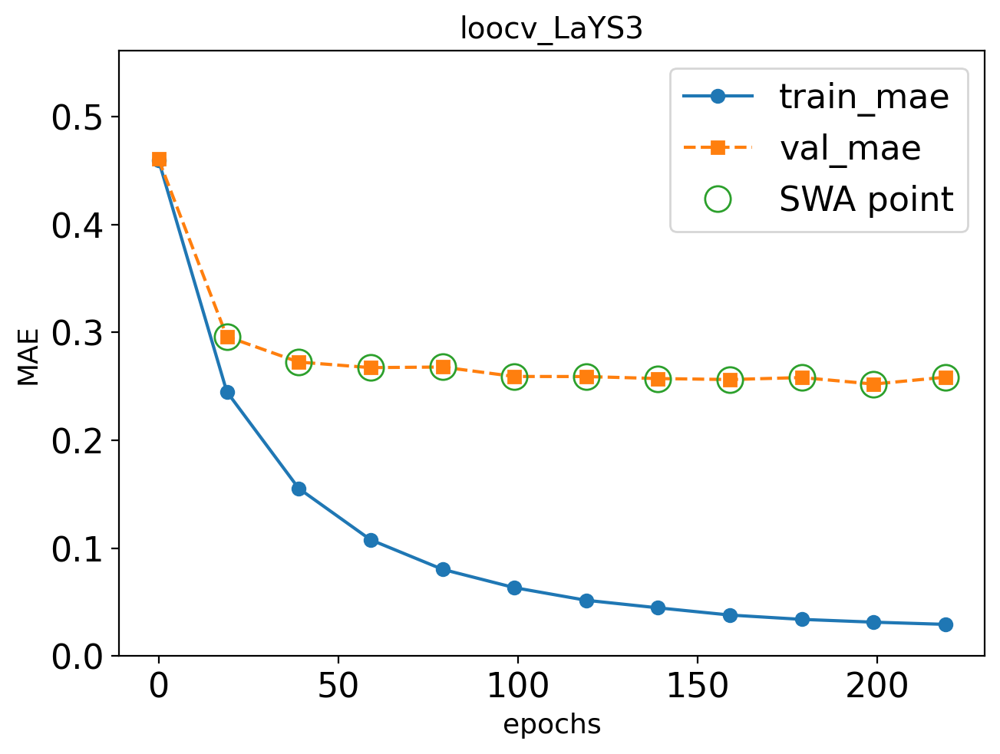

Epoch 239 failed to improve.
Discarded: 2/3 weight updates
Epoch: 239/300 --- train mae: 0.0273 val mae: 0.264


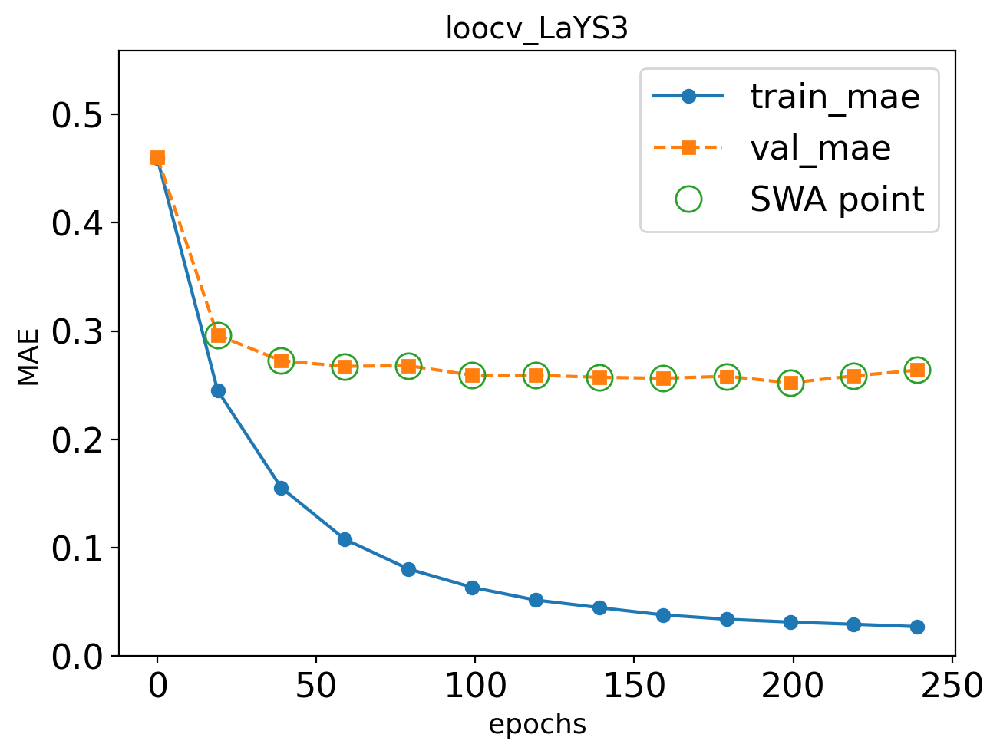

Epoch 259 failed to improve.
Discarded: 3/3 weight updates
Epoch: 259/300 --- train mae: 0.0266 val mae: 0.261


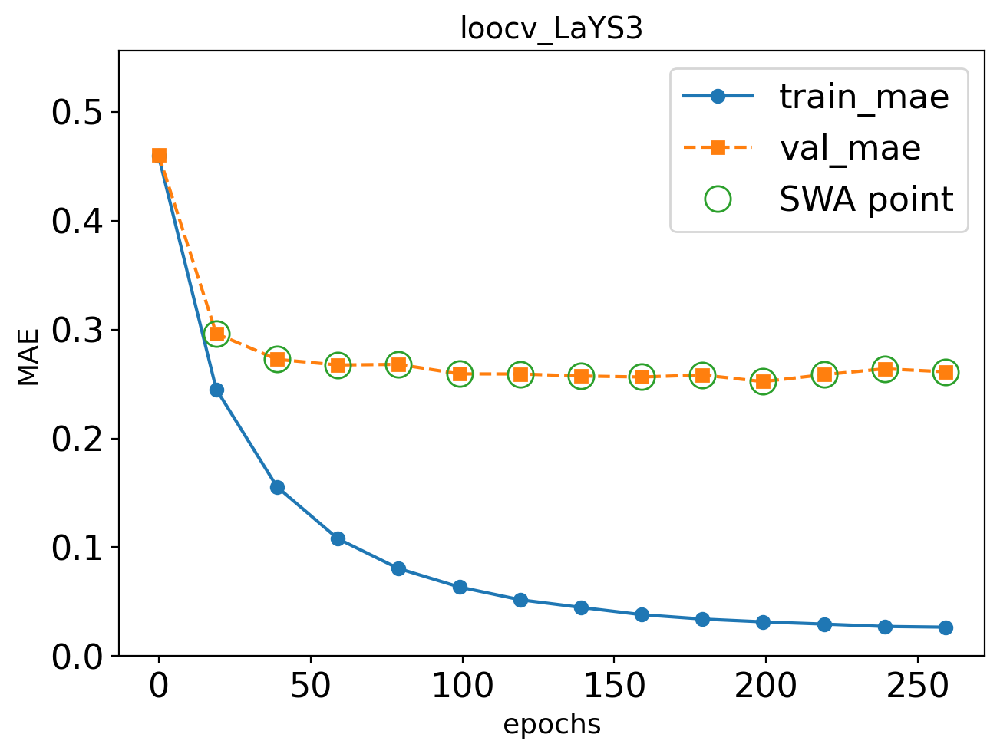

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_LaYS3) to models/trained_models/loocv_LaYS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12372.58formulae/s]

loading data with up to 9 elements in the formula


  Actual: 2.30 eV  |  Predicted: 1.93 ± 0.05 eV  |  Residual: -0.37 eV

--- LOOCV fold 8/9: holding out SrHfS3 ---

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 316495.67formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 320128.75formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.455 val mae: 0.455


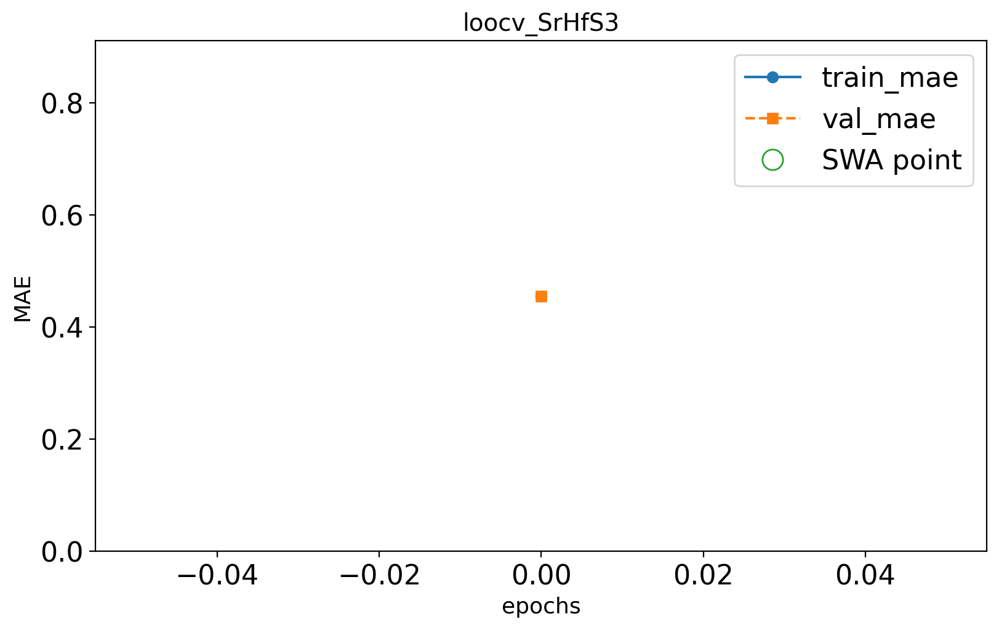

Epoch: 19/300 --- train mae: 0.244 val mae: 0.291


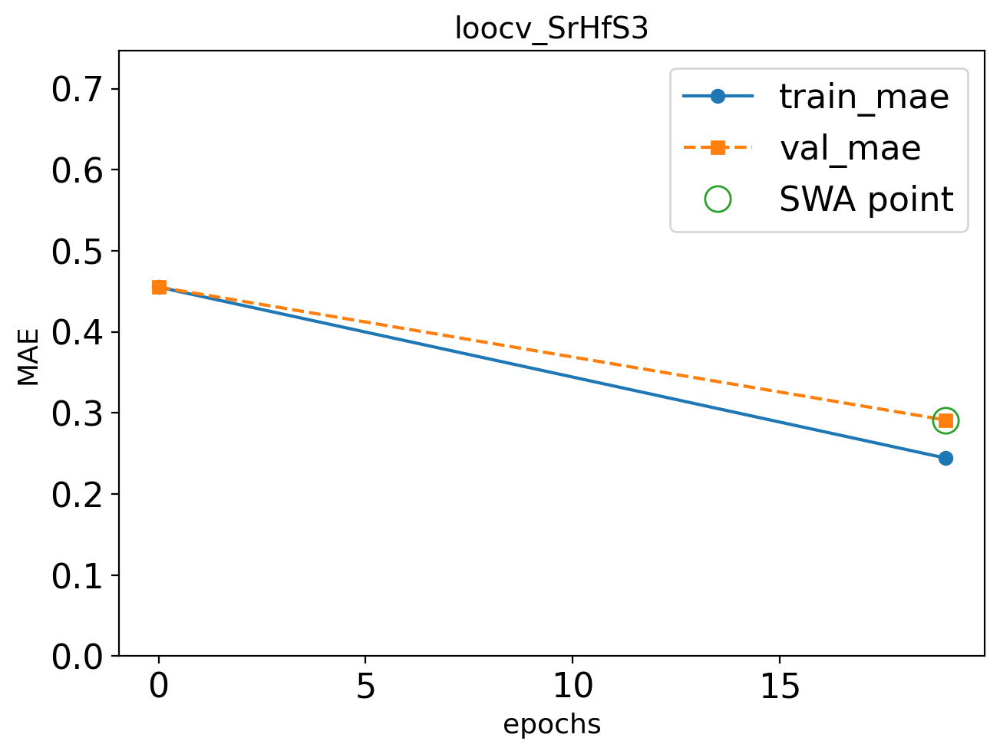

Epoch: 39/300 --- train mae: 0.159 val mae: 0.273


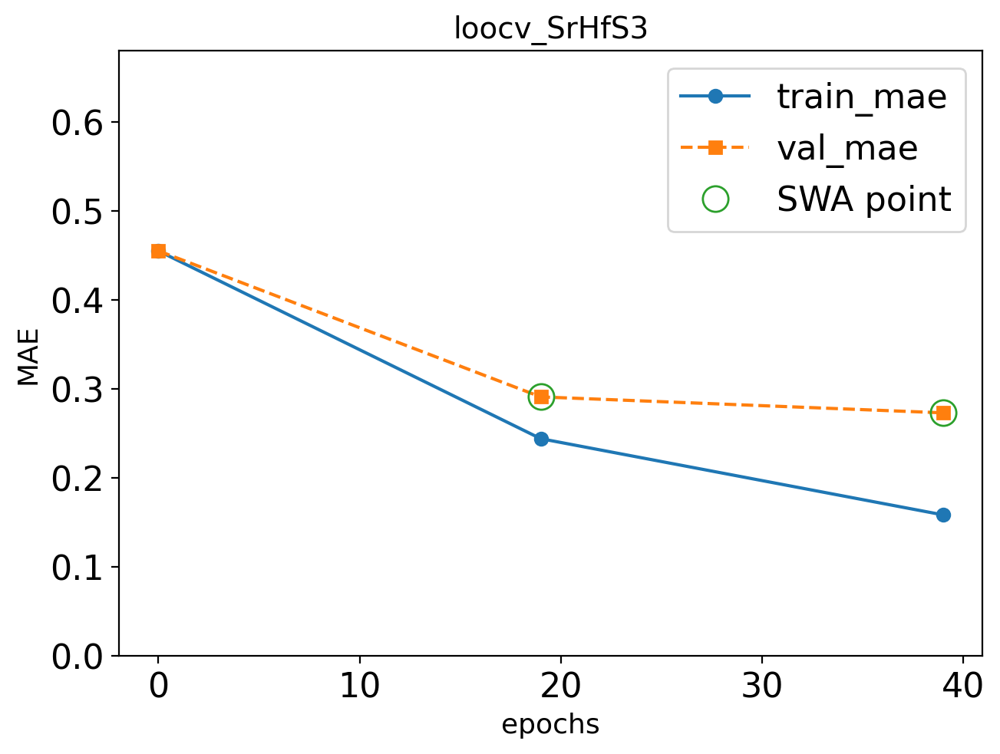

Epoch: 59/300 --- train mae: 0.109 val mae: 0.272


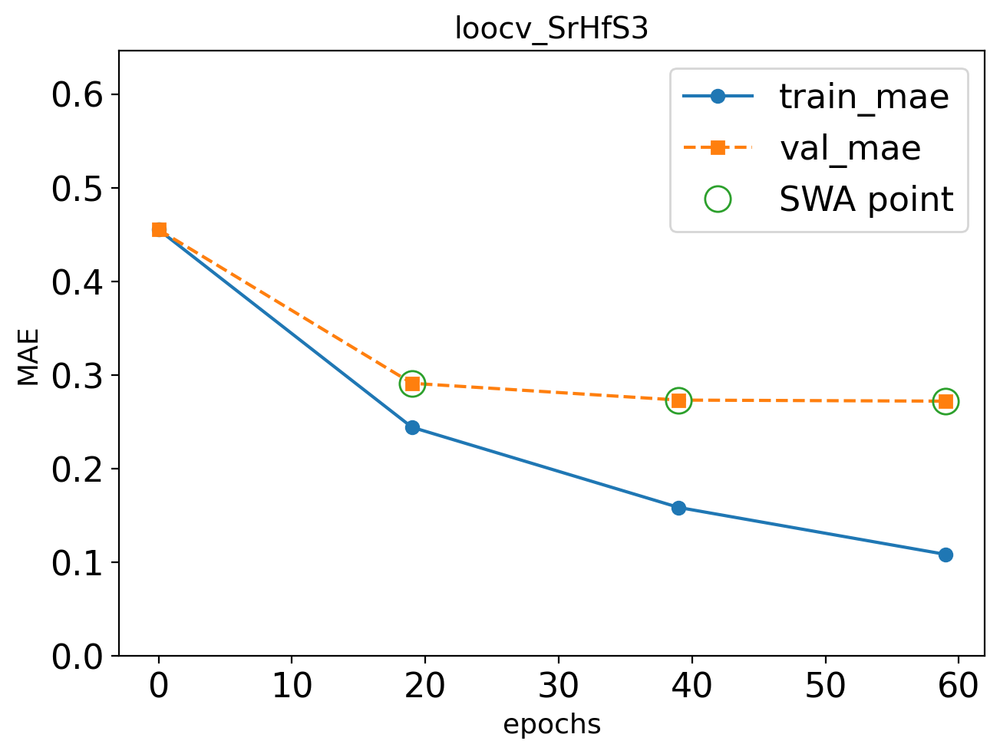

Epoch 79 failed to improve.
Discarded: 1/3 weight updates
Epoch: 79/300 --- train mae: 0.0794 val mae: 0.276


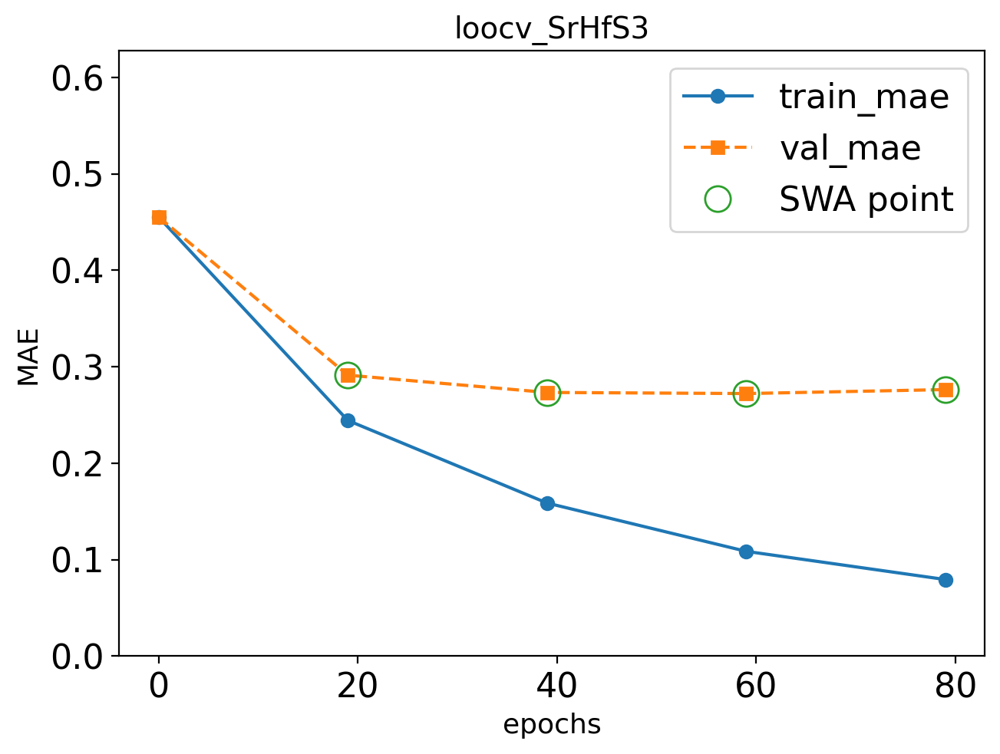

Epoch 99 failed to improve.
Discarded: 2/3 weight updates
Epoch: 99/300 --- train mae: 0.0606 val mae: 0.279


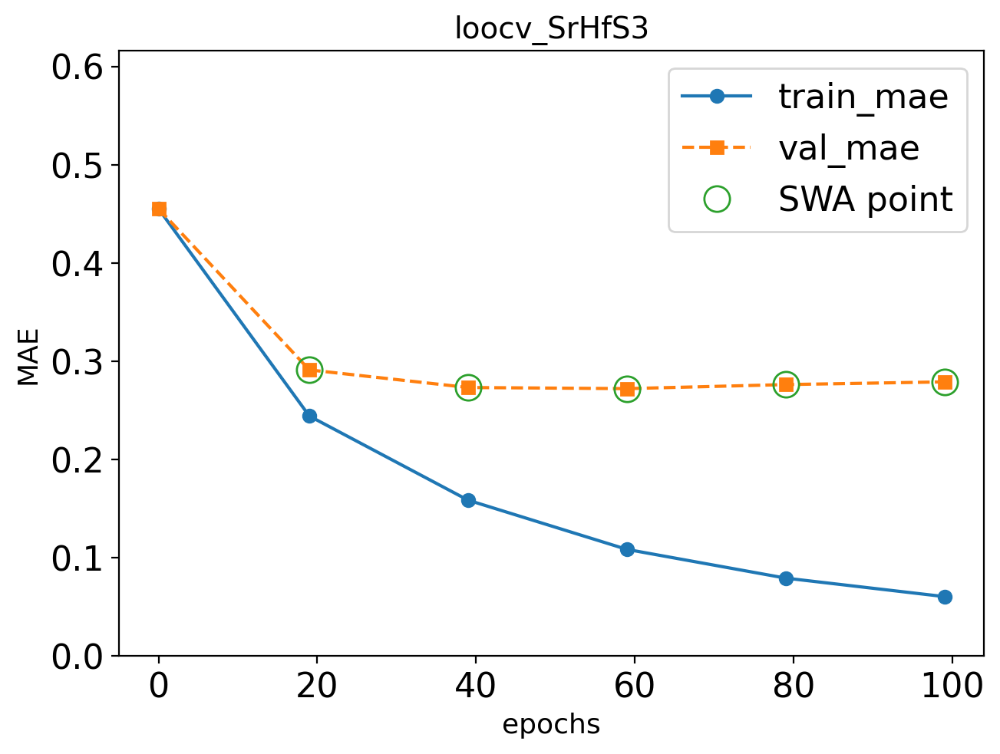

Epoch 119 failed to improve.
Discarded: 3/3 weight updates
Epoch: 119/300 --- train mae: 0.05 val mae: 0.277


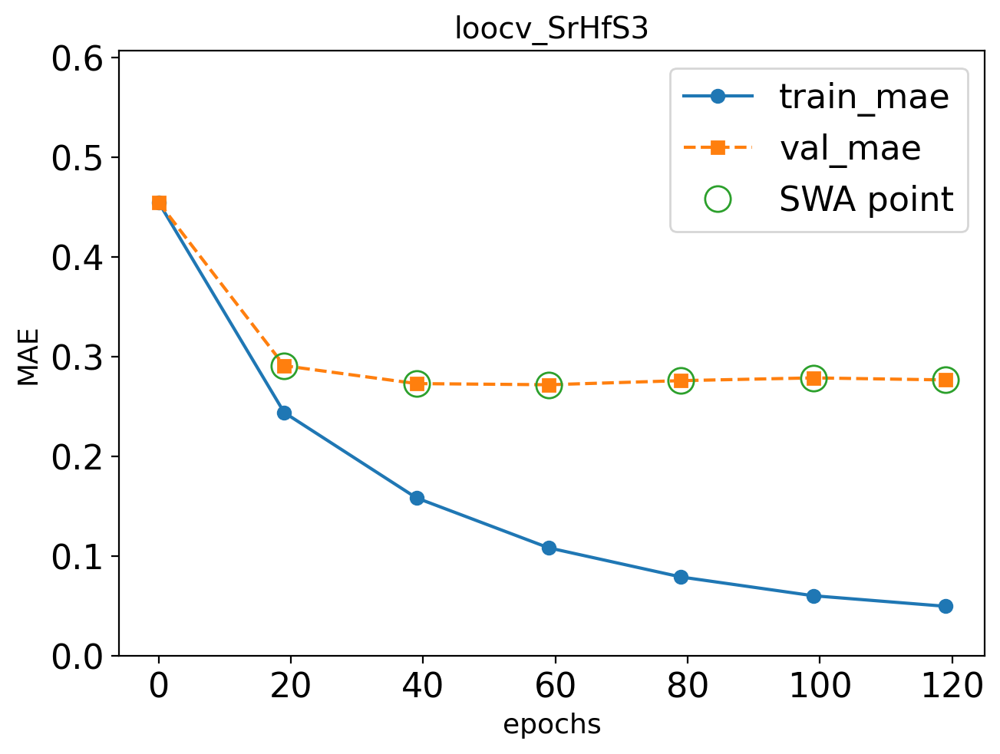

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_SrHfS3) to models/trained_models/loocv_SrHfS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7145.32formulae/s]

loading data with up to 9 elements in the formula
  Actual: 2.37 eV  |  Predicted: 2.21 ± 0.67 eV  |  Residual: -0.15 eV

--- LOOCV fold 9/9: holding out SrZrS3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 313494.86formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 336768.93formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.45 val mae: 0.449


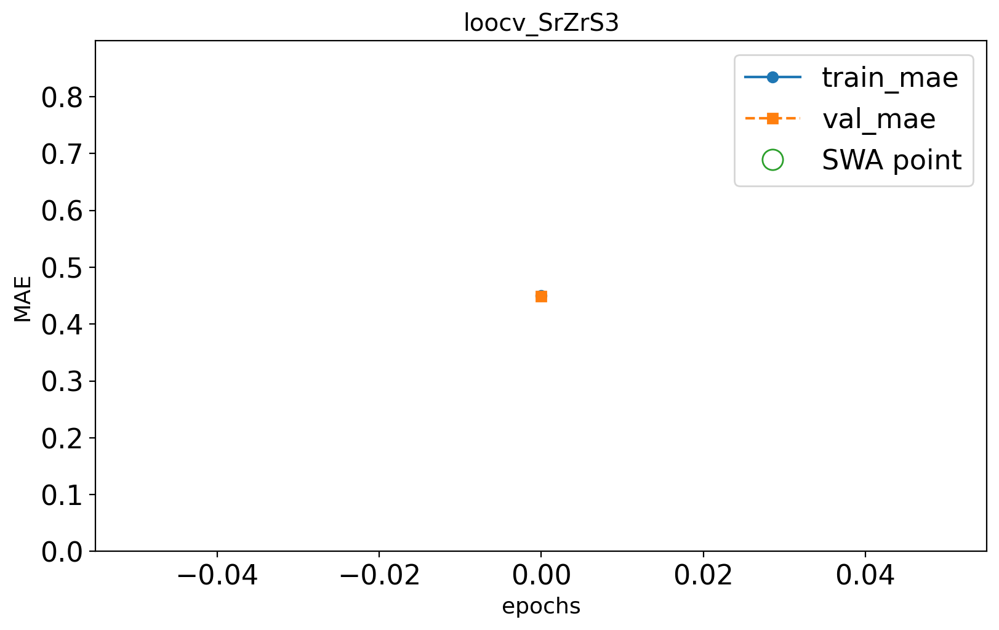

Epoch: 19/300 --- train mae: 0.251 val mae: 0.293


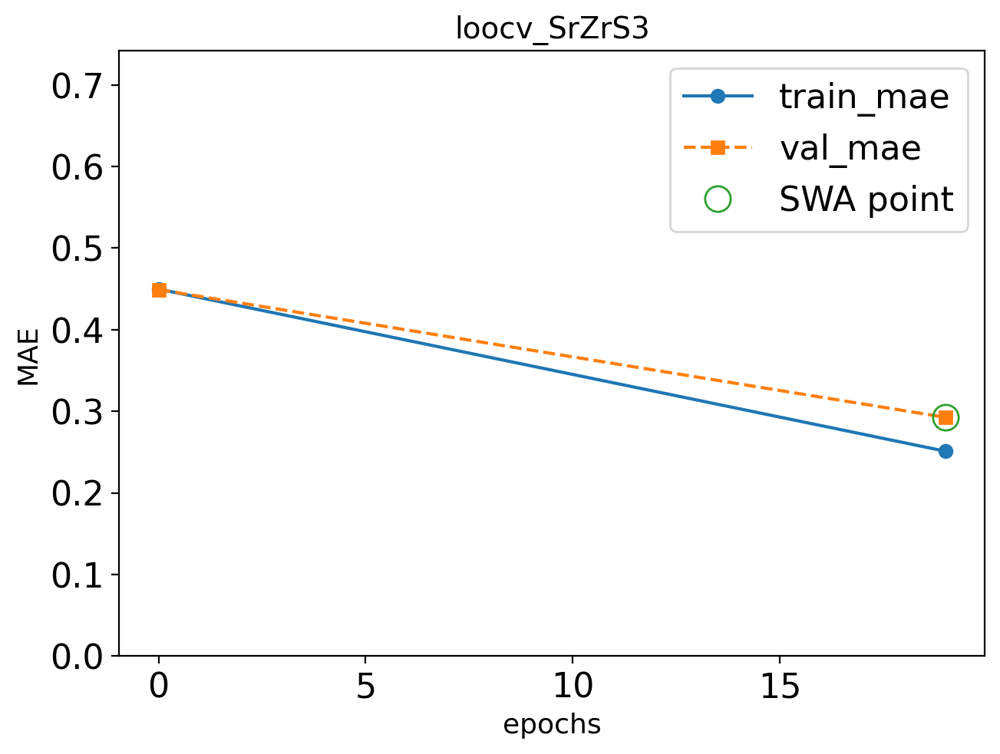

Epoch: 39/300 --- train mae: 0.162 val mae: 0.281


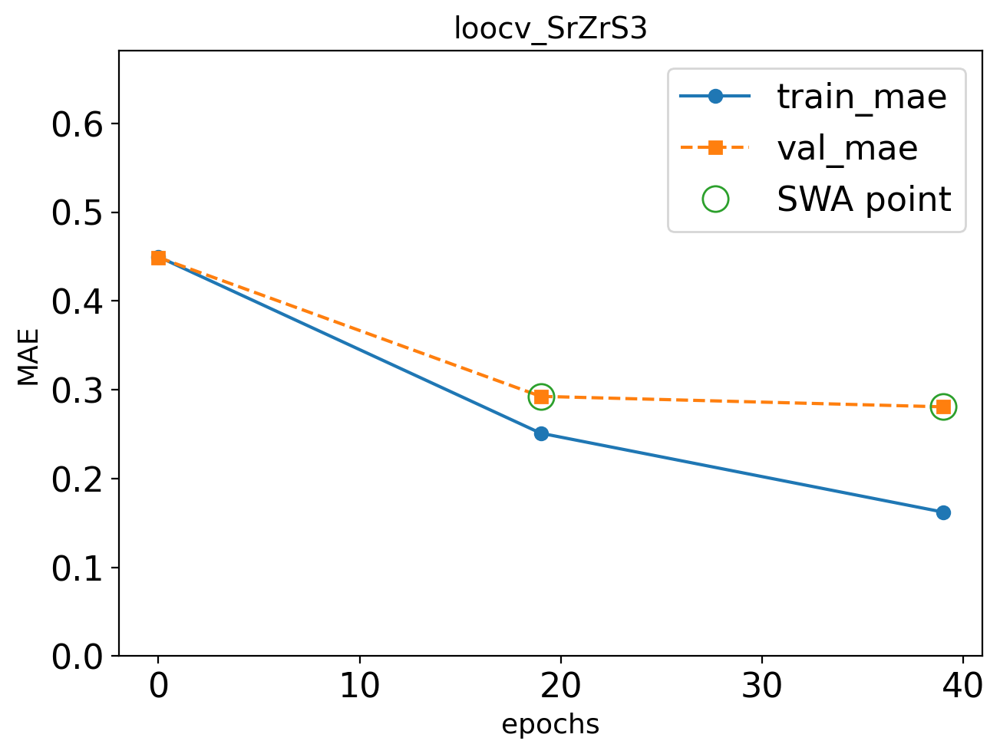

Epoch: 59/300 --- train mae: 0.11 val mae: 0.271


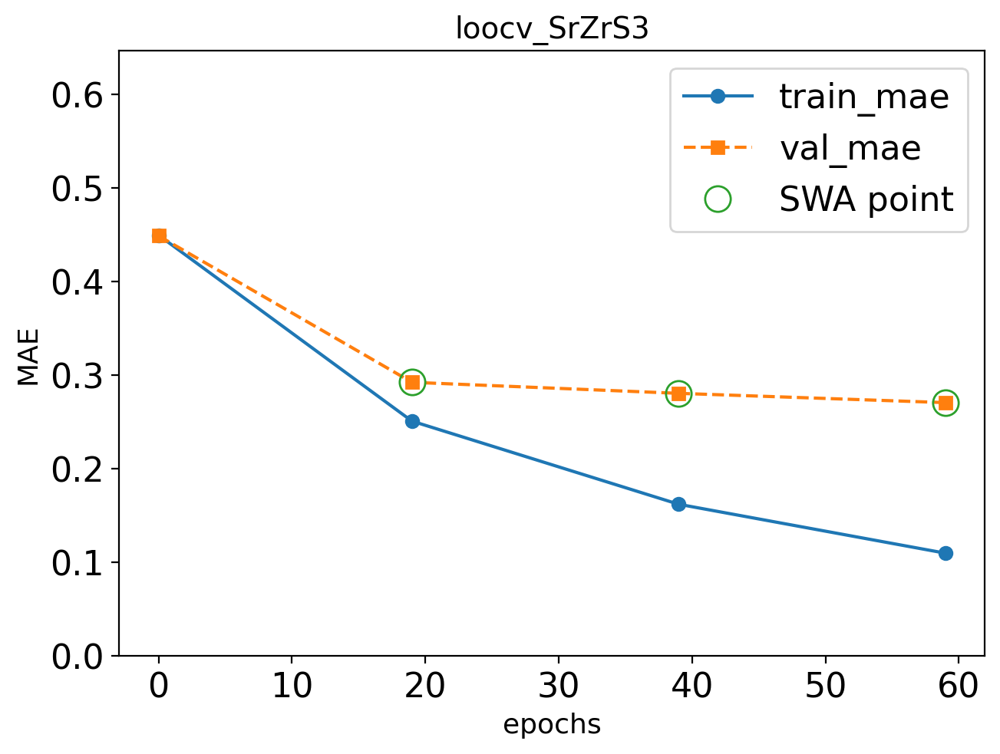

Epoch: 79/300 --- train mae: 0.0802 val mae: 0.269


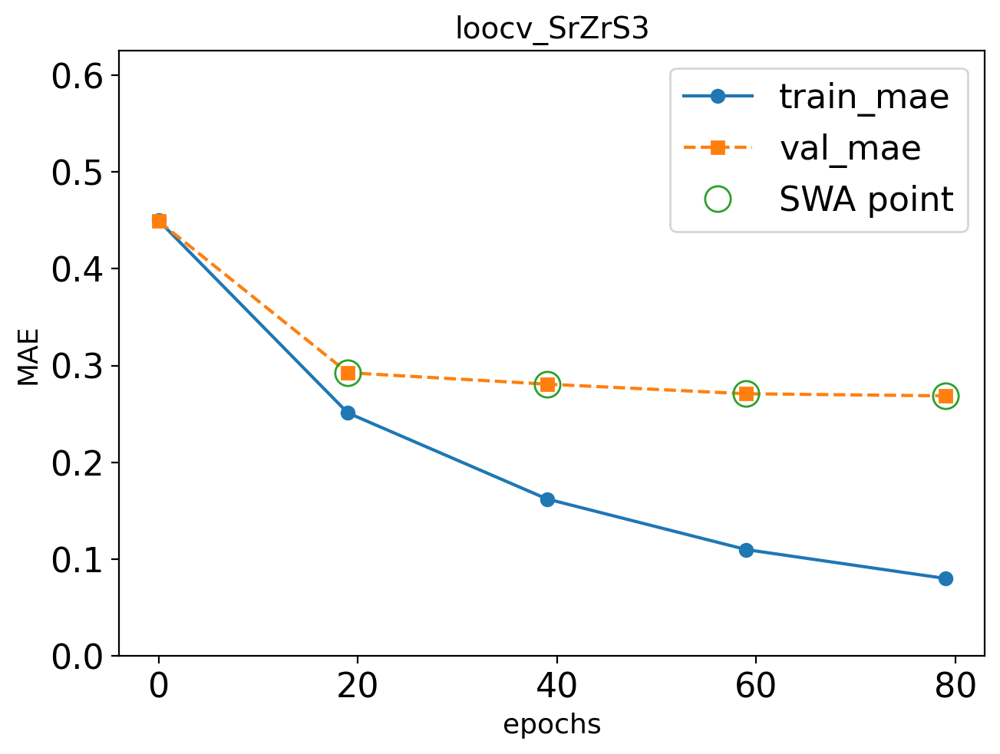

Epoch 99 failed to improve.
Discarded: 1/3 weight updates
Epoch: 99/300 --- train mae: 0.0615 val mae: 0.271


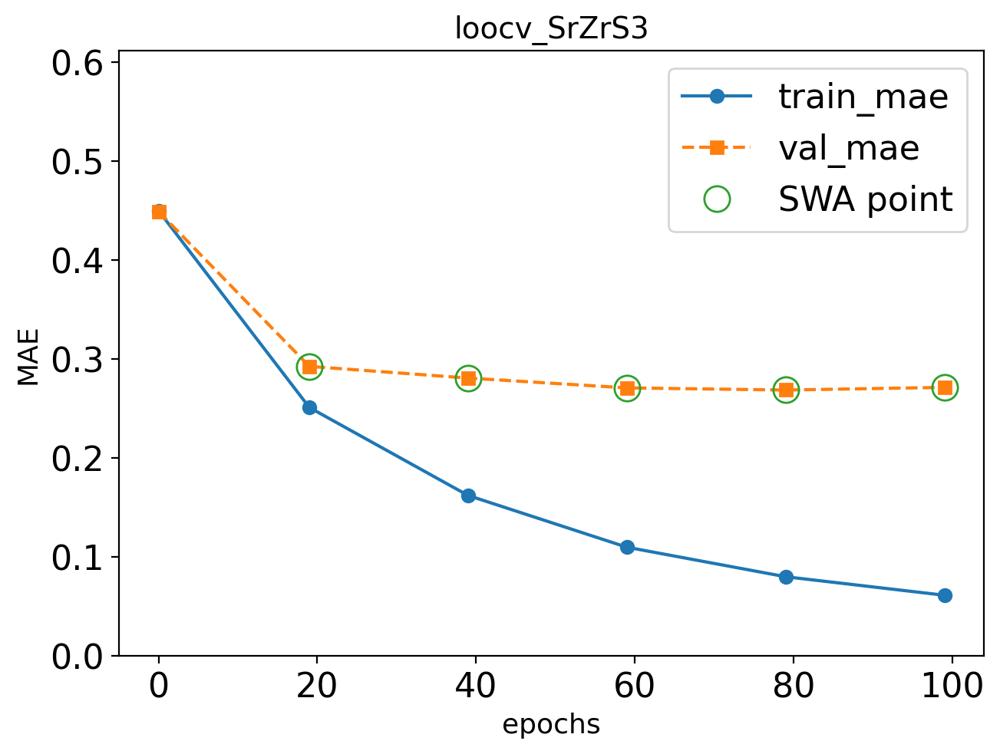

Epoch: 119/300 --- train mae: 0.0506 val mae: 0.27


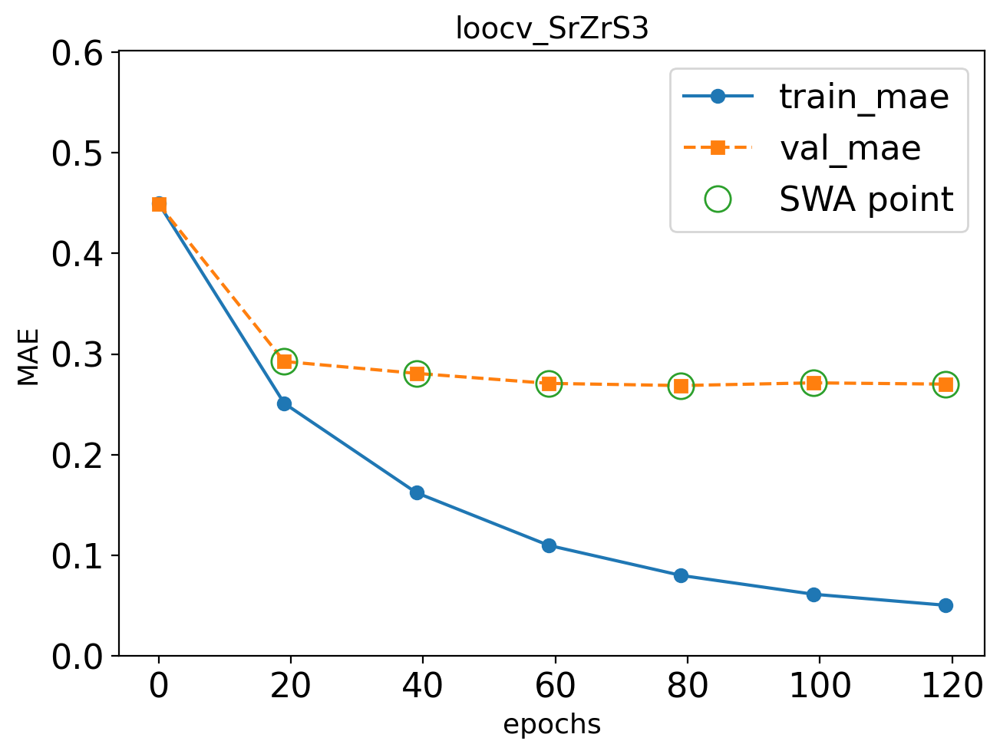

Epoch: 139/300 --- train mae: 0.044 val mae: 0.261


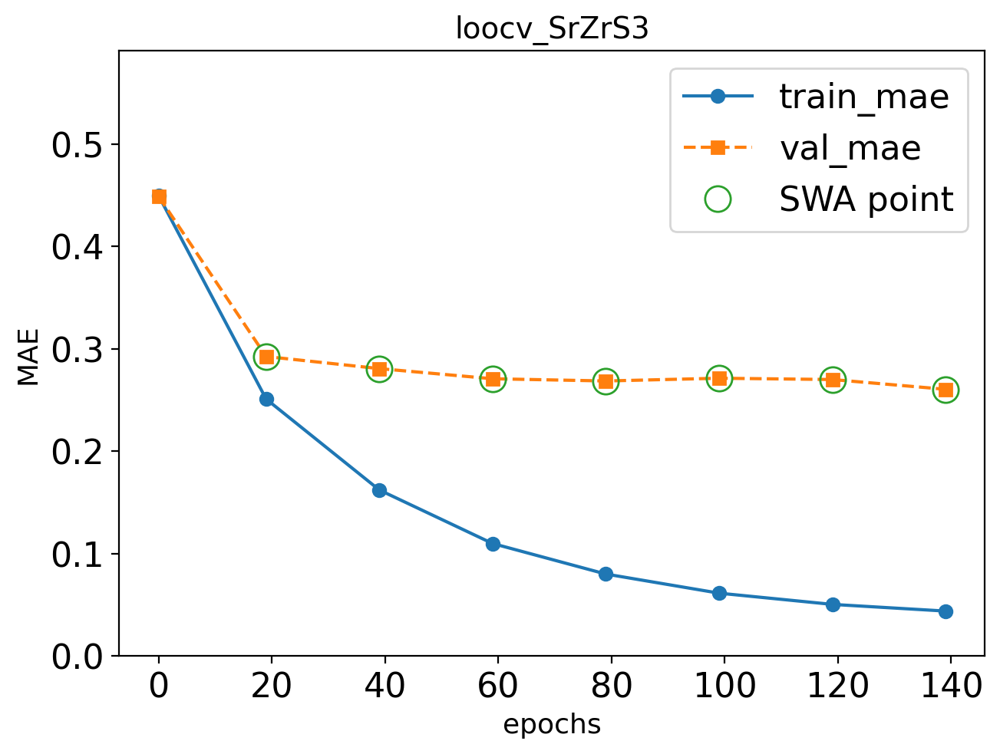

Epoch 159 failed to improve.
Discarded: 2/3 weight updates
Epoch: 159/300 --- train mae: 0.0384 val mae: 0.267


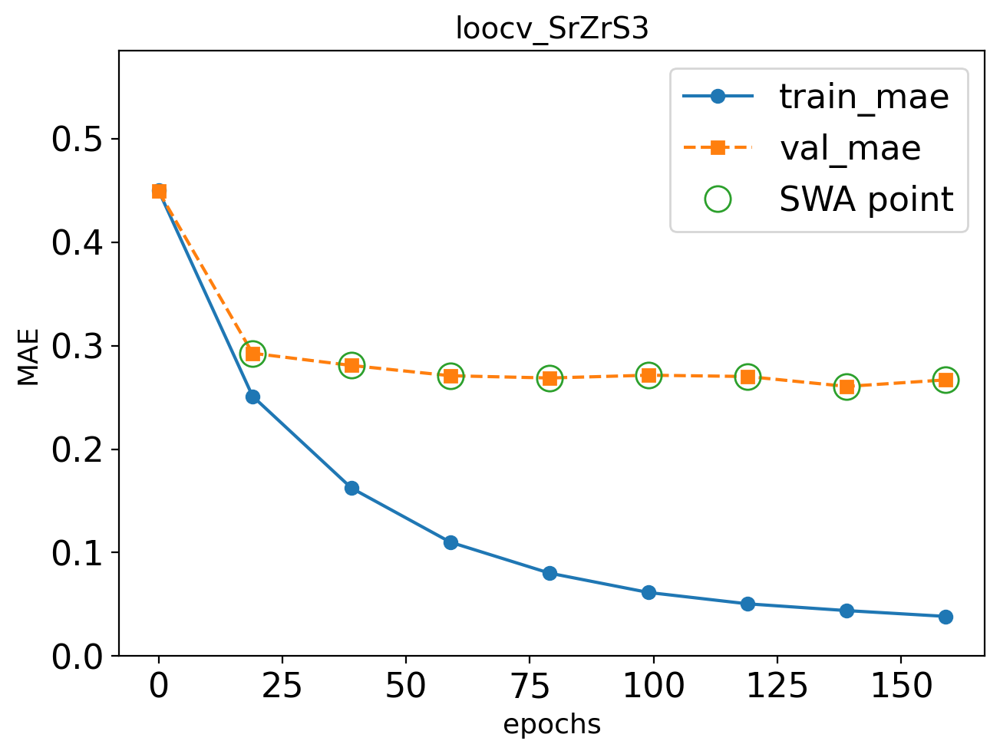

Epoch 179 failed to improve.
Discarded: 3/3 weight updates
Epoch: 179/300 --- train mae: 0.0345 val mae: 0.266


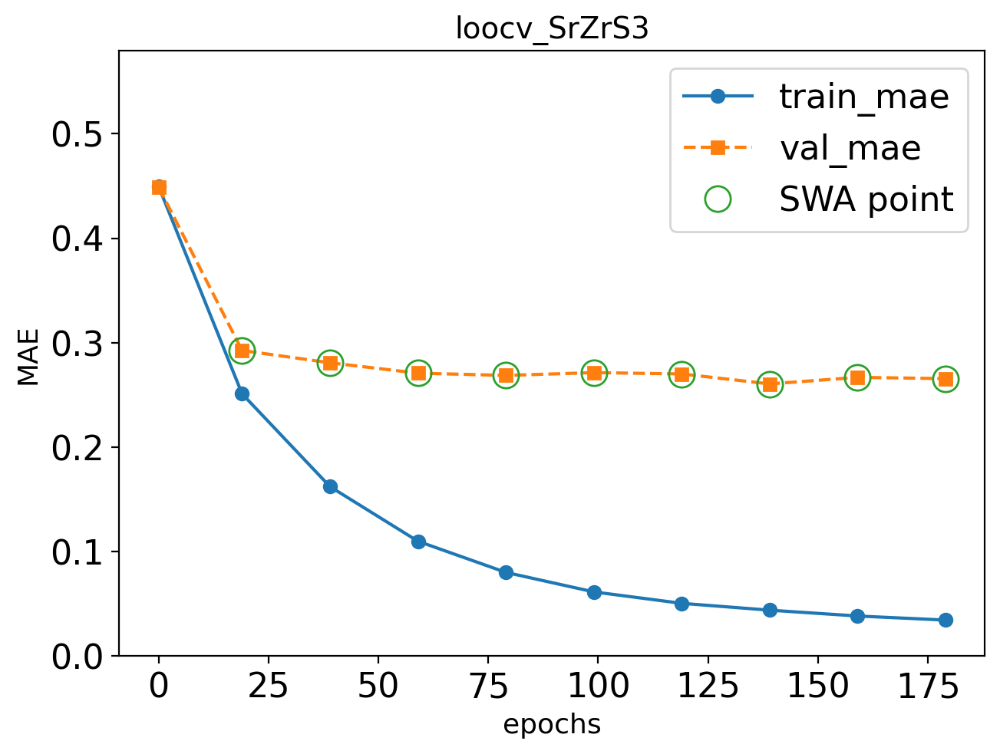

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_SrZrS3) to models/trained_models/loocv_SrZrS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11618.57formulae/s]

loading data with up to 9 elements in the formula
  Actual: 2.09 eV  |  Predicted: 1.82 ± 0.08 eV  |  Residual: -0.28 eV

=== LOOCV complete ===
LOOCV MAE: 0.173 eV  |  R²: 0.555


,formula,actual,predicted,sigma,residual,expt_std
0,Ba(Zr0.95Ti0.05)S3,1.630,1.619078,0.085465,-0.010922,0.000000
1,Ba(Zr0.96Ti0.04)S3,1.510,1.597340,0.055742,0.087340,0.000000
2,BaHfS3,2.115,1.651763,0.061660,-0.463237,0.077782
3,BaZr(S0.6Se0.4)3,1.760,1.725951,0.171660,-0.034049,0.000000
4,BaZrS3,1.855,1.776537,0.037182,-0.078463,0.082865
5,BaZrSe3,1.300,1.378850,0.019380,0.078850,0.000000
6,LaYS3,2.300,1.928796,0.047743,-0.371204,0.000000
7,SrHfS3,2.365,2.211348,0.671520,-0.153652,0.063640
8,SrZrS3,2.095,1.818872,0.079625,-0.276128,0.063640


In [9]:
loocv_results = []

for i, (held_out_formula, held_out_target) in enumerate(zip(chalc_formulas, chalc_targets)):
    print(f'\n--- LOOCV fold {i+1}/{len(chalc_formulas)}: holding out {held_out_formula} ---')

    # 1. Remove the held-out compound from the grouped data
    df_fold = df_grouped[df_grouped['formula'] != held_out_formula].copy()
    df_fold_no_src = df_fold.drop(columns=['source'])

    # 2. Compute Pettifor features & split (80/10/10 on the remaining data)
    train_fold, val_fold, _, feat_names = get_petiffor_features(
        df_fold_no_src, original_df=df, train=True
    )

    # 3. Train a fresh CrabNet on this fold
    model_fold = CrabNet(
        mat_prop='bandgap',
        model_name=f'loocv_{held_out_formula.replace(" ", "_")}',
        elem_prop='mat2vec',
        learningcurve=False,
        extend_features=feat_names,
    )
    model_fold.fit(train_fold, val_fold)

    # 4. Predict the held-out compound
    pred, sigma = predict_bandgap(held_out_formula, crabnet_model=model_fold)
    pred_val  = float(pred[0])
    sigma_val = float(sigma[0])

    residual = pred_val - held_out_target
    print(f'  Actual: {held_out_target:.2f} eV  |  Predicted: {pred_val:.2f} ± {sigma_val:.2f} eV  |  Residual: {residual:+.2f} eV')

    loocv_results.append({
        'formula': held_out_formula,
        'actual': held_out_target,
        'predicted': pred_val,
        'sigma': sigma_val,
        'residual': residual,
        'expt_std': chalc_expt_std[i],
    })

loocv_df = pd.DataFrame(loocv_results)
loocv_mae = mean_absolute_error(loocv_df['actual'], loocv_df['predicted'])
loocv_r2  = r2_score(loocv_df['actual'], loocv_df['predicted'])
print(f'\n=== LOOCV complete ===')
print(f'LOOCV MAE: {loocv_mae:.3f} eV  |  R²: {loocv_r2:.3f}')
loocv_df

---
## 7. Publication Parity Plot

Combined parity plot showing:
- **Test-set** predictions (color-coded by source)
- **LOOCV** chalcogenide perovskite predictions (highlighted with error bars
  and formula labels)
  - **Vertical bars** — model prediction uncertainty (σ)
  - **Horizontal bars** — experimental measurement spread (std dev from literature)

This is the main figure for Section 3.3 of the manuscript.

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 284426.00formulae/s]


skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.3819
MSE: 0.2673
MAE: 0.2579 eV


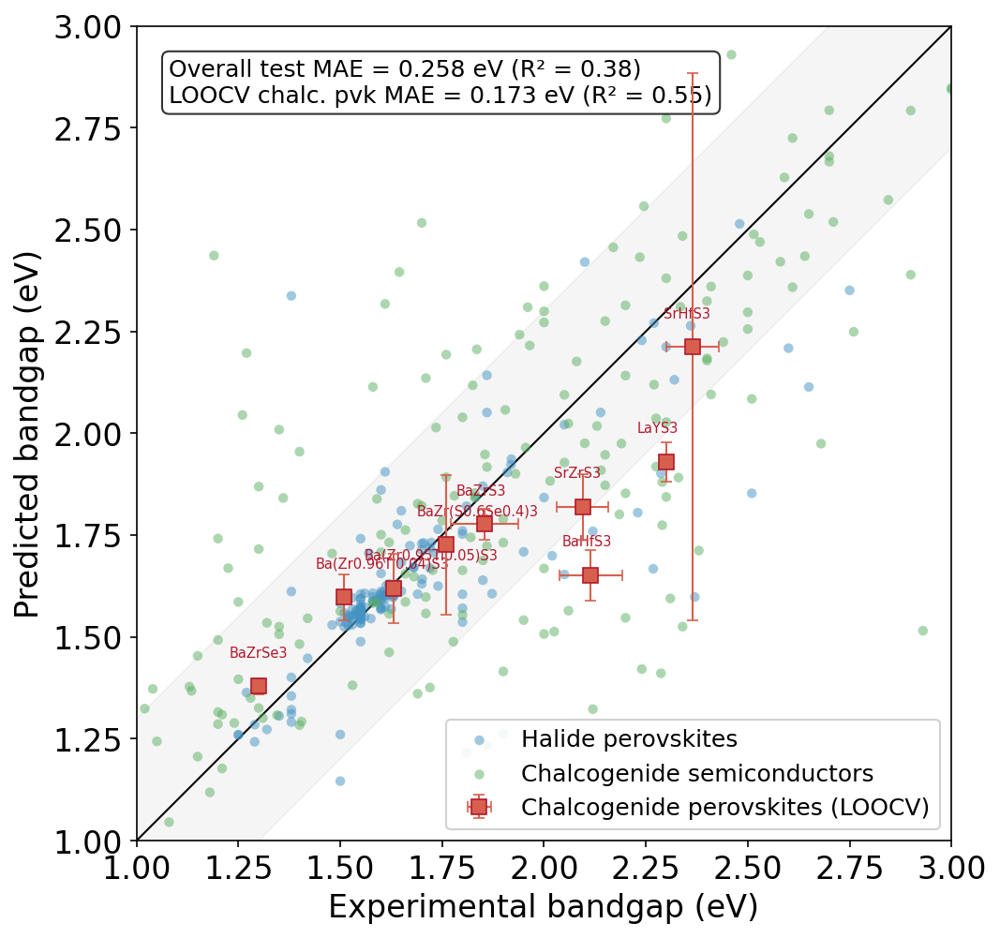

Saved to /Users/pepemarquez/git/Pepe-Marquez/TF-ChPVK-PV/reports/figures/parity_bandgap.pdf


In [31]:
# --- Gather test-set predictions by source ---
test_metrics = test_r2_score(test_df, feature_names, crabnet_bandgap=crabnet_bg, plot=False)

# Re-tag test-set entries with source
test_plot = test_df[['formula', 'target']].copy()
test_plot['predicted'] = test_metrics['predicted']
for formula in test_plot['formula']:
    test_plot.loc[test_plot['formula'] == formula, 'source'] = (
        df.loc[df['formula'] == formula, 'source'].values[0]
    )

# --- Build the plot ---
fig, ax = plt.subplots(figsize=(7, 7))

# Diagonal & ±0.3 eV band
lims = [1, 3.0]
ax.plot(lims, lims, 'k-', lw=1.0, zorder=1)
ax.fill_between(lims, [l - 0.3 for l in lims], [l + 0.3 for l in lims],
                alpha=0.08, color='grey', zorder=0)

# Color map for sources
source_style = {
    'pvk':          {'color': '#4393c3', 'label': 'Halide perovskites',       'marker': 'o', 's': 25, 'alpha': 0.5},
    'chalc_semicon': {'color': '#5aae61', 'label': 'Chalcogenide semiconductors', 'marker': 'o', 's': 25, 'alpha': 0.5},
}

for src, style in source_style.items():
    mask = test_plot['source'] == src
    ax.scatter(test_plot.loc[mask, 'target'], test_plot.loc[mask, 'predicted'],
               c=style['color'], marker=style['marker'], s=style['s'],
               alpha=style['alpha'], label=style['label'], edgecolors='none', zorder=2)

# LOOCV chalcogenide perovskites — larger, with both vertical (model σ) and
# horizontal (experimental std dev) error bars
ax.errorbar(
    loocv_df['actual'], loocv_df['predicted'],
    xerr=loocv_df['expt_std'],
    yerr=loocv_df['sigma'],
    fmt='s', color='#d6604d', markeredgecolor='#b2182b', markeredgewidth=0.8,
    markersize=8, elinewidth=1.0, capsize=3,
    label=f'Chalcogenide perovskites (LOOCV)', zorder=4,
)

# Formula labels for chalcogenide perovskites
for _, row in loocv_df.iterrows():
    ax.annotate(
        row['formula'], (row['actual'], row['predicted']),
        textcoords='offset points', xytext=(-15, 15),
        fontsize=7, color='#b2182b',
    )

# Annotations
test_mae = test_metrics['mae']
test_r2  = test_metrics['r2']
txt  = f'Overall test MAE = {test_mae:.3f} eV (R² = {test_r2:.2f})\n'
txt += f'LOOCV chalc. pvk MAE = {loocv_mae:.3f} eV (R² = {loocv_r2:.2f})'
ax.text(0.04, 0.96, txt, transform=ax.transAxes, va='top', fontsize=12,
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

ax.set_xlabel('Experimental bandgap (eV)')
ax.set_ylabel('Predicted bandgap (eV)')
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_aspect('equal')
ax.legend(loc='lower right', fontsize=12, framealpha=0.9)

fig.savefig(FIGURES_DIR / 'parity_bandgap.pdf')
fig.savefig(FIGURES_DIR / 'parity_bandgap.png')
plt.show()
print(f'Saved to {FIGURES_DIR / "parity_bandgap.pdf"}')

---
## 8. Null-Model Baselines

We compare the CrabNet predictions against trivial baselines (median and
mean predictor) to verify the model adds value beyond simple statistics.

In [13]:
from sklearn.metrics import mean_absolute_error as _mae

null_rows = []

# Test set
for strategy, fn in [('median', np.median), ('mean', np.mean)]:
    yhat = np.full(len(test_df), fn(test_df['target']))
    null_rows.append({'subset': 'test', 'strategy': strategy,
                      'MAE (eV)': _mae(test_df['target'], yhat)})
null_rows.append({'subset': 'test', 'strategy': 'CrabNet',
                  'MAE (eV)': test_metrics['mae']})

# Chalcogenide perovskites (LOOCV)
chalc_actual = loocv_df['actual'].values
for strategy, fn in [('median', np.median), ('mean', np.mean)]:
    yhat = np.full(len(chalc_actual), fn(chalc_actual))
    null_rows.append({'subset': 'chalc pvk (LOOCV)', 'strategy': strategy,
                      'MAE (eV)': _mae(chalc_actual, yhat)})
null_rows.append({'subset': 'chalc pvk (LOOCV)', 'strategy': 'CrabNet LOOCV',
                  'MAE (eV)': loocv_mae})

null_table = pd.DataFrame(null_rows)
null_table.style.format({'MAE (eV)': '{:.3f}'})

,subset,strategy,MAE (eV)
0,test,median,0.443
1,test,mean,0.472
2,test,CrabNet,0.258
3,chalc pvk (LOOCV),median,0.297
4,chalc pvk (LOOCV),mean,0.300
5,chalc pvk (LOOCV),CrabNet LOOCV,0.173


---
## 9. Ablation Studies — Data-Source Contribution

We train three ablation models to quantify the contribution of each data
source:

| Ablation | Training data |
|----------|---------------|
| `no_chalcogenides` | Halide perovskites + chalcogenide semiconductors |
| `halide_only` | Halide perovskites only |
| `chalc_semicon_only` | Chalcogenide semiconductors only |

After training each ablation model, we evaluate it on the **full set of 11
chalcogenide perovskite formulas** (not LOOCV — these are quick comparisons)
and on its own test split.

In [ ]:
# Prepare chalcogenide perovskite evaluation set (all 11 formulas, with Pettifor features)
df_chalc_all = df_grouped[df_grouped['source'] == 'chalcogenides'].copy()
df_chalc_all_no_src = df_chalc_all.drop(columns=['source'])
df_chalc_eval = get_petiffor_features(df_chalc_all_no_src, original_df=df, train=False)

ablations = {
    'no_chalcogenides':  {'filter': lambda d: d[d['source'] != 'chalcogenides'],
                          'model_name': 'perovskite_bg_prediction_no_chalcogenides'},
    'halide_only':       {'filter': lambda d: d[d['source'] == 'pvk'],
                          'model_name': 'Hal_perovskite_bg'},
    'chalc_semicon_only':{'filter': lambda d: d[d['source'] == 'chalc_semicon'],
                          'model_name': 'Ch_semicon_perovskite_bg'},
}

ablation_rows = []

for abl_name, cfg in ablations.items():
    print(f'\n{"="*60}')
    print(f'Ablation: {abl_name}')
    print(f'{"="*60}')

    df_abl = cfg['filter'](df_grouped).copy()
    df_abl_no_src = df_abl.drop(columns=['source'])

    train_abl, val_abl, test_abl, feat_abl = get_petiffor_features(
        df_abl_no_src, original_df=df, train=True
    )
    print(f'  Train: {len(train_abl)}  Val: {len(val_abl)}  Test: {len(test_abl)}')

    model_abl = CrabNet(
        mat_prop='bandgap',
        model_name=cfg['model_name'],
        elem_prop='mat2vec',
        learningcurve=True,
        extend_features=feat_abl,
    )
    model_abl.fit(train_abl, val_abl)

    # Evaluate on own test split
    m_test = test_r2_score(test_abl, feat_abl, crabnet_bandgap=model_abl, plot=False)

    # Evaluate on chalcogenide perovskites
    m_chalc = test_r2_score(df_chalc_eval, feat_abl, crabnet_bandgap=model_abl, plot=False)

    ablation_rows.append({
        'ablation': abl_name,
        'n_train': len(train_abl),
        'test MAE (eV)': m_test['mae'],
        'test R²': m_test['r2'],
        'chalc pvk MAE (eV)': m_chalc['mae'],
        'chalc pvk R²': m_chalc['r2'],
    })

ablation_table = pd.DataFrame(ablation_rows)
ablation_table.style.format({
    'test MAE (eV)': '{:.3f}', 'test R²': '{:.3f}',
    'chalc pvk MAE (eV)': '{:.3f}', 'chalc pvk R²': '{:.3f}',
})

KeyError: 0

---
## 10. Pettifor Feature Ablation

To quantify the contribution of the Pettifor composition fingerprint, we
retrain the full model **without** Pettifor features and compare.


Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2902/2902 [00:00<00:00, 322186.14formulae/s]


skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 276874.40formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.455 val mae: 0.455


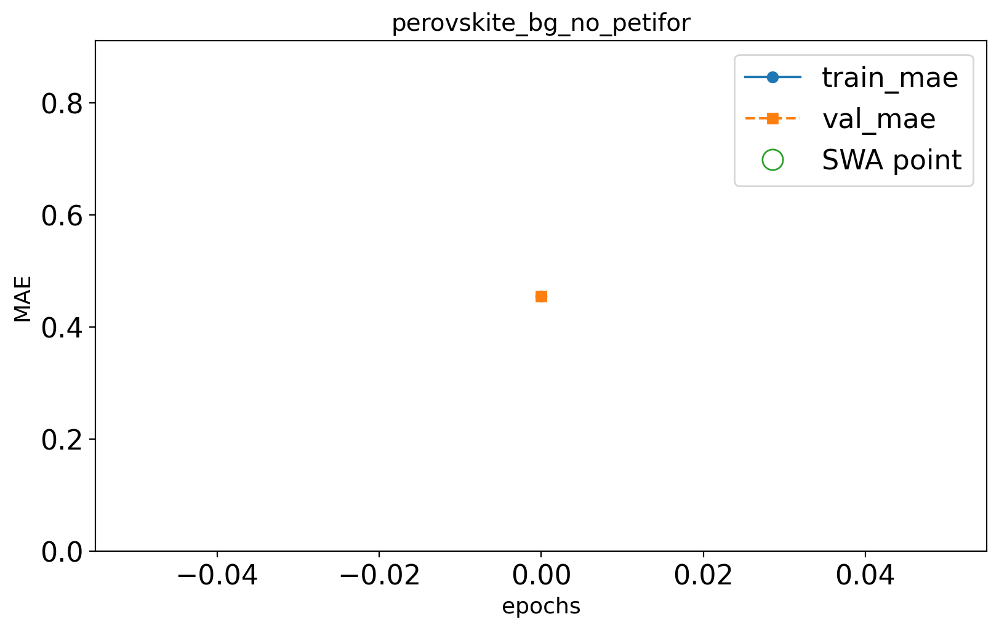

Epoch: 19/300 --- train mae: 0.248 val mae: 0.294


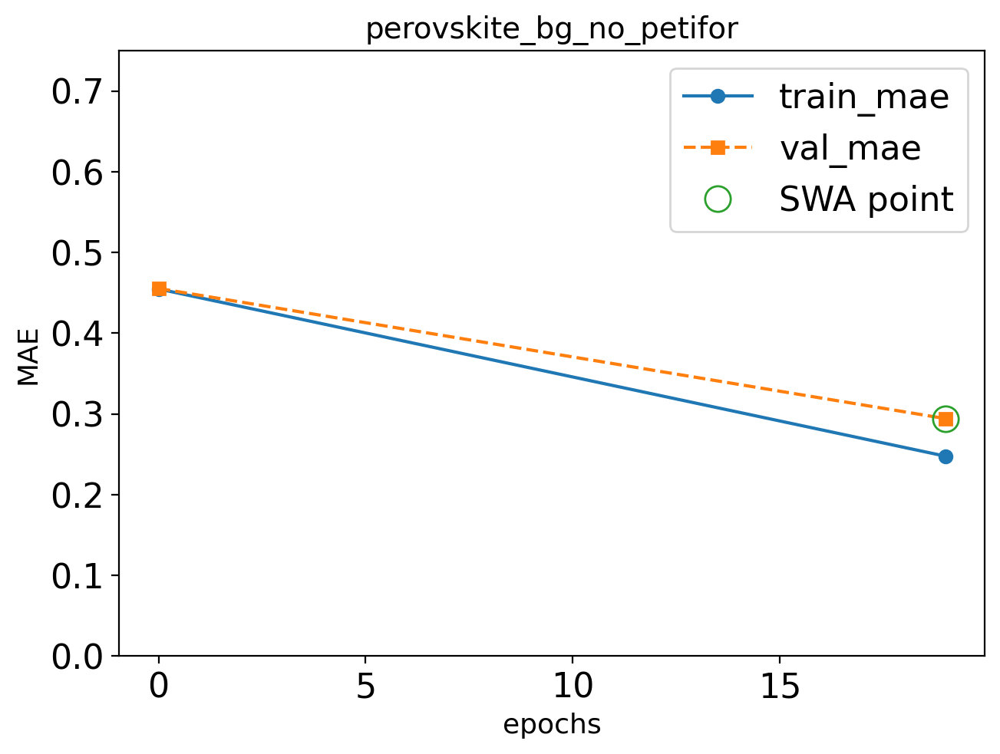

Epoch: 39/300 --- train mae: 0.16 val mae: 0.275


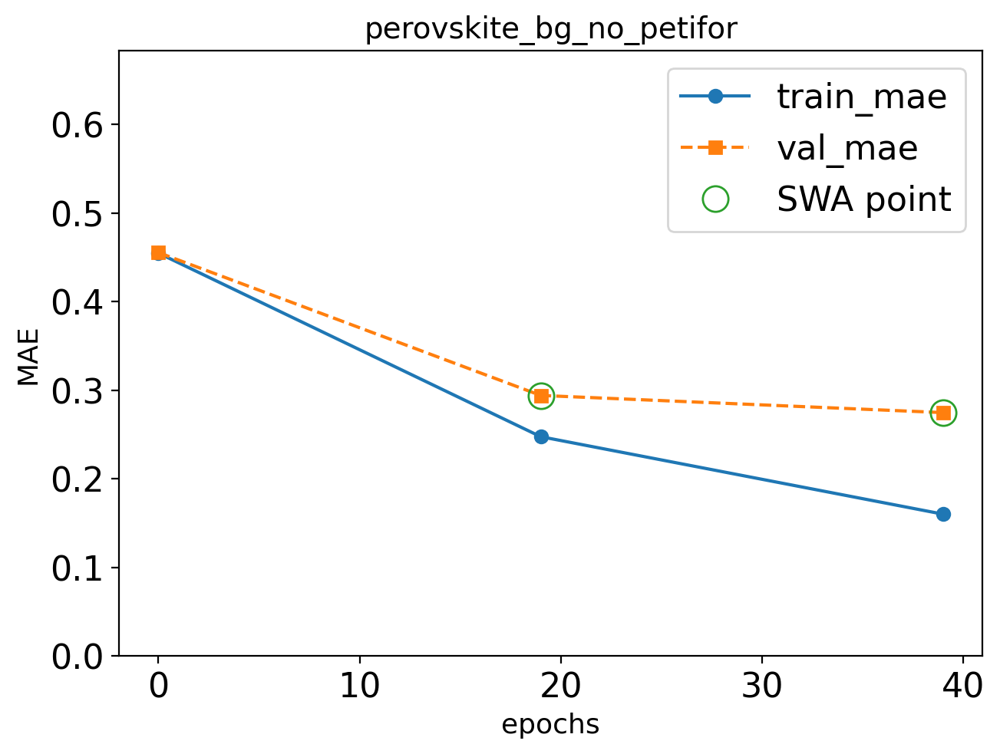

Epoch 59 failed to improve.
Discarded: 1/3 weight updates
Epoch: 59/300 --- train mae: 0.107 val mae: 0.281


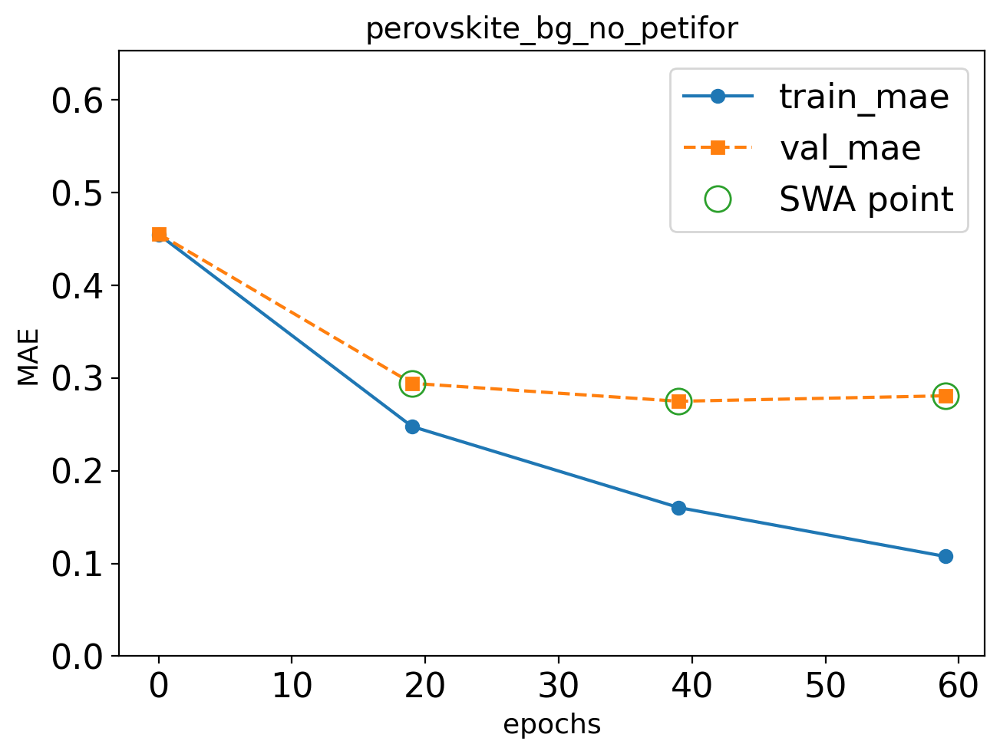

Epoch: 79/300 --- train mae: 0.079 val mae: 0.276


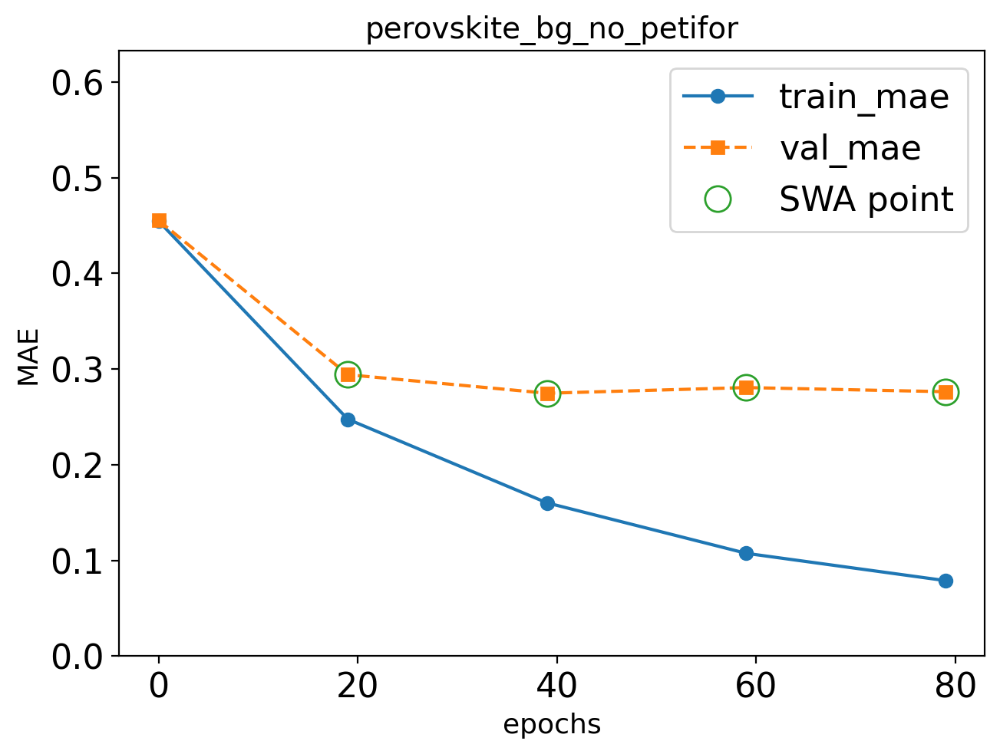

Epoch 99 failed to improve.
Discarded: 2/3 weight updates
Epoch: 99/300 --- train mae: 0.0609 val mae: 0.281


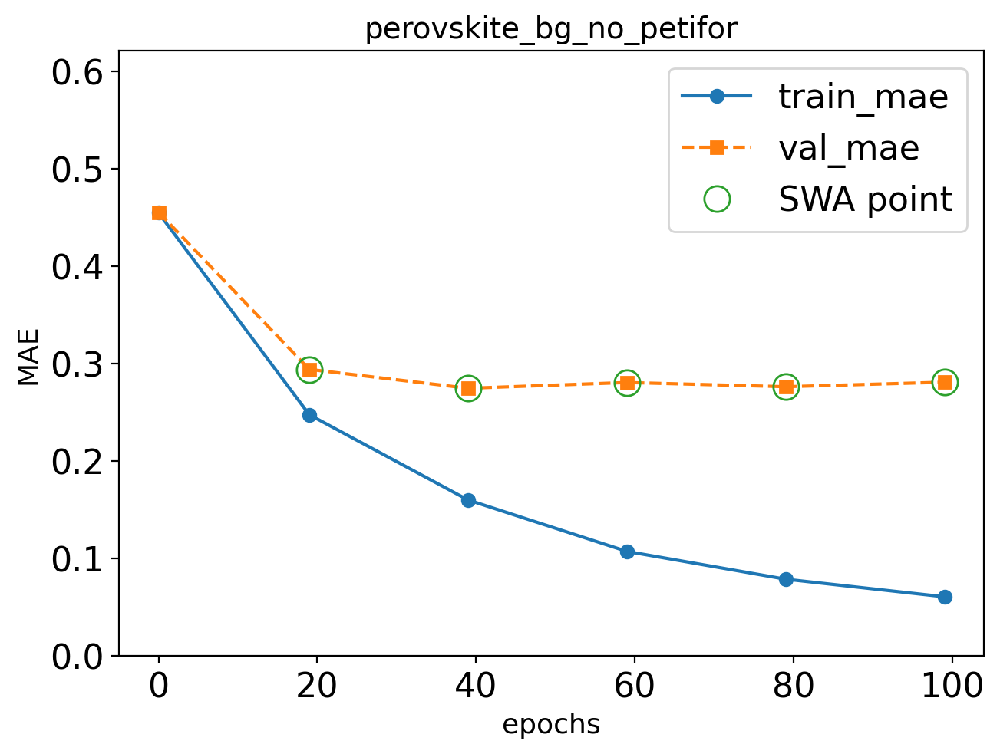

Epoch: 119/300 --- train mae: 0.0511 val mae: 0.276


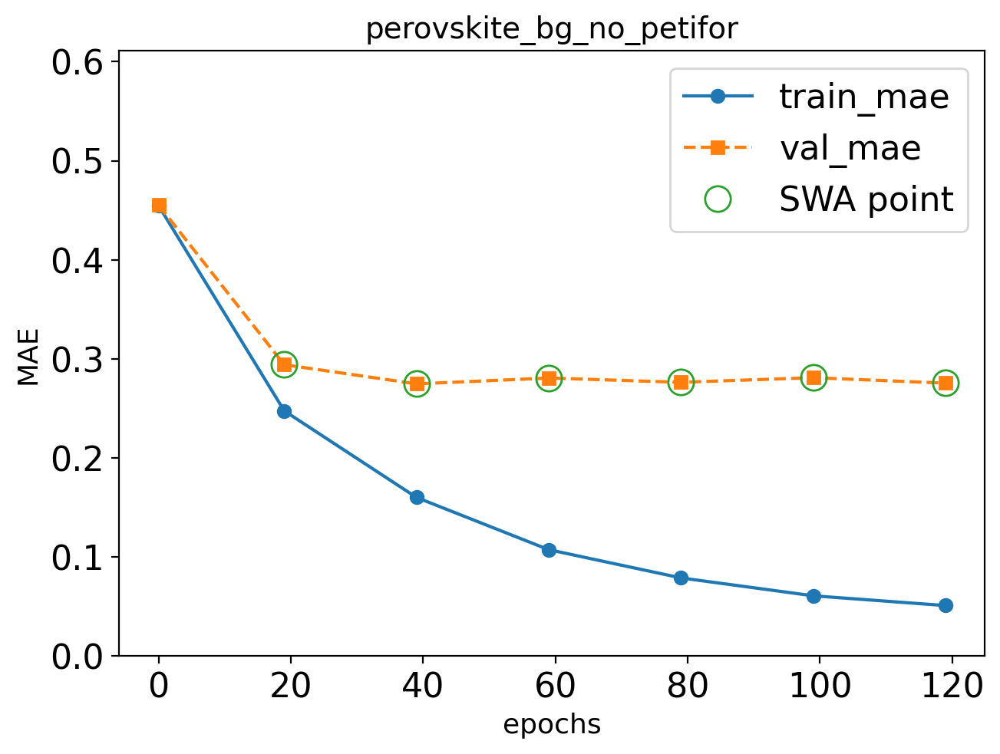

Epoch: 139/300 --- train mae: 0.0428 val mae: 0.275


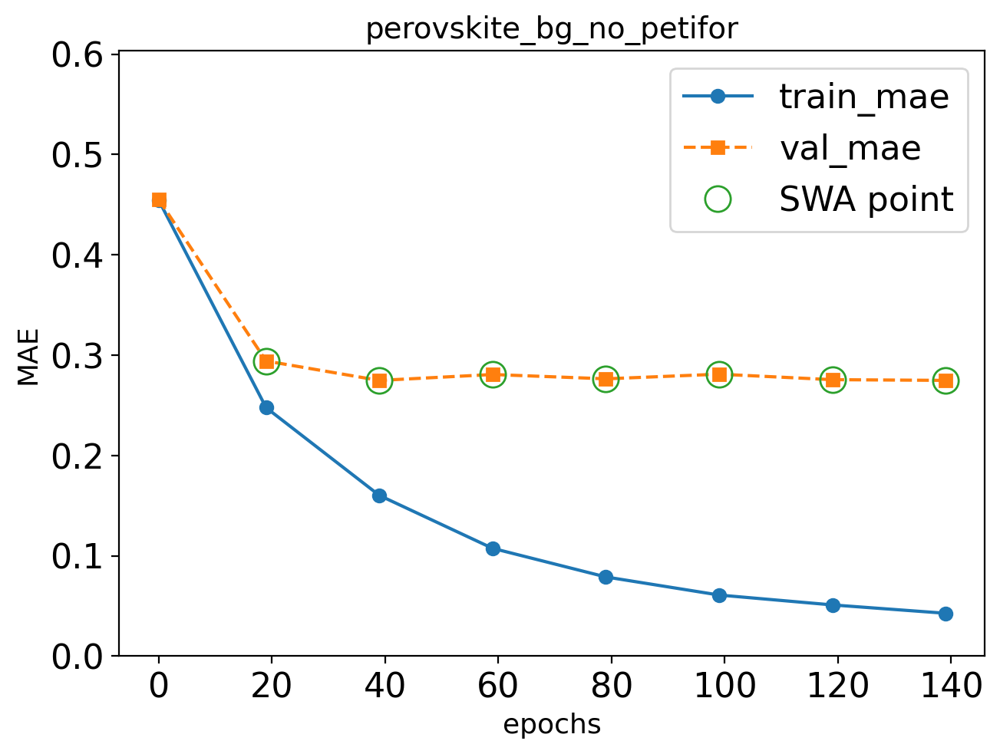

Epoch 159 failed to improve.
Discarded: 3/3 weight updates
Epoch: 159/300 --- train mae: 0.0376 val mae: 0.277


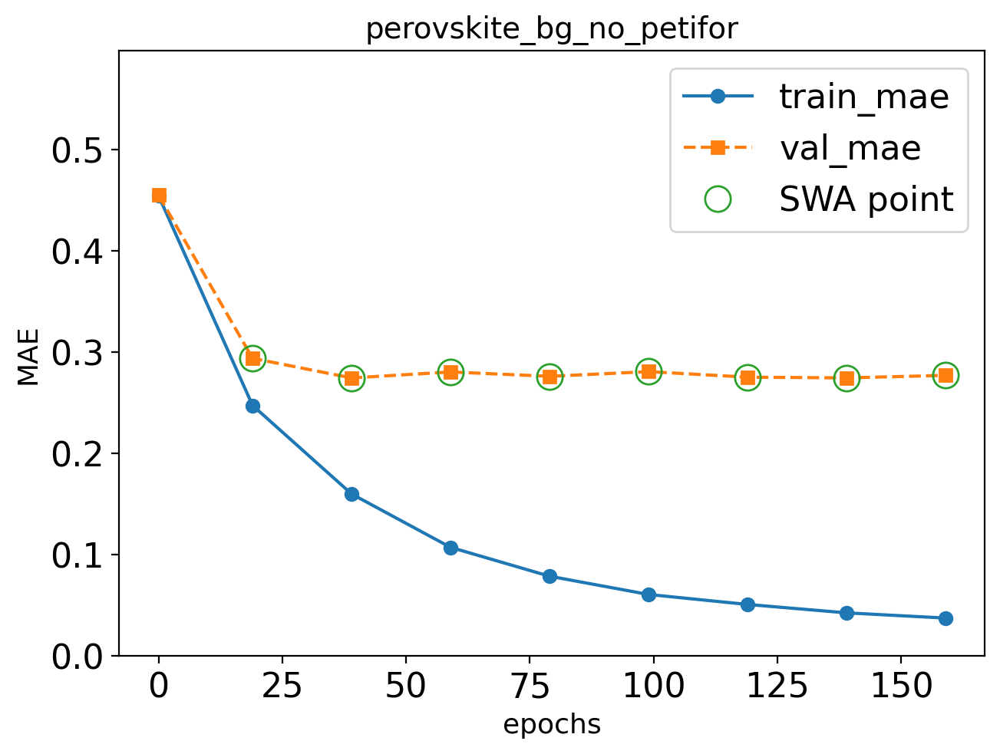

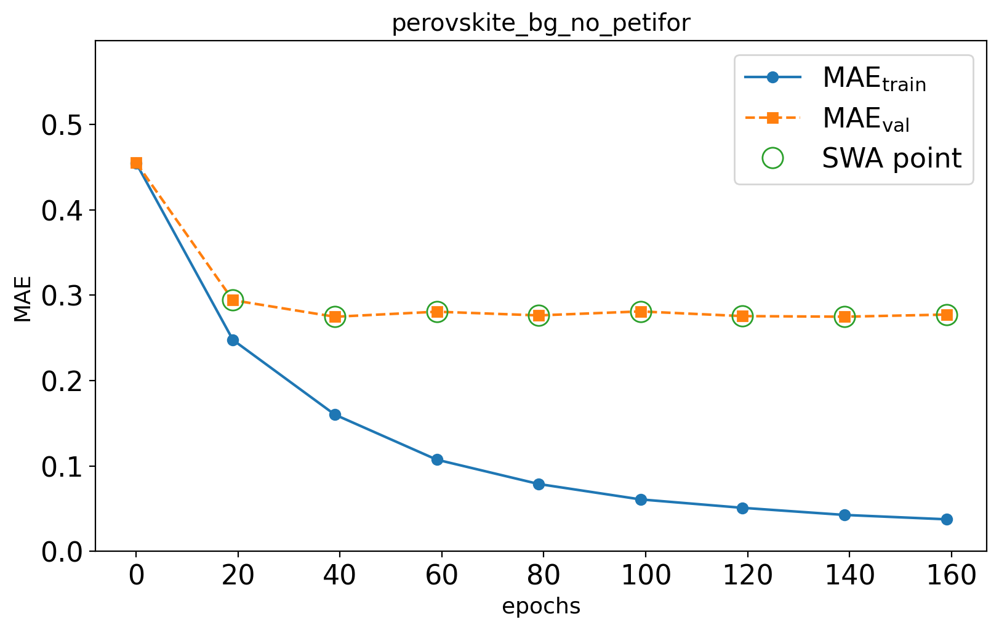

Discarded: 3/3weight updates, early-stopping now
Saving network (perovskite_bg_no_petifor) to models/trained_models/perovskite_bg_no_petifor.pth


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 318122.10formulae/s]

skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.3927
MSE: 0.2626
MAE: 0.2522 eV

       With Pettifor:  MAE = 0.258 eV,  R² = 0.382
    Without Pettifor:  MAE = 0.252 eV,  R² = 0.393
                       ΔMAE = -0.006 eV


In [ ]:
# Drop Pettifor columns from train/val/test
train_no_pf = train_df.drop(columns=feature_names)
val_no_pf   = val_df.drop(columns=feature_names)
test_no_pf  = test_df.drop(columns=feature_names)

model_no_pf = CrabNet(
    mat_prop='bandgap',
    model_name='perovskite_bg_no_petifor',
    elem_prop='mat2vec',
    learningcurve=True,
)
model_no_pf.fit(train_no_pf, val_no_pf)

m_no_pf = test_r2_score(test_no_pf, feature_names=None, crabnet_bandgap=model_no_pf, plot=False)

print(f'\n{"With Pettifor":>20s}:  MAE = {test_metrics["mae"]:.3f} eV,  R² = {test_metrics["r2"]:.3f}')
print(f'{"Without Pettifor":>20s}:  MAE = {m_no_pf["mae"]:.3f} eV,  R² = {m_no_pf["r2"]:.3f}')
delta_mae = m_no_pf['mae'] - test_metrics['mae']
print(f'{"":>20s}   ΔMAE = {delta_mae:+.3f} eV')

---
## 11. Predict Bandgap for Candidate Materials

We apply the main trained model to predict bandgaps for:
1. **CrystaLLM-generated** compositions (Section 3.2 of the manuscript)
2. **SISSO-screened** stable compositions (Section 3.1)
3. **Experimentally reported** chalcogenide perovskites (validation)

In [ ]:
# Load main model for predictions
crabnet_main = load_model()

print('--- CrystaLLM candidates ---')
df_crystallm = get_CrystaLLM_predictions(crabnet_model=crabnet_main)
print(f'Predicted {len(df_crystallm)} compositions\n')

print('--- SISSO candidates ---')
df_sisso = get_SISSO_predictions(crabnet_model=crabnet_main)
print(f'Predicted {len(df_sisso)} compositions\n')

print('--- Experimental chalcogenide perovskites ---')
df_expt = get_experimental_predictions(crabnet_model=crabnet_main)


Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cpu
--- CrystaLLM candidates ---


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 14074.85formulae/s]

loading data with up to 3 elements in the formula


RuntimeError: Placeholder storage has not been allocated on MPS device!

---
## 12. Summary

| Metric | Value |
|--------|-------|
| Overall test MAE | *see table in §5* |
| LOOCV chalc. pvk MAE | *see table in §6* |
| Pettifor ablation ΔMAE | *see §10* |

**Key findings:**
- The combined three-source training set enables CrabNet to generalize across
  halide and chalcogenide chemistry domains.
- LOOCV on chalcogenide perovskites provides a per-compound error that
  is more meaningful than the single test-set point available in a random split.
- The Pettifor composition fingerprint (**extend_features**) improves the MAE;
  the ablation quantifies this contribution.
- Encoder comparison is available in notebook **4.1**.